# Imports

In [1]:
root_dir = '../'

In [2]:
import gzip
import pickle
import platform 
from random import choice
import scipy.stats
import gi
from gi.repository import Gtk, Gdk
import graph_tool.all as gt
import graph_tool as graph_tool
import pandas as pd
import numpy as np
import os
import copy
import time
from sklearn.feature_extraction import text
from nltk.stem import  WordNetLemmatizer
import re
from tqdm.notebook import tqdm
from datetime import datetime
import json
from scipy.stats import linregress
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap
import random
import seaborn as sn
import networkx as nx
from networkx.drawing.nx_agraph import write_dot, graphviz_layout
from IPython.display import display

# move to repo root folder
os.chdir(root_dir)
import sys
sys.path.insert(0, os.path.join(os.getcwd(),"utils"))
from utils import sbmmultilayer 
# from hsbm.utils.nmi import * 
from utils.doc_clustering import construct_nmi_matrix # *
from hsbm_creation import *
# from hsbm_fit import *
from hsbm_partitions import *
from hsbm_knowledge_flow import *
from hsbm_analysis_topics import *

import distinctipy

/tmp/2544852.1.all.q/ipykernel_145253/62744574.py:7: PyGIWarning: Gtk was imported without specifying a version first. Use gi.require_version('Gtk', '3.0') before import to ensure that the right version gets loaded.
  from gi.repository import Gtk, Gdk
[nltk_data] Downloading package wordnet to
[nltk_data]     /data/home/ahw701/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /data/home/ahw701/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# DEFAULT PARAMETERS IN THE FIGURES TO BE ADJUSTED!!!!

plt.style.use("default")

height_fig = 8
width_fig = 21

params_default = {
    # no upper and right axes
    'axes.spines.right' : False,
    'axes.spines.top' : False,
    # no frame around the legend
    "legend.frameon" : False,

    # dimensions of figures and labels
    # we will play with these once we see how they are rendered in the latex
    'figure.figsize' : (width_fig, height_fig),

    'axes.labelsize' : 22,
    'axes.titlesize' : 25,
    'xtick.labelsize' : 18,
    'ytick.labelsize' : 18,
    'legend.fontsize' : 16, 
    
    # no grids (?)
    'axes.grid' : False,

    # the default color(s) for lines in the plots: in order if multiple lines. We can change them or add colors if needed
#     'axes.prop_cycle' : mpl.cycler(color=["#00008B", "#BF0000", "#006400"]), 

    # default quality of the plot. Not too high but neither too low
    "savefig.dpi" : 100,
    "savefig.bbox" : 'tight', 
    
    # To use standard latex font
#     'mathtext.fontset': 'stix',
#     'font.family': 'STIXGeneral',
    # to use sans serif arial, i.e., standard figure font
    'font.family' : 'sans-serif',
    'font.sans-serif' : 'Arial', # 'Tahoma', # 'Comic Sans MS'
    'mathtext.fontset' : 'custom',
    'mathtext.it' : 'Arial:italic',
    'mathtext.rm' : 'Arial',
}

plt.rcParams.update(params_default)

In [4]:
# To make colored prints!
class print_color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [5]:
def split_words(string):
    '''
        Get a string and divide into list of words and other characters.
        
        Paramaters
        ----------
            string: string to split (str)
        
        Returns
        ----------
            words: list of words and characters (list of str)
    '''
    words = []
    word_tmp = ""
    for letter in string:
        if letter in "QWERTYUIOPASDFGHJKLZXCVBNMqwertyuiopasdfghjklzxcvbnm":
            word_tmp += letter
        else:
            words.append(word_tmp)
            words.append(letter)
            word_tmp = ""
    if letter in "QWERTYUIOPASDFGHJKLZXCVBNMqwertyuiopasdfghjklzxcvbnm":
        words.append(word_tmp)
    return words

# Loading data

In [6]:
corpus_version = '2022-01-01'
all_dataset_path = f"data/{corpus_version}/"
dataset_path = f"data/{corpus_version}/decentralization/"
paper_figures_folder = f"figures/"

In [7]:
filter_label = '' # if you want a specific label to do some testing
min_inCitations = 0
min_word_occurences = 5
use_titles = True

In [8]:
results_folder = os.path.join(dataset_path,f'{min_inCitations}_min_inCitations_{min_word_occurences}_min_word_occurrences/')

chosen_text_attribute = 'paperAbstract'
if use_titles:
    # USE TITLES TEXT INSTEAD OF ABSTRACTS
    print('Using titles text instead of abstracts!', flush=True)
    chosen_text_attribute = 'title'
    results_folder = results_folder[:-1] + '_titles/'
prep_results_folder = results_folder

# results_folder += 'ID_1_no_iterMC_5000/'
results_folder += 'consensus_all_100_iter/'

Using titles text instead of abstracts!


In [9]:
number_iterations_MC_equilibrate = 5000
ID_iteration_list = list(range(1,101))
dir_list = [os.path.join(results_folder, f'ID_{ID_iteration}_no_iterMC_{number_iterations_MC_equilibrate}/') for ID_iteration in ID_iteration_list]

## Load prep files

In [10]:
print('\nLoading data set')
with gzip.open(f'{dataset_path}papers_dict.pkl.gz', 'rb') as fp:
    all_docs_dict = pickle.load(fp)

print(all_docs_dict['a00017fee08f765c31ad7d80d87ddf0d88e2f352'].keys())

# Check that every doc has the chosen attribute
all_docs_dict = {x:all_docs_dict[x] for x in all_docs_dict if chosen_text_attribute in all_docs_dict[x] and all_docs_dict[x][chosen_text_attribute] is not None and len(all_docs_dict[x][chosen_text_attribute])>0}
print('total number of docs: %d'%(len(all_docs_dict)))


Loading data set
dict_keys(['id', 'title', 'paperAbstract', 'authors', 'inCitations', 'outCitations', 'year', 's2Url', 'sources', 'pdfUrls', 'venue', 'journalName', 'journalVolume', 'journalPages', 'doi', 'doiUrl', 'pmid', 'fieldsOfStudy', 'magId', 's2PdfUrl', 'entities'])
total number of docs: 425144


In [11]:
# tokenized texts
tokenized_texts_dict = load_tokenized_texts_dict(
    all_docs_dict, 
    prep_results_folder, 
    chosen_text_attribute=chosen_text_attribute, 
    file_name = 'tokenized_texts_dict_all.pkl.gz'
)

tokenized_texts_dict loaded from file.


In [12]:
# article category (fields of study)
article_category = load_article_category(
    all_docs_dict, 
    prep_results_folder, 
    file_name = 'article_category_all.pkl.gz'
)

article_category loaded from file.


In [13]:
# citations edgelist (hyperlinks)
sorted_paper_ids_with_texts = list(tokenized_texts_dict.keys())
citations_df = load_citations_edgelist(
    all_docs_dict, 
    sorted_paper_ids_with_texts, 
    prep_results_folder, 
    file_name = 'citations_edgelist_all.csv'
)

citations_edgelist loaded from file.


In [14]:
# FILTER NETWORK
ordered_papers_with_cits, new_filtered_words, IDs, texts, edited_text = filter_dataset(
    all_docs_dict,
    tokenized_texts_dict,
    min_inCitations,
    min_word_occurences,
    prep_results_folder,
    filter_label,
)

original number of docs 425144
original number of different words 173198
filtered number of docs 181605
filtered number of different words 65054
number of doc-doc links: 590215
Number of new filtered words 15381
number of word-doc links: 1396830


In [15]:
# CREATE OR LOAD GT OBJECT
hyperlink_g, hyperlinks = create_hyperlink_g(
    article_category,
    prep_results_folder,
    filter_label
)


Loaded gt object


In [16]:
# ACHTUNG: h_t_doc_consensus is (for some reason) not ordered like edited_text, 
# but with the same order as hyperlink_g.vp['name']... 
ordered_paper_ids = list(hyperlink_g.vp['name'])
all_papers_ids = set(ordered_paper_ids)
# ordered_edited_texts = [edited_text[IDs.index(paper_id)] for paper_id in ordered_paper_ids]

In [17]:
# COMPUTE OR LOAD CENTRALITIES
centralities = load_centralities(
    all_docs_dict,
    citations_df,
    ordered_paper_ids,
    hyperlink_g, 
    prep_results_folder,
    filter_label,
)
print('\nFinished retrieving preparation files.')


Loaded centralities.

Finished retrieving preparation files.


## Retrieve hSBM results

In [18]:
# Retrieve the partitions assigned to the document nodes by examining the highest non-trivial level of the hierarchical degree-corrected SBM.
hyperlink_text_hsbm_partitions, levels = get_highest_level_hsbm_partitions_from_iterations(
    hyperlink_g,
    dir_list, 
    results_folder,
)
print('Highest levels in each state:')
print(levels)

Loaded 100 partitions from data/2022-01-01/decentralization/0_min_inCitations_5_min_word_occurrences_titles/consensus_all_100_iter/
Highest levels in each state:
[5, 5, 5, 5, 6, 5, 6, 5, 4, 5, 5, 7, 5, 5, 6, 5, 5, 7, 5, 5, 6, 5, 6, 5, 6, 5, 6, 7, 5, 5, 6, 5, 5, 6, 5, 6, 6, 5, 6, 8, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 7, 6, 5, 6, 5, 4, 6, 5, 5, 6, 5, 6, 6, 5, 5, 6, 5, 5, 5, 5, 6, 6, 4, 6, 5, 5, 6, 4, 7, 5, 5, 5, 7, 6, 4, 5, 7, 5, 7, 6, 5, 6, 6, 5, 5, 5, 7, 7, 7]


In [19]:
# Compute the consensus partition assignment to document nodes over all the runs.
hyperlink_text_hsbm_partitions_by_level,duration = get_hsbm_partitions_from_iterations(
    hyperlink_g,
    dir_list, 
    levels,
    results_folder,
)

Loaded partitions from data/2022-01-01/decentralization/0_min_inCitations_5_min_word_occurrences_titles/consensus_all_100_iter/


In [20]:
H_T_word_hsbm_partitions_by_level, H_T_word_hsbm_num_groups_by_level = get_hsbm_word_partitions_from_iterations(
    hyperlink_g,
    dir_list, 
    levels,
    results_folder,
    IDs
)

Loaded word partitions from data/2022-01-01/decentralization/0_min_inCitations_5_min_word_occurrences_titles/consensus_all_100_iter/


In [21]:
h_t_doc_consensus_by_level, h_t_word_consensus_by_level, h_t_consensus_summary_by_level = get_consensus(
    dir_list,
    hyperlink_text_hsbm_partitions_by_level,
    H_T_word_hsbm_partitions_by_level,
    ordered_paper_ids,
    results_folder,
    filter_label = ''
)

Loaded consensus from file


In [22]:
# We can now retrieve the top 10 words associated to topics associated to the consensus partition thanks to topics_df_by_level
topics_df_by_level, mixture_proportion_by_level, normalized_mixture_proportion_by_level, avg_topic_frequency_by_level = get_mixture_proportion(
    h_t_doc_consensus_by_level = h_t_doc_consensus_by_level, 
    results_folder = results_folder,
    ordered_edited_texts = None,
    dict_groups_by_level = None, 
    topics_df_by_level = None,
    filter_label = ''
)

Loaded mixture proportion from file


In [23]:
highest_non_trivial_level = sorted(topics_df_by_level.keys())[-1]
highest_non_trivial_level

6

In [24]:
# let's also take the mixture proportion from one cluster at one level to another topic at any other level
mixture_proportion_by_level_partition_by_level_topics, normalized_mixture_proportion_by_level_partition_by_level_topics, avg_topic_frequency_by_level_partition_by_level_topics = get_mixture_proportion_by_level(
    h_t_doc_consensus_by_level = h_t_doc_consensus_by_level, 
    dict_groups_by_level = None, 
    ordered_edited_texts = None,
    topics_df_by_level = None,
    highest_non_trivial_level = highest_non_trivial_level,
    results_folder = results_folder,
    filter_label = ''
)

Loaded mixture proportion by level from file


In [25]:
# Hierarchy dictionary, to see which clusters at one level below belong to a certain cluster
hierarchy_docs,hierarchy_words = get_hierarchy(
    highest_non_trivial_level = highest_non_trivial_level,
    h_t_doc_consensus_by_level = h_t_doc_consensus_by_level,
    h_t_word_consensus_by_level = h_t_word_consensus_by_level,
    results_folder = results_folder,
    filter_label = filter_label,
)

Loaded hierarchy from file


## Change order of partitions for better figures

In [26]:
# Swap Cluster 1 and 2 at level 5
for i,cluster in enumerate(h_t_doc_consensus_by_level[5]):
    if cluster == 1:
        h_t_doc_consensus_by_level[5][i] = 2
    if cluster == 2:
        h_t_doc_consensus_by_level[5][i] = 1

In [27]:
tmp = hierarchy_docs[5][1]
hierarchy_docs[5][1] = hierarchy_docs[5][2]
hierarchy_docs[5][2] = tmp

In [28]:
# We want to reorder the partitions at the lowest level shown in the figures
# Here we consider all those clusters at level 3 that are kept (>500 papers) and reorder them from 0 to n-1
list_clusters_level_3_to_keep = [0, 3, 5, 6, 12, 8, 1, 18, 9, 11, 10, 13, 2, 4, 14, 7]
list_clusters_level_3_to_discard = list(set(h_t_doc_consensus_by_level[3]).difference(set(list_clusters_level_3_to_keep)))
remap_lev_3 = {}
for cluster in list_clusters_level_3_to_keep:
    remap_lev_3[cluster] = list_clusters_level_3_to_keep.index(cluster)
for cluster in list_clusters_level_3_to_discard:
    remap_lev_3[cluster] = list_clusters_level_3_to_discard.index(cluster) + len(list_clusters_level_3_to_keep)

In [29]:
for i,cluster in enumerate(h_t_doc_consensus_by_level[3]):
    if cluster in list_clusters_level_3_to_keep:
        h_t_doc_consensus_by_level[3][i] = remap_lev_3[cluster]
    else:
        h_t_doc_consensus_by_level[3][i] = remap_lev_3[cluster]

In [30]:
hierarchy_docs2 = copy.deepcopy(hierarchy_docs)

for cluster4, clusters3 in hierarchy_docs2[4].items():
    hierarchy_docs[4][cluster4] = set([remap_lev_3[x] for x in clusters3])

for cluster3, clusters2 in hierarchy_docs2[3].items():
    hierarchy_docs[3][remap_lev_3[cluster3]] = clusters2

### name2partition

In [31]:
# WORKS WITH MORE THAN 1 ITERATION (in teoria va bene sempre...)
name2partition_by_level = {max(list(h_t_doc_consensus_by_level.keys()))+1 : {x:0 for x in ordered_paper_ids}}

for level in h_t_doc_consensus_by_level.keys():
    name2partition_by_level[level] = {}
    for i,paper_id in enumerate(list(hyperlink_g.vp["name"])):
        name2partition_by_level[level][paper_id] = h_t_doc_consensus_by_level[level][i]

In [32]:
doc_partition_remapping_by_level = {}
doc_partition_remapping_by_level_inverse = {}
for level in name2partition_by_level:
    if level != max(list(h_t_doc_consensus_by_level.keys()))+1:
        doc_partition_remapping_by_level[level] = {}
        doc_partition_remapping_by_level_inverse[level] = {}
        lista1 = []
        for paper in ordered_paper_ids:
            lista1.append(name2partition_by_level[level][paper])
        lista2 = h_t_doc_consensus_by_level[level]
        for part1, part2 in set(list(zip(lista1,lista2))):
            if part1 in doc_partition_remapping_by_level[level]:
                print("THERE ARE MULTIPLE INSTANCES... ERROR")
                break
            else:
                doc_partition_remapping_by_level[level][part1] = part2  
                doc_partition_remapping_by_level_inverse[level][part2] = part1

## KF

In [33]:
knowledge_flow_normalized_per_field_in_time_by_level = {}
knowledge_flow_normalized_per_field_in_time_to_future_by_level = {}

for lev in [0,1,2,3,4,5]:
    knowledge_flow_normalized_per_field_in_time_by_level[lev] = pd.read_csv(f"{results_folder}/knowledge_flow_normalized_per_cluster_in_time_df_gt_partition_lev_{lev}.csv")
    knowledge_flow_normalized_per_field_in_time_by_level[lev] = knowledge_flow_normalized_per_field_in_time_by_level[lev].loc[knowledge_flow_normalized_per_field_in_time_by_level[lev].year_from < knowledge_flow_normalized_per_field_in_time_by_level[lev].year_to]
    knowledge_flow_normalized_per_field_in_time_to_future_by_level[lev] = compute_knowledge_flow_normalized_per_cluster_in_time_to_future(
        results_folder,
        f"gt_partition_lev_{lev}",
        knowledge_flow_normalized_per_field_in_time_by_level[lev],
        significance_threshold = 1,
        dump = False
    )
        
knowledge_flow_normalized_per_field_in_time_by_level[3].cluster_from = knowledge_flow_normalized_per_field_in_time_by_level[3].cluster_from.map(remap_lev_3)
knowledge_flow_normalized_per_field_in_time_to_future_by_level[3].cluster_from = knowledge_flow_normalized_per_field_in_time_to_future_by_level[3].cluster_from.map(remap_lev_3)
knowledge_flow_normalized_per_field_in_time_by_level[3].cluster_to = knowledge_flow_normalized_per_field_in_time_by_level[3].cluster_to.map(remap_lev_3)
knowledge_flow_normalized_per_field_in_time_to_future_by_level[3].cluster_to = knowledge_flow_normalized_per_field_in_time_to_future_by_level[3].cluster_to.map(remap_lev_3)

In [34]:
gt_partition_level = 2
all_docs_dict, assigned_cluster_dict, all_clusters = assign_partition(
    h_t_doc_consensus_by_level,
    hyperlink_g,
    gt_partition_level,
    all_docs_dict,
)

In [35]:
knowledge_flow_normalized_per_field_in_time_by_level[3].loc[knowledge_flow_normalized_per_field_in_time_by_level[3].year_to == 2022]

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf
47,1961,2022,0,0,0.0,False
94,1968,2022,0,0,0.0,False
140,1970,2022,0,0,0.0,False
185,1978,2022,0,0,0.0,False
229,1979,2022,0,0,0.0,False
...,...,...,...,...,...,...
517683,2017,2022,20,7,0.0,False
517688,2018,2022,20,7,0.0,False
517692,2019,2022,20,7,0.0,False
517695,2020,2022,20,7,0.0,False


# Functions

In [36]:
def name_node(level, index, list_labels = [], num_spaces = 200):
    if len(list_labels) == 0:
        return f"{level}_{index}"
    else:
        string = ""
        for _ in list_labels:
            string += "\n" + " "*num_spaces + "%s"%_ + " "*num_spaces
        return string

In [37]:
def get_mixture_proportion_between_cluster_and_topic(level_partition, partition, level_topic, topic):
    if level_topic >= max(list(hierarchy_words.keys())):
        m2 = min(hierarchy_words[max(list(hierarchy_words.keys()))][0])
        return np.max([get_mixture_proportion_between_cluster_and_topic(level_partition, partition, max(list(hierarchy_words.keys()))-1, t-m2) for t in hierarchy_words[max(list(hierarchy_words.keys()))][0]])
    p_remapped = doc_partition_remapping_by_level[level_partition][partition]
    if topics_df_by_level[level_topic][topic].notna().sum() < 10:
        mixture_proportion = -1
    else:
        mixture_proportion = normalized_mixture_proportion_by_level_partition_by_level_topics[level_partition][level_topic][f"doc_group {p_remapped}"][f"topic {topic}"]
    return mixture_proportion

## def heatmap

In [38]:
def heatmap(df,fixed_labels, x_label, y_label, values_label,costrains_equal={}, 
            fig=None,ax=None,ax_cmap=None,subplot_spec=None,subplot_spec_heatmap=None,figsize=(12,6),
            filename="",
            ordered_cluster_labels = [],
            ordered_cluster_groups = [],
            bottom_level = 2,
            top_level = 6,
            linewidth=1,
            cut_small_clusters = False,
            threshold_num_papers = 1,
            do_barplot = True,
            vmax = None,
            colorbar_log = False,
            linelength = 100,
            use_only_first_keyword = False,
            use_keywords_as_ticks = False
           ):
    '''
        - fixed_labels_and_values_dict is a dict with the key of df to fix and his values to select!
        - If subplot_spec is not None, it must be a valid subplot_spec from gridspec, to position correctly the heatmap in the bigger picture. If this is provided, a fig must be provided to put it there.
        - if cut_small_clusters == True, remember to change threshold_num_papers
        - ACHTUNG! use cut_small_clusters and threshold_num_papers only when clusters are on y_axis
    '''
    class SeabornFig2Grid():

        def __init__(self, seaborngrid, fig,  subplot_spec):
            self.fig = fig
            self.sg = seaborngrid
            self.subplot = subplot_spec
            if isinstance(self.sg, sn.axisgrid.FacetGrid) or \
                isinstance(self.sg, sn.axisgrid.PairGrid):
                self._movegrid()
            elif isinstance(self.sg, sn.axisgrid.JointGrid):
                self._movejointgrid()
            self._finalize()

        def _movegrid(self):
            """ Move PairGrid or Facetgrid """
            self._resize()
            n = self.sg.axes.shape[0]
            m = self.sg.axes.shape[1]
            self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
            for i in range(n):
                for j in range(m):
                    self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

        def _movejointgrid(self):
            """ Move Jointgrid """
            h= self.sg.ax_joint.get_position().height
            h2= self.sg.ax_marg_x.get_position().height
            r = int(np.round(h/h2))
            self._resize()
            self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

            self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
            self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
            self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

        def _moveaxes(self, ax, gs):
            #https://stackoverflow.com/a/46906599/4124317
            ax.remove()
            ax.figure=self.fig
            self.fig.axes.append(ax)
            self.fig.add_axes(ax)
            ax._subplotspec = gs
            ax.set_position(gs.get_position(self.fig))
            ax.set_subplotspec(gs)

        def _finalize(self):
            plt.close(self.sg.fig)
            self.fig.canvas.mpl_connect("resize_event", self._resize)
            self.fig.canvas.draw()

        def _resize(self, evt=None):
            self.sg.fig.set_size_inches(self.fig.get_size_inches())
    
    keywords_clusters = annotated_keyword_clusters(use_only_first_keyword = use_only_first_keyword)
    keywords_clusters = get_keywords_hierachy(keywords_clusters, top_level, 0, hierarchy_docs, no_words=20,threshold_num_papers = 1)
    if cut_small_clusters:
        keywords_clusters = annotated_keyword_clusters(use_only_first_keyword = use_only_first_keyword)
        keywords_clusters = get_keywords_hierachy(keywords_clusters, top_level, 0, hierarchy_docs, no_words=20,threshold_num_papers = threshold_num_papers)

    ordered_hierarchy_lev = {x:[] for x in range(bottom_level,top_level)}
    ordered_hierarchy_lev[bottom_level] = [(x,()) for x in ordered_cluster_labels]
    for l in range(bottom_level+1,top_level):
        for c in [x[0] for x in ordered_hierarchy_lev[l-1]]:
            for c3 in hierarchy_docs[l].keys():
                if c in hierarchy_docs[l][c3] and c3 not in [x[0] for x in ordered_hierarchy_lev[l]]:
                    ordered_hierarchy_lev[l].append((c3,hierarchy_docs[l][c3]))

    for l in range(bottom_level+2,top_level):
        lev2_children = {x:[] for x in hierarchy_docs[l].keys()}
        for c,children in ordered_hierarchy_lev[l]:
            for child in children:
                for tmp in ordered_hierarchy_lev[l-1]:
                    if tmp[0] == child:
                        lev2_children[c] += list(tmp[1])
        ordered_hierarchy_lev[l] = [(x,lev2_children[x]) for x in [t[0] for t in ordered_hierarchy_lev[l]]]  
    
    df_costrained_equal = df.copy()
    for key,value in costrains_equal.items():
        df_costrained_equal = df_costrained_equal.loc[df_costrained_equal[key].isin(value)]
    df_costrained_equal = df_costrained_equal.groupby([x_label,y_label],as_index=False)[values_label].sum()
    df_tmp = df_costrained_equal[[x_label, y_label, values_label]]
    matrix = df_tmp.pivot(index=y_label, columns=x_label, values=values_label).fillna(0)
    
    if len(ordered_cluster_labels)>0 and y_label in ["cluster","cluster_from", "cluster_to"]:
        matrix = matrix.loc[ordered_cluster_labels]
        if x_label in ["cluster","cluster_from", "cluster_to"]:
            matrix = matrix[ordered_cluster_labels]
    if cut_small_clusters and y_label in ["cluster","cluster_from", "cluster_to"]:
        matrix = matrix.loc[np.array([True if len(keywords_clusters[bottom_level][x]) > 0 else False for x in matrix.index.values])].copy()
        if x_label in ["cluster","cluster_from", "cluster_to"]:
            matrix = matrix[np.array([x for x in matrix.columns if len(keywords_clusters[bottom_level][x]) > 0])].copy()
        
    if cut_small_clusters:
        width_figsize = figsize[0]
        height_figsize = figsize[1]
        n = len(matrix)
        figsize = (width_figsize, 2 + n/40 * (height_figsize - 2))
        if x_label in ["cluster","cluster_from", "cluster_to"] and y_label in ["cluster","cluster_from", "cluster_to"]:
            figsize = (3 + n/40 * (width_figsize-3), 2 + n/40 * (height_figsize - 2))
        
    if fig is None:
        fig = plt.figure(figsize = figsize)
        ax = plt.gca()
        sn.despine(left=True,bottom=True,ax=ax)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if subplot_spec is None:
            subplot_spec = gridspec.GridSpec(nrows=1, ncols=2,wspace=.03,width_ratios=[20,1])
            subplot_spec_heatmap = subplot_spec[0]
        if do_barplot:
            ax = plt.Subplot(fig, subplot_spec[0])
            ax_cmap = plt.Subplot(fig, subplot_spec[1])

    else:
        if subplot_spec_heatmap is None:
            subplot_spec = gridspec.GridSpec(nrows=1, ncols=2,wspace=.03,width_ratios=[20,1])
            subplot_spec_heatmap = subplot_spec[0]
        if ax is None:
            ax = plt.Subplot(fig, subplot_spec[0])
        if ax_cmap is None:
            ax_cmap= plt.Subplot(fig, subplot_spec[1])
            

    D = len(matrix.columns.values)
    H = len(matrix.index.values)
    vmin = matrix.min().min()
    if vmax is None:
        vmax = matrix.max().max()
    if do_barplot:
        g = sn.jointplot(data=df_tmp, ax=ax,
                     x=x_label, y=y_label, kind="hist")
        g.ax_marg_y.cla()
        g.ax_marg_x.cla()
        sn.despine(left=True,bottom=True,ax=ax_cmap)
        ax_cmap.get_xaxis().set_visible(False)
        ax_cmap.get_yaxis().set_visible(False)
        ax_joint = g.ax_joint
        g.ax_marg_y.barh(np.arange(0.5, H), matrix.sum(axis=1).to_numpy(), color='navy')
        g.ax_marg_x.bar(np.arange(0.5, D), matrix.sum(axis=0).to_numpy(), color='navy')
    else:
        ax_joint = ax
        if x_label in ["cluster","cluster_from", "cluster_to"] and y_label in ["cluster","cluster_from", "cluster_to"]:
            vmin = 0
            vmax = vmax

    if colorbar_log == False:
        sn.heatmap(data=matrix, ax=ax_joint, cmap="magma",cbar=False,vmin=vmin,vmax=vmax,rasterized=True)#, cmap='Blues')
    else:
        matrix = matrix.applymap(lambda x: np.log(max(1,x)))
        vmin_log = matrix.min().min()
        vmax_log = matrix.max().max()
        sn.heatmap(data=matrix, ax=ax_joint, cmap="magma",cbar=False,vmin=vmin_log,vmax=vmax_log,rasterized=True)#, cmap='Blues')
    if do_barplot:
        if colorbar_log == False:
            cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(vmin=vmin,vmax=vmax), cmap=plt.get_cmap("magma")), ax=ax_cmap,shrink=0.5,pad=0., fraction=1)
        else:
            vmin = max(vmin,1)
            cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.LogNorm(vmin=vmin,vmax=vmax), cmap=plt.get_cmap("magma")), ax=ax_cmap,shrink=0.5,pad=0., fraction=1)

    
    if x_label in ["cluster","cluster_from", "cluster_to"] and y_label in ["cluster","cluster_from", "cluster_to"]:
        ax_joint.set_xticks(np.arange(0.5, D))
        ax_joint.set_xticklabels(matrix.columns, rotation=0)
    ax_joint.set_yticks(np.arange(0.5, H))
    ax_joint.set_yticklabels(matrix.index.values, rotation=0)
    ax_joint.set_xlabel("")
    ax_joint.set_ylabel("")

    if do_barplot:
        # remove ticks between heatmap and histograms
        g.ax_marg_x.tick_params(axis='x', bottom=False, labelbottom=False)
        g.ax_marg_y.tick_params(axis='y', left=False, labelleft=False)
        # remove ticks showing the heights of the histograms
        g.ax_marg_x.tick_params(axis='y', left=False, labelleft=False)
        g.ax_marg_y.tick_params(axis='x', bottom=False, labelbottom=False)

        # remove ticks in the histograms
        g.ax_marg_x.get_xaxis().set_visible(False)
        g.ax_marg_x.get_yaxis().set_visible(False)
        g.ax_marg_y.get_xaxis().set_visible(False)
        g.ax_marg_y.get_yaxis().set_visible(False)
    
    if do_barplot:
        mg0 = SeabornFig2Grid(g, fig, subplot_spec_heatmap)
        ax_joint = mg0.sg.ax_joint

    line_color = {3:"white",4:"white",5:"red"}
    line_width = {3:linewidth,4:linewidth+2,5:linewidth+3}
    line_style = {3:"--",4:"-",5:"-"}
        
    print_level = bottom_level
        
    if x_label in ["cluster","cluster_from", "cluster_to"] and y_label in ["cluster","cluster_from", "cluster_to"]:
        for lev in range(bottom_level+1,top_level):
            y_h = 0
            filtered_ordered_cluster_groups = ordered_hierarchy_lev[lev].copy()
            if len(filtered_ordered_cluster_groups)>0:
                for j,g in enumerate(filtered_ordered_cluster_groups[:]): 
                    tmp = g[1]
                    if cut_small_clusters:
                        tmp = [x for x in g[1] if len(keywords_clusters[bottom_level][x]) > 0]
                    if len(keywords_clusters[lev][g[0]]) == 0:
                        continue
                    if y_h != 0 and len(tmp) != 0:
                        ax_joint.plot([y_h,y_h+len(tmp)],[y_h,y_h],zorder=10000,
                                           color=line_color[lev],lw=line_width[lev],linestyle=line_style[lev])
                        ax_joint.plot([y_h,y_h],[y_h,y_h+len(tmp)],zorder=10000,
                                           color=line_color[lev],lw=line_width[lev],linestyle=line_style[lev])
                    ax_joint.plot([y_h,y_h+len(tmp)],[y_h+len(tmp),y_h+len(tmp)],zorder=10000,
                                           color=line_color[lev],lw=line_width[lev],linestyle=line_style[lev])
                    ax_joint.plot([y_h+len(tmp),y_h+len(tmp)],[y_h,y_h+len(tmp)],zorder=10000,
                                           color=line_color[lev],lw=line_width[lev],linestyle=line_style[lev])
                    y_h += len(tmp)


    elif y_label=="cluster" or y_label=="cluster_from" or y_label=="cluster_to":
        for lev in range(print_level,top_level):
            y_h = 0
            filtered_ordered_cluster_groups = ordered_hierarchy_lev[lev].copy()
            if len(filtered_ordered_cluster_groups)>0:
                for j,g in enumerate(filtered_ordered_cluster_groups[:]): 
                    tmp = g[1]
                    if cut_small_clusters:
                        tmp = [x for x in g[1] if len(keywords_clusters[bottom_level][x]) > 0]
                    if len(keywords_clusters[lev][g[0]]) == 0:
                        continue
                    if y_h != 0 and len(tmp)!=0:
                        ax_joint.axhline(y_h,zorder=10000,
                                           color=line_color[lev],lw=line_width[lev],linestyle=line_style[lev])
                    if (lev == print_level):
                        delta_y = 0.5
                        
                        txt = keywords_clusters[print_level][g[0]]
                        
                        words = txt.split("\n")
                        txt = ""
                        flag = False
                        for i,word in enumerate(words):
                            if len(txt+word)>linelength:
                                txt+="\n"
                                break
                            txt += word + ', ' # u' \u2212 '
                        if i<len(words)-1:
                            for word in words[i:]:
                                txt += word + ', ' # u' \u2212 '
                        txt = txt[:-2] #3]
                        
                        if lev == 3:
                            onekeyword = one_keyword_lev_3[g[0]]
                            txt = " ".join([f"$\\bf{word}$" for word in onekeyword.split(' ')]) + ' (' + txt + ')'
                        if use_keywords_as_ticks == False:
                            ax_joint.text(1,y_h+delta_y,txt,color='white',verticalalignment = 'center', fontsize = 15,alpha=.8)
                    if lev == print_level:
                        y_h += delta_y * 2
                    else:
                        y_h += len(tmp)
    
    if use_keywords_as_ticks == True:
        tick_labels = []
        for j,g in enumerate(ordered_hierarchy_lev[bottom_level][:]): 
            tmp = g[1]
            txt = keywords_clusters[bottom_level][g[0]]     
            tick_labels.append(txt.split("\n")[0])
        ax.set_yticklabels(tick_labels)

    rect = (0,0,1,1)
    
    if do_barplot:
        if (x_label=="year" and y_label=="cluster") or (x_label=="year_from" and y_label=="cluster_from") or (x_label=="year_from" and y_label=="cluster_to"):
            n = len(matrix)
            y_min =  -0.025/21 * n + 0.09 # 0.04 : 40 , 0.065 : 19
            rect = (0.015,y_min,1,1)
        elif (x_label=="year" and y_label=="field") :
            rect=(0.115,0.065,1,1)
        elif (x_label=="year_from" and y_label=="from_to"):
            rect=(0.05,0.04,1,1)
        if x_label=="cluster" and y_label=="field":
            ax_joint.set_xticks(np.array(df_tmp[x_label].unique())+0.5)
            ax_joint.set_xticklabels(df_tmp[x_label].unique())
            rect=(0.115,0.025,1,1)
        if x_label in ["cluster","cluster_from", "cluster_to"] and y_label in ["cluster","cluster_from", "cluster_to"]:
            rect=(0.0135,0.013,1,1)
        fig.tight_layout(rect=rect)
    else:
        fig.tight_layout()

    if len(filename)>0:
        os.makedirs(os.path.dirname(filename),exist_ok=True)
        fig.savefig(filename,bbox_inches=None,)
        
    if do_barplot:
        return fig
    else:
        fig.add_subplot(ax)
        return fig,ax

## Keyword annotation

In [39]:
def get_first_keyword(string):
    # String is like this: "blockchain\ntechnology\ncomputing\nIOT\nsecurity"
    # Return blockchain and the rest of the words
    return string.split("\n")[0], "\n".join(string.split("\n")[1:])

def get_keywords_hierachy(keywords_clusters,lev,cluster,hierarchy_clusters,no_words=-1, bottom_level = 2,call_number = 1,threshold_num_papers = 100,cut_at_bottom_level = True):
    if call_number == 1:
        for level in list(keywords_clusters.keys()):
            if level > bottom_level:
                del keywords_clusters[level]
            elif level == bottom_level and cut_at_bottom_level == True:
                for child in list(keywords_clusters[level].keys()):
                    if len([x for x in name2partition_by_level[level].keys() if name2partition_by_level[level][x]==child]) <= threshold_num_papers:
                        keywords_clusters[level][child] = ''
    
    children = hierarchy_clusters[lev][cluster].copy()
    for child in children:
        if lev-1 > bottom_level and ((lev-1 not in keywords_clusters) or (child not in keywords_clusters[lev-1])):
            keywords_clusters = get_keywords_hierachy(keywords_clusters,lev-1,child,hierarchy_clusters,no_words=no_words, call_number=call_number+1,threshold_num_papers=threshold_num_papers)
    tmp = {child:keywords_clusters[lev-1][child] if lev-1 in keywords_clusters and child in keywords_clusters[lev-1] and 
           len([x for x in name2partition_by_level[lev-1].keys() if name2partition_by_level[lev-1][x]==child]) > threshold_num_papers else "" for child in children}
    
    
    if lev not in keywords_clusters:
        keywords_clusters[lev] = {}
    if cut_at_bottom_level == True and lev == bottom_level and len([x for x in name2partition_by_level[lev].keys() if name2partition_by_level[lev][x]==cluster]) <= threshold_num_papers:
        keywords_clusters[int(lev)][int(cluster)] = ''
    else:
        chosen_keywords = []
        if no_words == -1:
            no_words = 10000000
        while len(chosen_keywords) < no_words and len([len(string) for string in tmp.values()]) > 0 and np.max([len(string) for string in tmp.values()]) > 0:
            for child,string in tmp.items():
                first_keyword,tmp[child] = get_first_keyword(string)
                if len(first_keyword) != 0 and first_keyword not in chosen_keywords:
                    chosen_keywords.append(first_keyword)
                if len(chosen_keywords) >= no_words:
                    break
        keywords_clusters[int(lev)][int(cluster)] = "\n".join(chosen_keywords)
        
    return keywords_clusters

In [40]:
def annotated_keyword_clusters(use_only_first_keyword=False):
    '''Keywords are annotated in cluster_labelling.ipynb'''
    if use_only_first_keyword == False:
        with open(os.path.join(results_folder,'keywords.json'), 'r') as json_file:
            keywords_clusters = json.load(json_file)
    else:
        with open(os.path.join(results_folder,'keywords_onekeyword_lev2.json'), 'r') as json_file:
            keywords_clusters = json.load(json_file)
    keywords_clusters = {
        int(k): {
            int(kk): vv for kk, vv in v.items()
        } for k, v in keywords_clusters.items()
    }
    return keywords_clusters

In [41]:
threshold_num_papers = 500
keywords_clusters = annotated_keyword_clusters()
keywords_clusters = get_keywords_hierachy(keywords_clusters, 6, 0, hierarchy_docs, no_words=20,threshold_num_papers = threshold_num_papers, cut_at_bottom_level=True)
keywords_clusters

{2: {0: 'control theory\nnonlinear dynamics',
  1: 'governance\nfiscal federalism\ngovernment\ndevelopment',
  2: 'natural resources\neducation\ngovernance',
  3: 'cloud\nsecurity',
  4: 'routing',
  5: 'social network analysis\norganizations\nfirms',
  6: 'renewable energy\nwastewater\nenvironment',
  7: 'smart grids\nenergy trading\nblockchain',
  8: 'blockchain\ncryptocurrency\nethereum\nbitcoin',
  9: '',
  10: 'algebra\nhealthcare\nsymptoms',
  11: 'control theory\nequilibrium',
  12: 'statistical learning\noptimization\ndetection',
  13: 'heterogeneity\nlinks\nweb\nhealth',
  14: 'networks\nconnectivity\nsyncronization\nrouting\ntopology',
  15: 'investments\nmoney\nrisk\nalgorithm',
  16: 'cellular networks\ncommunication\nradio',
  17: 'wireless\nlocalization',
  18: 'routing\nallocation\ncongestion',
  19: 'federated learning\ndeep learning\nadversarial networks',
  20: 'planning\ngame theory',
  21: '',
  22: 'wireless\ncybersecurity\nallocation\ndecision making',
  23: 'edge

In [42]:
threshold_num_papers = 500
keywords_clusters_onekeyword = annotated_keyword_clusters(use_only_first_keyword=True)
keywords_clusters_onekeyword = get_keywords_hierachy(keywords_clusters_onekeyword, 6, 0, hierarchy_docs, no_words=20,threshold_num_papers = threshold_num_papers)
keywords_clusters_onekeyword

{2: {0: 'control theory',
  1: 'governance',
  2: 'natural resources',
  3: 'cloud',
  4: 'routing',
  5: 'social network analysis',
  6: 'renewable energy',
  7: 'smart grids',
  8: 'blockchain',
  9: '',
  10: 'algebra',
  11: 'equilibrium',
  12: 'statistical learning',
  13: 'web&health',
  14: 'networks',
  15: 'investments',
  16: 'cellular networks',
  17: 'wireless',
  18: 'routing',
  19: 'federated learning',
  20: 'planning',
  21: '',
  22: 'wireless',
  23: 'edge-computing',
  24: 'cybersecurity',
  25: 'supply chain',
  26: 'robot swarms',
  27: 'navigation',
  28: 'discrete-event systems',
  29: 'hospitals',
  30: 'spanish',
  31: 'portoguese',
  32: '',
  33: '',
  34: '',
  35: '',
  36: '',
  37: 'routing',
  38: 'electricity',
  39: '',
  40: ''},
 3: {0: 'routing\nrobot swarms\nplanning',
  1: 'cybersecurity\ncloud',
  2: 'smart grids',
  3: 'blockchain',
  4: 'federated learning',
  5: 'equilibrium\nstatistical learning\nweb&health',
  6: 'control theory\nnavigatio

In [43]:
one_keyword_lev_3 = {\
  remap_lev_3[0]: 'Robot swarms', 
  remap_lev_3[1]: 'Control theory',
  remap_lev_3[2]: 'Governance',
  remap_lev_3[3]: 'Cybersecurity',
  remap_lev_3[4]: 'Environment',
  remap_lev_3[5]: 'Smart grids',
  remap_lev_3[6]: 'Blockchain',
  remap_lev_3[7]: 'Health',
  remap_lev_3[8]: 'Optimization',
  remap_lev_3[9]: 'Investments',
  remap_lev_3[10]: 'Telecommunication',
  remap_lev_3[11]: 'Edge-computing',
  remap_lev_3[12]: 'Federated learning',
  remap_lev_3[13]: 'Wireless technologies',
  remap_lev_3[14]: 'Social network analysis',
  remap_lev_3[15]: '',
  remap_lev_3[16]: 'Supply chain',
  remap_lev_3[17]: '',
  remap_lev_3[18]: 'Electricity',
  remap_lev_3[19]: 'Conference proceedings', 
  remap_lev_3[20]: 'Transportation', 
}
one_keyword_lev_3

{0: 'Robot swarms',
 6: 'Control theory',
 12: 'Governance',
 1: 'Cybersecurity',
 13: 'Environment',
 2: 'Smart grids',
 3: 'Blockchain',
 15: 'Health',
 5: 'Optimization',
 8: 'Investments',
 10: 'Telecommunication',
 9: 'Edge-computing',
 4: 'Federated learning',
 11: 'Wireless technologies',
 14: 'Social network analysis',
 16: '',
 17: 'Supply chain',
 18: '',
 7: 'Electricity',
 19: 'Conference proceedings',
 20: 'Transportation'}

## def create_hierarchy_network_docs

In [44]:
def create_hierarchy_network_docs(partition, top_level, bottom_level, 
                             num_words_to_represent, ax, fig,
                             threshold_num_papers = 100, max_num_clusters_to_represent=1000,
                             multiplicator_size_nodes=1, multiplicator_size_edges=1,
                             multiplicator_ypos=0.1,
                             fontsize = 10, num_spaces = 200,
                             do_barplot = True,
                             number_bars = 9,
                             MAX_CHARS = 15,
                             cmap = matplotlib.cm.get_cmap('magma')):
    
    if top_level > max(list(hierarchy_words.keys())):
        top_level = max(list(hierarchy_words.keys())) + 1
    # Let's create a tree undirected network
    G = nx.DiGraph()
    # this is just for drawing
    node_size = {} # key is node name
    edge_size = {} # key is tuple of source,target
    
    # let's find the root at the top_level of topics as the one with highest normalized mixture proportion with the chosen cluster
    root = partition
    root_name = name_node(top_level,root)
    node_size[root_name] = len([x for x in name2partition_by_level[top_level].keys() if name2partition_by_level[top_level][x]==root]) * multiplicator_size_nodes #get_mixture_proportion_between_cluster_and_topic(level_partition, partition, top_level_topics, root) * multiplicator_size_nodes
    G.add_node(root_name)
    
            

    # this is just to remember which nodes have been selected at each level
    selected_nodes_by_level = {top_level:[root]}
    
    # Let's add all the children until bottom_level from root, saving node_size of each node as the normalized mixture proportion
    # ACHTUNG: All names are of the type level_index, then they will be changed!
    for l in range(top_level, bottom_level,-1):
        selected_nodes_by_level[l-1] = []
        for i in selected_nodes_by_level[l]:
            m = min(hierarchy_docs[l])
            m2 = min(hierarchy_docs[l-1])
            
            # topics at lower level in the hierarchy from the superior node
            children = np.array(list(hierarchy_docs[l][i+m])) - m2
            selected_nodes_by_level[l-1] += list(children)
            
            for child in children:
                child_name = name_node(l-1,child)
                node_size[child_name] = len([x for x in name2partition_by_level[l-1].keys() if name2partition_by_level[l-1][x]==child]) * multiplicator_size_nodes # get_mixture_proportion_between_cluster_and_topic(level_partition, partition, l-1, child) * multiplicator_size_nodes
    
    # There are nodes with negative node_size, so in order to display all of them correctly let's subtract the minimum
    min_node_size_old = min(list(node_size.values()))
    max_node_size_old = max(list(node_size.values()))
    node_size_old = node_size.copy()
    node_size = {x:y - min_node_size_old + multiplicator_size_nodes*0.05 for x,y in node_size.items()}
    min_node_size = min(list(node_size.values()))
    max_node_size = max(list(node_size.values()))
    
    edge_size_sum = {}
    edge_counter = {}
    node_colors = {}
    for l in range(bottom_level+1,top_level+1):
        # Let's highlight the top 10 topics at the bottom level, changing their names to the list of words in their topic
        if l-1 == bottom_level:
            leaves = {}
            for i in selected_nodes_by_level[l]:
                m = min(hierarchy_docs[l])
                m2 = min(hierarchy_docs[l-1])
                # topics at lower level in the hierarchy from the superior node
                children = np.array(list(hierarchy_docs[l][i+m])) - m2
                for child in children:
                    child_name = name_node(l-1,child)
                    if node_size_old[child_name] > 0:
                        leaves[child_name] = node_size_old[child_name]
            leaves = pd.Series(leaves)
            highlighted_leaves = set(leaves.loc[leaves>threshold_num_papers*multiplicator_size_nodes].sort_values(ascending=False).iloc[:max_num_clusters_to_represent].index.values)
            
        # Let's add all of these nodes in the Graph, using their new names
        for i in selected_nodes_by_level[l]:
            m = min(hierarchy_docs[l])
            m2 = min(hierarchy_docs[l-1])
            # topics at lower level in the hierarchy from the superior node
            children = np.array(list(hierarchy_docs[l][i+m])) - m2
            sum_weights_children = 0
            # Let's add the nodes
            child_names = []
            father_name = name_node(l,i)
            for child in children:    
                if len([x for x in name2partition_by_level[l-1].keys() if name2partition_by_level[l-1][x]==child]) < threshold_num_papers:
                    continue
                child_name = name_node(l-1,child)
                if l-1 == bottom_level:
                    if child_name in highlighted_leaves and len(keywords_clusters[l-1][child]) > 0:
                        # Let's change previous label with the list of keywords
                        list_labels = keywords_clusters[l-1][child].split("\n")[:num_words_to_represent]
                        # Add also number of cluster
                        new_child_name = child_name + '\n' + "\n" + child_name[2:] + name_node(l-1,child, list_labels = list_labels, num_spaces=num_spaces)
                        node_size[new_child_name] = node_size[child_name]
                        del node_size[child_name]
                        highlighted_leaves.remove(child_name)
                        child_name = new_child_name
                        highlighted_leaves.add(new_child_name)
                    
                    node_colors[child_name] = (np.log(node_size[child_name]))/(np.log(max_node_size))
                child_names.append(child_name)
                sum_weights_children += node_size[child_name]
                G.add_node(child_name)
            node_colors[father_name] = (np.log(node_size[father_name]))/(np.log(max_node_size)) # np.sum([node_colors[child_name]*node_size[child_name] for child_name in child_names])/sum_weights_children
            
                
            # Let's add the edges
            edge_size_sum[father_name] = 0
            edge_counter[father_name] = 0
            for child_name in child_names:
                if l == bottom_level+1:
                    edge_size[(father_name,child_name)] = node_size[child_name] - min_node_size + 1
                else:
                    edge_size[(father_name,child_name)] = edge_size_sum[child_name] #/ edge_counter[child_name]
                edge_size_sum[father_name] += edge_size[(father_name,child_name)]
                edge_counter[father_name] += 1
                G.add_edge(father_name,child_name)
    
    for node in list(G.nodes()):
        flag = True
        for edge in G.edges():
            if node in edge and edge_size[edge]>0:
                flag = False
        if flag:
            G.remove_node(node)
    
    # DRAWING
    pos = graphviz_layout(G, prog='dot')#{"fontsize":fontsize, "labelfontsize":fontsize})
    y_pos = sorted(list(set([_[1] for _ in list(pos.values())])))

    y_pos_max = y_pos[-1]
    y_pos_min = y_pos[0]
    y_pos_min_new = y_pos_min + (y_pos_max-y_pos_min)*multiplicator_ypos
    y_pos_dict = {y_pos_min:y_pos_min_new, y_pos_max:y_pos_max}
    no_mid_y = len(y_pos[1:-1])
    for index,y in enumerate(y_pos[1:-1]):
        y_pos_dict[y] = y_pos_min_new + (y_pos_max - y_pos_min_new)/(no_mid_y+1)*(index+1)
    for k,v in pos.items():
        pos[k] = (v[0],y_pos_dict[v[1]])
    nx.draw_networkx_nodes(G,pos,node_size=[node_size[node] for node in pos.keys()],ax=ax,node_color=[cmap(node_colors[node]) for node in pos.keys()])
    
    counter = 0
    pos_old = pos.copy()
    for node,(x,y) in pos.copy().items():
        if len(node)>10:
            counter += 1
            if counter % 2 == 0:
                pos[node[:node.index("\n")]+"\n"+"\n"+"|\n"*number_bars + node[node.index("\n") + 2:]] = pos[node]
                del pos[node]
    
    labels = {x:x[x.index("\n")+1:].replace(" nan ","").replace("  ","").replace(" ","-\n-") if len(x)>10 else "" for x in pos.keys()}
    
    labels = {}
    for x in pos.keys():
        if len(x)>10:
            final_label = ""
            lines = x[x.index("\n")+1:].replace(" nan ","").replace("  ","").split("\n")
            for line in lines:
                words = line.split(" ")
                tmp_word = ""
                
                counter = 0
                while counter < len(words):
                    word = words[counter]
                    if (len(tmp_word + word) <= MAX_CHARS) or len(tmp_word)==0:
                        tmp_word += word + " "
                        counter += 1
                    else:
                        tmp_word = tmp_word[:-1] + "-\n-"
                        final_label += tmp_word
                        tmp_word = ""
                final_label += tmp_word + "\n"
                
            labels[x] = final_label
        else:
            labels[x] = ""
        
    l = nx.draw_networkx_labels(G,pos,font_size=fontsize, font_color = 'black',font_family="STIXGeneral",labels=labels, verticalalignment="top",  ax=ax)

    for i,edge in enumerate(G.edges()):
        nx.draw_networkx_edges(G, pos_old, edgelist=[edge], width=np.log(edge_size[edge])* multiplicator_size_edges, arrowsize=np.log(edge_size[edge])* multiplicator_size_edges * 5,
                               edge_color = cmap(node_colors[edge[1]]),ax=ax)#arrowstyle='fancy')
    ax.axis('off')
    pos_y_values = [_[1] for _ in pos.values()]
    ax.set_ylim([min(pos_y_values)*0,max(pos_y_values)*1.05])
    
    vmin = min(node_size_old.values())/multiplicator_size_nodes
    vmax = max(node_size_old.values())/multiplicator_size_nodes
    
    if do_barplot:
        fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.LogNorm(vmin=vmin,vmax=vmax), cmap=cmap), ax=ax,shrink=0.5,pad=0.) # Normalize
    if not do_barplot:
        return pos, vmin, vmax
    return pos

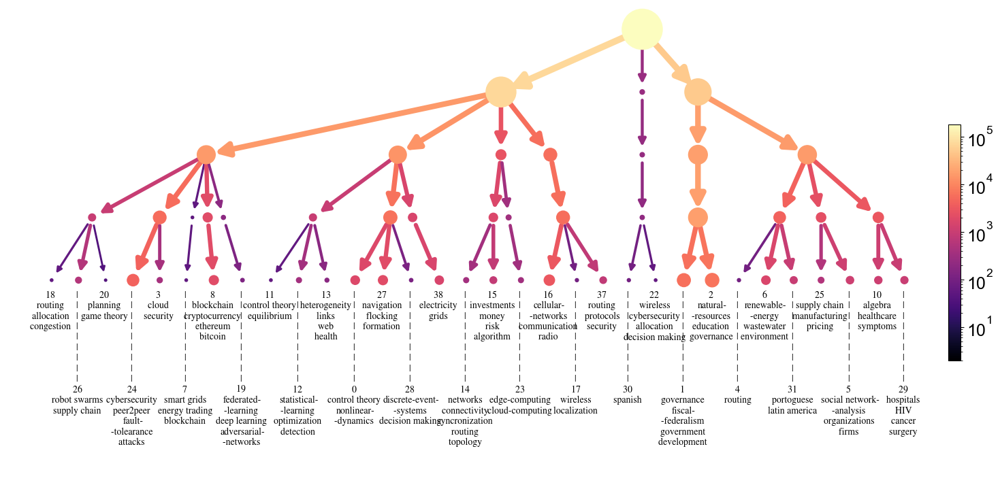

In [45]:
figsize=(21,9)
fig = plt.figure(figsize=figsize)
ax = plt.gca()
pos = create_hierarchy_network_docs(partition=0, top_level=6, bottom_level=2, 
                             max_num_clusters_to_represent=10000, num_words_to_represent=20, 
                             multiplicator_size_nodes=.01, multiplicator_size_edges=1, multiplicator_ypos=0.30,
                             fontsize = 10, ax=ax, fig=fig, threshold_num_papers = 500, num_spaces=50)

# Papers analysis

In [46]:
l = 3

In [47]:
def find_kf_important_paper(cluster_from,cluster_to,year_from,year_to):
    set_papers_study = set([x for i,x in enumerate(ordered_paper_ids) if h_t_doc_consensus_by_level[l][i] == cluster_from])
    papers_in_study_dict = {}
    
    for paper_id in set_papers_study:
        paper = all_docs_dict[paper_id]
        if paper['year'] != year_from:
            continue
        papers_in_study_dict[paper_id] = {}
        tmp_count = {field:0 for field in all_clusters}
        for citing_paper_id in set(paper["inCitations"]).intersection(all_papers_ids):
            citing_paper = all_docs_dict[citing_paper_id]
            if citing_paper['year'] != year_to:
                continue
            for chosen_edge_field in citing_paper["assigned_cluster_list"]:
                tmp_count[chosen_edge_field] += 1/len(paper["assigned_cluster_list"])/len(citing_paper["assigned_cluster_list"])
        for field in all_clusters:
            papers_in_study_dict[paper_id][field] = tmp_count[field]

    papers_in_study_df = pd.DataFrame(papers_in_study_dict).transpose()

    selected_paper = papers_in_study_df[int(cluster_to)].sort_values(ascending=False).index.values[0]
    kf = papers_in_study_df[int(cluster_to)].sort_values(ascending=False).values[0]

    return selected_paper, kf

In [48]:
all_docs_dict[paper_id].keys()

dict_keys(['id', 'title', 'paperAbstract', 'authors', 'inCitations', 'outCitations', 'year', 's2Url', 'sources', 'pdfUrls', 'venue', 'journalName', 'journalVolume', 'journalPages', 'doi', 'doiUrl', 'pmid', 'fieldsOfStudy', 'magId', 's2PdfUrl', 'entities', 'assigned_cluster_list'])

In [49]:
_id = []
_title = []
_fields = []
_clusters_lev2 = []
_clusters_lev3 = []
_clusters_lev4 = []
_clusters_lev5 = []
_year = []
_doi = []
_abstract = []

for i,paper_id in enumerate(ordered_paper_ids):
    paper = all_docs_dict[paper_id]
    
    _id.append(paper_id)
    _title.append(paper['title'])
    _fields.append(paper['fieldsOfStudy'])
    _clusters_lev2.append(h_t_doc_consensus_by_level[2][i])
    _clusters_lev3.append(h_t_doc_consensus_by_level[3][i])
    _clusters_lev4.append(h_t_doc_consensus_by_level[4][i])
    _clusters_lev5.append(h_t_doc_consensus_by_level[5][i])
    _year.append(paper['year'])
    _doi.append(paper['doiUrl'])
    _abstract.append(paper['paperAbstract'])


In [50]:
all_papers_df = pd.DataFrame({'title':_title,
                             'abstract': _abstract,
                             'fields': _fields,
                             'year':_year,
                             'doi':_doi,
                             'clusters_lev2':_clusters_lev2,
                             'clusters_lev3':_clusters_lev3,
                             'clusters_lev4':_clusters_lev4,
                             'clusters_lev5':_clusters_lev5,
                             'citations_overall':centralities['citations_overall'], 
                             'in_degree':centralities['out_degree'], 
                             'eigenvector':centralities['eigenvector'],
                             'betweenness':centralities['betweenness'],
                             'closeness':centralities['closeness'],
                             'pagerank':centralities['pagerank'],
                             'katz':centralities['katz'],
                             'id':_id,
                             })

In [51]:
all_papers_df['decade'] = (all_papers_df['year'].fillna(-10) / 10).astype(int)*10

In [52]:
all_papers_df.sort_values("year").head(20).iloc[2]['title']

'Local self-government and centralization : the characteristics of each; and its practical tendencies, as affecting social, moral, and political welfare and progress, including comprehensive outlines of the English constitution'

In [53]:
all_papers_df.loc[all_papers_df.clusters_lev3.isin([12])].sort_values("year").iloc[:50]#.sort_values("in_degree",ascending=False).iloc[0]['abstract']

,title,abstract,fields,year,doi,clusters_lev2,clusters_lev3,clusters_lev4,clusters_lev5,citations_overall,in_degree,eigenvector,betweenness,closeness,pagerank,katz,id,decade
96484,Ministère de l'Intérieur,"La délinquance, la violence et l’insécurité re...","[Political Science, Medicine]",1804.0,,1,12,2,2,39,0.0,0.000000e+00,0.0,NaN,0.000007,0.002283,30dc7ea605673ceb628e68b14d30cff2dacadab3,1800
142319,Local self-government and centralization : the...,,[Political Science],1851.0,,1,12,2,2,2,0.0,0.000000e+00,0.0,NaN,0.000002,0.002260,06dfd503b1ab4e67931b94e69a0ab1e7980c3274,1850
152089,Recent Centralizing Tendencies in the Supreme ...,,[Political Science],1890.0,https://doi.org/10.2307/2139256,1,12,2,2,4,0.0,0.000000e+00,0.0,NaN,0.000003,0.002262,1b617fe78edb87356d73e7c00d3c2fa0d19fe607,1890
99672,Recent centralizing tendencies in state educat...,,[Political Science],1897.0,,2,12,2,2,1,0.0,1.478798e-06,0.0,NaN,0.000003,0.002263,7b489cad64f8f89a162f6d81fd5e60e1ce651e0a,1890
69978,Democracy and the organization of political pa...,These effects of the dwindling of individualit...,[Political Science],1902.0,https://doi.org/10.2307/1832739,1,12,2,2,332,0.0,0.000000e+00,0.0,NaN,0.000012,0.002493,b4cfeff3a2b7aba4189cfbf492abb7a88b91d61d,1900
126325,The Centralization Of Administration In Ohio,,[Political Science],1903.0,,2,12,2,2,4,0.0,0.000000e+00,0.0,NaN,0.000002,0.002261,8895ae6fee6d2597303afc98995bba33e18bc27b,1900
127170,De Indische decentralisatiewetgeving,,[Political Science],1915.0,,1,12,2,2,3,0.0,8.765858e-137,0.0,NaN,0.000005,0.002308,317ab3fa13e15d9120d751269378edb04a412ae0,1910
159003,The Labor Market,This paper analyzes the case for fiscal federa...,[Political Science],1919.0,https://doi.org/10.4135/9781412939607.n392,2,12,2,2,207,0.0,0.000000e+00,0.0,NaN,0.000004,0.002260,005a08f5029111ac59c3203653f5f69099ad9528,1910
146482,Regionalism and Administrative Decentralizatio...,,[Political Science],1922.0,https://doi.org/10.2307/2547946,1,12,2,2,1,0.0,0.000000e+00,0.0,NaN,0.000004,0.002260,6ed1e68e2e06e77027abb2d3392d02c369e82f7a,1920
119262,The modern state,Nothing manifests the strengths and weaknesses...,"[Economics, Political Science]",1926.0,https://doi.org/10.2307/2222746,2,12,2,2,81,0.0,2.913030e-07,0.0,NaN,0.000064,0.002324,c05dc120365815cdbc00d69d26d4d8b1097fe743,1920


In [54]:
all_papers_df.groupby(["decade","clusters_lev3"],as_index=False).doi.count().replace(-10,np.nan).dropna().rename({"doi":"papers"},axis=1).head(20)

,decade,clusters_lev3,papers
16,1800.0,12,1
17,1800.0,14,1
18,1850.0,12,1
19,1860.0,13,1
20,1860.0,15,1
21,1870.0,15,1
22,1880.0,15,1
23,1890.0,12,2
24,1890.0,15,4
25,1900.0,12,2


In [55]:
knowledge_flow_normalized_per_field_in_time_by_level[l]

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf
1,1961,1968,0,0,0.000000,False
2,1961,1970,0,0,0.000000,False
3,1961,1978,0,0,0.000000,False
4,1961,1979,0,0,0.000000,False
5,1961,1980,0,0,0.000000,False
...,...,...,...,...,...,...
518335,2018,2020,20,20,957.603306,True
518336,2018,2021,20,20,902.883117,True
518338,2019,2020,20,20,616.650000,True
518339,2019,2021,20,20,411.100000,True


In [56]:
x = knowledge_flow_normalized_per_field_in_time_by_level[l]
x = x.loc[x.knowledge_flow>0]
x.loc[(x.cluster_from.isin([2,4]))&(x.cluster_to.isin([10,29]))&(x.year_from<1900)&(x.year_to<1900)&(x.knowledge_flow>0)]

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf


In [57]:
x.loc[(x.year_from<1950)&(x.year_to<1950)]

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf
57301,1922,1939,12,12,1.0,False
58012,1935,1942,12,12,1.5,True
228428,1889,1935,15,15,1.0,False
228966,1908,1919,15,15,2.0,True
228969,1908,1928,15,15,2.0,True
228971,1908,1935,15,15,2.0,True
229149,1923,1943,15,15,3.0,True
229321,1928,1947,15,15,2.0,True
229399,1931,1940,15,15,1.0,False
451739,1920,1925,14,14,1.0,False


In [58]:
xx = x.groupby(['year_from','cluster_from'],as_index=False).knowledge_flow.mean()
xx.loc[xx.year_from<1950]

,year_from,cluster_from,knowledge_flow
0,1800,14,1.0
1,1804,12,1.0
2,1851,12,1.0
3,1861,13,1.0
4,1868,15,1.0
...,...,...,...
56,1947,15,4.0
57,1948,12,2.0
58,1948,13,4.0
59,1948,15,4.0


In [59]:
all_papers_df.loc[all_papers_df.year < 1950].clusters_lev2.value_counts()

10    34
2     31
1     20
5      7
31     6
29     2
16     1
24     1
Name: clusters_lev2, dtype: int64

## 1950s

In [60]:
all_papers_df.loc[(all_papers_df.decade.isin([1950]))].clusters_lev3.value_counts()

12    58
15    22
14    12
8      4
13     4
7      3
10     3
3      1
5      1
Name: clusters_lev3, dtype: int64

In [61]:
keywords_clusters_onekeyword[3][12]

'governance\nnatural resources'

In [62]:
all_papers_df.loc[(all_papers_df.decade.isin([1950]))&~(all_papers_df.clusters_lev3.isin([12]))].sort_values("citations_overall",ascending=False).loc[5560]

title                centralization vs. decentralization in organiz...
abstract                                                              
fields                                  [Economics, Political Science]
year                                                            1954.0
doi                                                                   
clusters_lev2                                                        5
clusters_lev3                                                       14
clusters_lev4                                                        3
clusters_lev5                                                        2
citations_overall                                                  220
in_degree                                                          0.0
eigenvector                                                        0.0
betweenness                                                        0.0
closeness                                                          NaN
pagera

In [63]:
x.loc[(x.year_from<1960)&(x.year_to<1960)&(x.knowledge_flow>0)&(x.cluster_from!=x.cluster_to)]

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf


## 1960s

In [64]:
all_papers_df.loc[(all_papers_df.decade.isin([1960]))].clusters_lev3.value_counts()

15    151
12    149
14     50
8      29
13     16
10      8
1       5
6       4
5       3
7       3
0       2
4       2
19      1
Name: clusters_lev3, dtype: int64

In [65]:
keywords_clusters[3][8]

'networks\ninvestments\nconnectivity\nmoney\nsyncronization\nrisk\nrouting\nalgorithm\ntopology'

In [66]:
all_papers_df.loc[(all_papers_df.decade.isin([1960]))&(all_papers_df.clusters_lev3.isin([15]))].sort_values("in_degree",ascending=False).fields.explode().value_counts()

Medicine            85
Mathematics         55
Chemistry           32
Biology             22
Psychology           4
Physics              3
Business             2
Geology              1
Engineering          1
Computer Science     1
Name: fields, dtype: int64

In [67]:
t=x.loc[(x.year_from<1970)&(x.year_to<1970)&(x.knowledge_flow>0)&(x.cluster_from!=x.cluster_to)].copy()
z = t.apply(lambda x:find_kf_important_paper(x['cluster_from'],x['cluster_to'],x['year_from'],x['year_to']),axis=1)
t[['paper_id','kf']] = z.to_list()
t['title'] = t.paper_id.apply(lambda x:all_docs_dict[x]['title'])

In [68]:
t

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf,paper_id,kf,title
41992,1966,1968,6,14,24.500000,True,c1058d5807656a31599743f1e06c5a5d114d640a,0.0,Allocating Weapons to Target Complexes by Mean...
90321,1953,1964,12,10,2.000000,True,19eac23d652f9b8e2098238d9414001439701693,0.0,Cooperation and Centralization
105395,1960,1968,12,14,1.571429,True,460e79eafdc4d48ebdef0ebea42d8d7c470c3eac,0.0,Authority and Flexibility in the Spanish Imper...
105579,1963,1969,12,14,2.000000,True,1fd70f3597be9ee0452648f04a6eb8a6be082b26,0.0,From Anarchy to Satrapy
299277,1960,1963,8,6,22.000000,True,6c7a9b049927e6756fbaf425e323c1aad05591f8,0.0,Decomposition Principle for Linear Programs
299279,1960,1968,8,6,22.000000,True,6c7a9b049927e6756fbaf425e323c1aad05591f8,0.0,Decomposition Principle for Linear Programs
301343,1959,1967,8,12,19.000000,True,c138866124b3d8dcbd0c6b1c191426d6de76ef92,0.0,CENTRALIZATION AND DECENTRALIZATION IN ECONOMI...
324351,1960,1961,8,14,22.000000,True,6c7a9b049927e6756fbaf425e323c1aad05591f8,0.0,Decomposition Principle for Linear Programs
324540,1964,1968,8,14,7.500000,True,a54807c4dbfccbef2935f80bef49229eaadcdb9e,0.0,Plant Location Under Economies-of-Scale---Dece...
324541,1964,1969,8,14,15.000000,True,a54807c4dbfccbef2935f80bef49229eaadcdb9e,0.0,Plant Location Under Economies-of-Scale---Dece...


## 1970s

In [69]:
all_papers_df.loc[(all_papers_df.decade.isin([1970]))].clusters_lev2.value_counts()

10    508
2     395
1     206
5     140
15    125
0     118
11    110
31     46
24     45
6      32
29     29
27     21
14     18
16     17
4      11
25     10
13      7
21      6
38      5
22      5
28      4
23      4
8       3
3       3
39      2
30      2
19      2
26      2
12      2
20      1
18      1
34      1
17      1
40      1
Name: clusters_lev2, dtype: int64

In [70]:
keywords_clusters[2][15]

'investments\nmoney\nrisk\nalgorithm'

In [71]:
all_papers_df.loc[(all_papers_df.decade.isin([1970]))&~(all_papers_df.clusters_lev2.isin([156]))].sort_values("in_degree",ascending=False)

,title,abstract,fields,year,doi,clusters_lev2,clusters_lev3,clusters_lev4,clusters_lev5,citations_overall,in_degree,eigenvector,betweenness,closeness,pagerank,katz,id,decade
351,Survey of decentralized control methods for la...,This paper surveys the control theoretic liter...,[Engineering],1978.0,https://doi.org/10.1109/TAC.1978.1101704,0,6,1,0,1084,21.0,3.054954e-03,6.846632e-05,0.571429,0.002048,0.016039,bb5b06c46f63fd3db312d7d4d10e2649d07e3d65,1970
74972,The multilevel approach to organizational issu...,This paper critically reviews the progress and...,[Economics],1977.0,https://doi.org/10.1016/0305-0483%2877%2990004-4,15,8,4,0,70,20.0,1.876020e-04,9.558314e-06,0.590164,0.000035,0.002769,0ee6fdc5ab1781951e199881f319547c2fdc1ae7,1970
39853,Decentralisation in Administration : A Select ...,,[Business],1978.0,https://doi.org/10.1177/0019556119780345,1,12,2,2,0,19.0,0.000000e+00,0.000000e+00,0.913043,0.000002,0.002238,2f8bee20f0c7f0f329b6a6385da459e61c409e85,1970
76762,The Design of Distributed Computer Control Sys...,Abstract The complexity of decentralised contr...,[Computer Science],1979.0,https://doi.org/10.1016/S1474-6670%2817%2965397-7,11,5,1,0,11,17.0,3.371484e-138,2.122509e-09,0.426966,0.000002,0.002261,00d9bc37fef69c52cdf82ac781676bd7205162b8,1970
94363,On Decentralized Control of Large-Scale Systems,A scheme is presented for decentralized contro...,[Mathematics],1978.0,https://doi.org/10.1016/S1474-6670%2817%2966158-5,0,6,1,0,2,16.0,3.371484e-138,1.074972e-09,0.464286,0.000002,0.002261,91d09bb8bf804dca0eb0d51a9c42a4c790113670,1970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91420,Agrarian Socialism,In the introduction the authors explain the re...,[Sociology],1974.0,https://doi.org/10.1177/000944557401000310,2,12,2,2,30,0.0,0.000000e+00,0.000000e+00,NaN,0.000002,0.002260,d9cfa329abdbe0a45eceedaf1fb42b353d6c0c97,1970
91289,Privacy transformations for databank systems,The term databank implies a centralized collec...,[Computer Science],1973.0,https://doi.org/10.1145/1499586.1499732,24,1,0,0,13,0.0,0.000000e+00,0.000000e+00,NaN,0.000005,0.002261,4237fc0a36206db7a835b866135073bb9708b16b,1970
90988,Decentralization and Citizen Participation in ...,Criminal justice systems are one of the mechan...,[Political Science],1972.0,https://doi.org/10.2307/975235,2,12,2,2,10,0.0,1.306787e-134,0.000000e+00,NaN,0.000008,0.002287,ebe2bb9517f86dbc4e5525c827dd0556de855493,1970
90968,Retinal degeneration associated with the feedi...,: Retinal degeneration was observed in cats fe...,[Medicine],1978.0,,10,15,3,2,27,0.0,0.000000e+00,0.000000e+00,NaN,0.000004,0.002261,f51e83deec19d5f30a93902cf98a2d680f8cd8b1,1970


In [72]:
all_papers_df.loc[all_papers_df.title.str.contains("clarification")]

,title,abstract,fields,year,doi,clusters_lev2,clusters_lev3,clusters_lev4,clusters_lev5,citations_overall,in_degree,eigenvector,betweenness,closeness,pagerank,katz,id,decade
3086,Centrality in social networks conceptual clari...,Abstract The intuitive background for measures...,[Psychology],1978.0,https://doi.org/10.1016/0378-8733%2878%2990021-7,5,14,3,2,13287,2.0,2.794759e-04,9.355892e-07,1.000000,0.000886,0.014797,5d61ef638fd684facc1e68e654053e9bc065b36f,1970
49968,Tailored water treatment using enhanced primar...,An emerging strategy for urban water infrastru...,[Environmental Science],2017.0,https://doi.org/10.1039/C7EW00019G,6,13,3,2,2,6.0,0.000000e+00,0.000000e+00,0.402062,0.000002,0.002238,1cea8196541069cd591424b8bc9af1cf2556eaf8,2010
75487,Knowledge heterogeneity and social network ana...,This literature review highlights some Social ...,[Sociology],2008.0,https://doi.org/10.1057/kmrp.2008.9,5,14,3,2,16,4.0,0.000000e+00,0.000000e+00,0.555556,0.000002,0.002238,75f87edd4833d372b2e6791b5b70f0fd76769585,2000
148758,Taxonomic status of the Australian burrowing f...,I review genetic and call structure data avail...,[Biology],2010.0,https://doi.org/10.18195/issn.0312-3162.25%284...,10,15,3,2,6,4.0,0.000000e+00,0.000000e+00,0.833333,0.000002,0.002238,469b10cb329c3fa21482f017d85371508b280245,2010
159490,Electronic marketplace definition and classifi...,The definitions and classifications of any new...,"[Business, Computer Science]",2007.0,https://doi.org/10.1080/17517570601088380,8,3,0,0,79,0.0,1.507053e-135,0.000000e+00,NaN,0.000004,0.002266,090596364357b5e6727ca9b2f02972f6b6213dc3,2000
178130,Power relinquishment versus power sharing: The...,This article presents a theoretical and empiri...,[Psychology],1987.0,https://doi.org/10.1037/0021-9010.72.2.228,2,12,2,2,157,0.0,0.000000e+00,0.000000e+00,NaN,0.000005,0.002261,4c36e3e73a05ed4ecdecf103e40f8f0421d92302,1980


In [73]:
t = x.loc[(x.year_from<1980)&(x.knowledge_flow>2)&(x.cluster_from!=x.cluster_to)&(x.cluster_from==5)].copy() #&(x.year_to<1980) (x.year_from>=1970)&(x.year_to>=1970)
z = t.apply(lambda x:find_kf_important_paper(x['cluster_from'],x['cluster_to'],x['year_from'],x['year_to']),axis=1)
t[['paper_id','kf']] = z.to_list()
t['title'] = t.paper_id.apply(lambda x:all_docs_dict[x]['title'])

In [74]:
t

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf,paper_id,kf,title
269851,1974,1980,5,0,22.000000,True,fd8707c12f1f2cb6e3d6059736ab6dab7b69621c,2.0,Information structure in dynamic multi-person ...
269873,1974,2002,5,0,22.000000,True,0eeff1fa8d8a51c641f662c2684b187b9321e251,0.0,Remotely Multiplexed Data Acquisition for Medi...
270031,1978,1980,5,0,5.543478,True,0d5e382331a4eb2f7a81b9845dfd7aa5bac26cb5,0.0,Separation of Estimation and Control for Decen...
270046,1978,1995,5,0,5.543478,True,0d5e382331a4eb2f7a81b9845dfd7aa5bac26cb5,0.0,Separation of Estimation and Control for Decen...
270047,1978,1996,5,0,11.086957,True,0d5e382331a4eb2f7a81b9845dfd7aa5bac26cb5,0.0,Separation of Estimation and Control for Decen...
...,...,...,...,...,...,...,...,...,...
289257,1975,1989,5,11,11.625000,True,ad5d7fbc995a0ee9629869ace7932ee04c1ebd0d,0.0,Decentralized Regulation of Dynamic Systems
290797,1975,1979,5,14,5.812500,True,ad5d7fbc995a0ee9629869ace7932ee04c1ebd0d,0.0,Decentralized Regulation of Dynamic Systems
290919,1977,2008,5,14,2.162896,True,214fb1173e0936e7e437ce0387135da7fe70d6f1,0.0,Optimal economic stabilization policies under ...
293731,1972,1982,5,7,24.800000,True,37f2c53fec10251592bffa9b5090d1d6935411cd,0.0,Some Iterative Schemes for Decentralized Dynam...


In [75]:
keywords_clusters[2][11]

'control theory\nequilibrium'

In [76]:
keywords_clusters[2][0]

'control theory\nnonlinear dynamics'

In [77]:
len(all_papers_df.loc[all_papers_df.clusters_lev2 == 11])

926

## kf important papers

In [78]:
t = x.iloc[:10].copy()
z = t.apply(lambda x:find_kf_important_paper(x['cluster_from'],x['cluster_to'],x['year_from'],x['year_to']),axis=1)


In [79]:
t[['paper_id','kf']] = z.to_list()

In [80]:
t

,year_from,year_to,cluster_from,cluster_to,knowledge_flow,significant_kf,paper_id,kf
32,1961,2007,0,0,23.00,True,3d3686ca58aa006e0ede76a2851509f6efe7a83e,0.0
79,1968,2007,0,0,67.00,True,7c95a7b6ee0becb2b2bb9cc3e1c0b0a88f396185,0.0
113,1970,1995,0,0,63.50,True,1c21d3fccb002694fb6af41596f821047bb006c6,0.0
125,1970,2007,0,0,63.50,True,1c21d3fccb002694fb6af41596f821047bb006c6,0.0
126,1970,2008,0,0,63.50,True,1c21d3fccb002694fb6af41596f821047bb006c6,0.0
127,1970,2009,0,0,63.50,True,1c21d3fccb002694fb6af41596f821047bb006c6,0.0
165,1978,2002,0,0,85.00,True,71b4d8e87a03b663d5066d7299b8c74c23c5185a,0.0
182,1978,2019,0,0,127.50,True,71b4d8e87a03b663d5066d7299b8c74c23c5185a,0.0
187,1979,1980,0,0,299.00,True,50dbb04408df32676a04cc3c3db7182983e1acf9,0.0
235,1980,1985,0,0,74.25,True,3307c8b7054809de9f62e3d02f38b84285727ae2,0.0


In [81]:
l = 2
threshold = 3
num_papers_to_show = 1

_year_from = []
_year_to = []
_cluster_from = []
_cluster_to = []
_paper_id = []
_kf = []

for cluster_from in tqdm(np.unique(h_t_doc_consensus_by_level[l])):
    set_papers_study = set([x for i,x in enumerate(ordered_paper_ids) if h_t_doc_consensus_by_level[l][i] == cluster_from])
    set_years_from_study = set([all_docs_dict[x]['year'] for i,x in enumerate(ordered_paper_ids) if h_t_doc_consensus_by_level[l][i] == cluster_from and all_docs_dict[x]['year'] is not None])
    set_years_to_study = set([all_docs_dict[p]['year'] for i,x in enumerate(ordered_paper_ids) for p in all_docs_dict[x]['inCitations']  if p in all_papers_ids and h_t_doc_consensus_by_level[l][i] == cluster_from and all_docs_dict[p]['year'] is not None])
    
    for year_from in set_years_from_study:
        for year_to in set_years_to_study:
            if year_from > year_to:
                continue
                
            tmp = knowledge_flow_normalized_per_field_in_time_by_level[2]
            tmp = tmp.loc[tmp.cluster_from == cluster_from]
            tmp = tmp.loc[tmp.knowledge_flow>0]
            tmp = tmp.loc[(tmp.year_from == year_from)&(tmp.year_to == year_to)]
            
            if len(tmp) == 0:
                continue
            
            papers_in_study_dict = {}
            for paper_id in set_papers_study:
                paper = all_docs_dict[paper_id]
                if paper['year'] != year_from:
                    continue
                papers_in_study_dict[paper_id] = {}
                tmp_count = {field:0 for field in all_clusters}
                for citing_paper_id in set(paper["inCitations"]).intersection(all_papers_ids):
                    citing_paper = all_docs_dict[citing_paper_id]
                    if citing_paper['year'] != year_to:
                        continue
                    for chosen_edge_field in citing_paper["assigned_cluster_list"]:
                        tmp_count[chosen_edge_field] += 1/len(paper["assigned_cluster_list"])/len(citing_paper["assigned_cluster_list"])
                for field in all_clusters:
                    papers_in_study_dict[paper_id][field] = tmp_count[field]

            papers_in_study_df = pd.DataFrame(papers_in_study_dict).transpose()

            for cluster_to,z_score in zip(tmp.cluster_to,tmp.knowledge_flow):
                if z_score > threshold:

                    selected_paper = papers_in_study_df[cluster_to].sort_values(ascending=False).iloc[:num_papers_to_show].index.values[0]
                    kf = papers_in_study_df[cluster_to].sort_values(ascending=False).iloc[:num_papers_to_show].values[0]
                    _year_from.append(year_from)
                    _year_to.append(year_to)
                    _cluster_from.append(cluster_from)
                    _cluster_to.append(cluster_to)
                    _paper_id.append(selected_paper)
                    _kf.append(kf)


  0%|          | 0/41 [00:00<?, ?it/s]

## blockchain

To look at the papers of blockchain and his children clusters at level 1, look at cluster_labelling.ipynb, section Print level 1 clusters of Blockchain

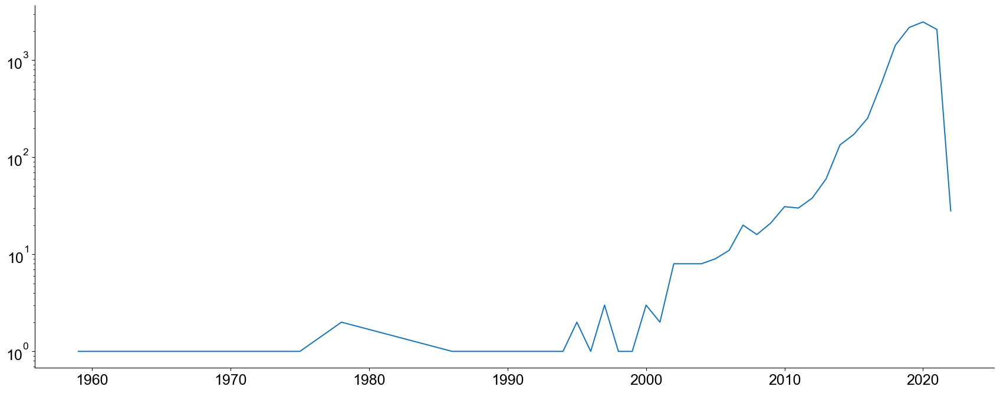

In [82]:
all_papers_df.loc[(all_papers_df.clusters_lev2 == 8)].year.value_counts().sort_index().plot()
plt.yscale("log")

In [83]:
keywords_clusters[2][15]

'investments\nmoney\nrisk\nalgorithm'

In [84]:
all_papers_df.loc[(all_papers_df.clusters_lev2.isin([8]))].sort_values("year",ascending=True)#.iloc[1]

,title,abstract,fields,year,doi,clusters_lev2,clusters_lev3,clusters_lev4,clusters_lev5,citations_overall,in_degree,eigenvector,betweenness,closeness,pagerank,katz,id,decade
163011,Centralization vs. Decentralization: The Case ...,,[Political Science],1959.0,https://doi.org/10.2307/3004132,8,3,0,0,2,0.0,0.000000e+00,0.000000e+00,NaN,0.000002,0.002260,917df5c216c83915b50b8689db7685775d95b537,1950
10927,The Meaning of Decentralization,,[Sociology],1975.0,https://doi.org/10.1080/00220973.1943.11019391,8,3,0,0,57,0.0,2.858444e-55,0.000000e+00,NaN,0.000019,0.003132,63a9681663778913982f8f028e170be5ff36f532,1970
101149,The banking and credit system of the USSR,1. Definition of the problem and introductory ...,"[Economics, Business]",1978.0,https://doi.org/10.1007/978-1-4613-4048-5_3,8,3,0,0,8,0.0,0.000000e+00,0.000000e+00,NaN,0.000002,0.002260,ae0dcca73613667feb95f254b49b6ebc0c982caf,1970
41434,Distributed Database Technology - A Survey,Abstract For a number of reasons there has rec...,[Computer Science],1978.0,https://doi.org/10.1016/0376-5075%2878%2990025-9,8,3,0,0,7,1.0,0.000000e+00,4.608877e-09,1.000000,0.000002,0.002292,4dfa898afd1990e22c92806fb3753d091434225f,1970
102625,Distributing the power of a government to enha...,"In this paper, we distribute the functions of ...",[Computer Science],1986.0,https://doi.org/10.1145/10590.10595,8,3,0,0,245,0.0,0.000000e+00,0.000000e+00,NaN,0.000007,0.002398,112e1ebffc054a752209d518c0dfc2834aff8019,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147664,Cryptosecession and the limits of taxation : T...,This paper presents a model of partial interna...,[],NaN,,8,3,0,0,5,0.0,6.804636e-56,0.000000e+00,NaN,0.000003,0.002310,f15ab5c3c7b996368ba1f6c52b61f54df07b890f,-10
159207,Poster: An Offline Delegatable Cryptocurrency ...,"In this poster, we propose an offline delegata...",[],NaN,,8,3,0,0,1,1.0,0.000000e+00,0.000000e+00,0.108072,0.000002,0.002260,5ad3e70800dce46d39dbaf9034c5cb861861d012,-10
160207,Integrated platforms for blockchain enablement,The Internet of Things (IoT) is experiencing a...,[],NaN,,8,3,0,0,6,3.0,0.000000e+00,0.000000e+00,0.091380,0.000002,0.002238,21dafca148edbf6899e3032df9a07b337db26079,-10
175639,A proof-of-stake based decentralized custodian...,,[],NaN,,8,3,0,0,0,1.0,0.000000e+00,0.000000e+00,0.098918,0.000002,0.002238,848dfd60c1a4cf16a073eb157697c3acb63b4356,-10


In [85]:
def find_citations_paper(paper_id):
    
    return all_papers_df.loc[all_papers_df.id.isin(all_docs_dict[paper_id]['inCitations'])].clusters_lev2.value_counts()

In [86]:
find_citations_paper("63a9681663778913982f8f028e170be5ff36f532")

8    39
Name: clusters_lev2, dtype: int64

In [87]:
all_papers_df.loc[all_papers_df.id.isin(all_docs_dict["63a9681663778913982f8f028e170be5ff36f532"]['inCitations'])].iloc[0]#title#.iloc[15]#.abstract#title

title                Measuring Decentrality in Blockchain Based Sys...
abstract             Blockchain promises to provide a distributed a...
fields                                              [Computer Science]
year                                                            2020.0
doi                        https://doi.org/10.1109/ACCESS.2020.3026577
clusters_lev2                                                        8
clusters_lev3                                                        3
clusters_lev4                                                        0
clusters_lev5                                                        0
citations_overall                                                    3
in_degree                                                         34.0
eigenvector                                                        0.0
betweenness                                                   0.000001
closeness                                                      0.13361
pagera

### DAOs and DeFi

In [88]:
print('defi:',len(all_papers_df.loc[(all_papers_df.abstract.str.contains(" defi ",case=False))&(all_papers_df.clusters_lev2==8)]))

defi: 60


In [89]:
print('dao:',len(all_papers_df.loc[(all_papers_df.abstract.str.contains(" dao ",case=False))&(all_papers_df.clusters_lev2==8)]))

dao: 55


# Figure 1

Follow all the steps here, then the final figure in the article is created with inkscape

Do hierarchy plot to paste into main figure, and to get pos for main histograms

In [90]:
threshold_num_papers = 500

In [91]:
N = 256
vals = np.ones((N, 3))
val = 100/256
vals[:, 0] = np.linspace(val, val, N)
vals[:, 1] = np.linspace(val, val, N)
vals[:, 2] = np.linspace(val, val, N)
newcmp = ListedColormap(vals)

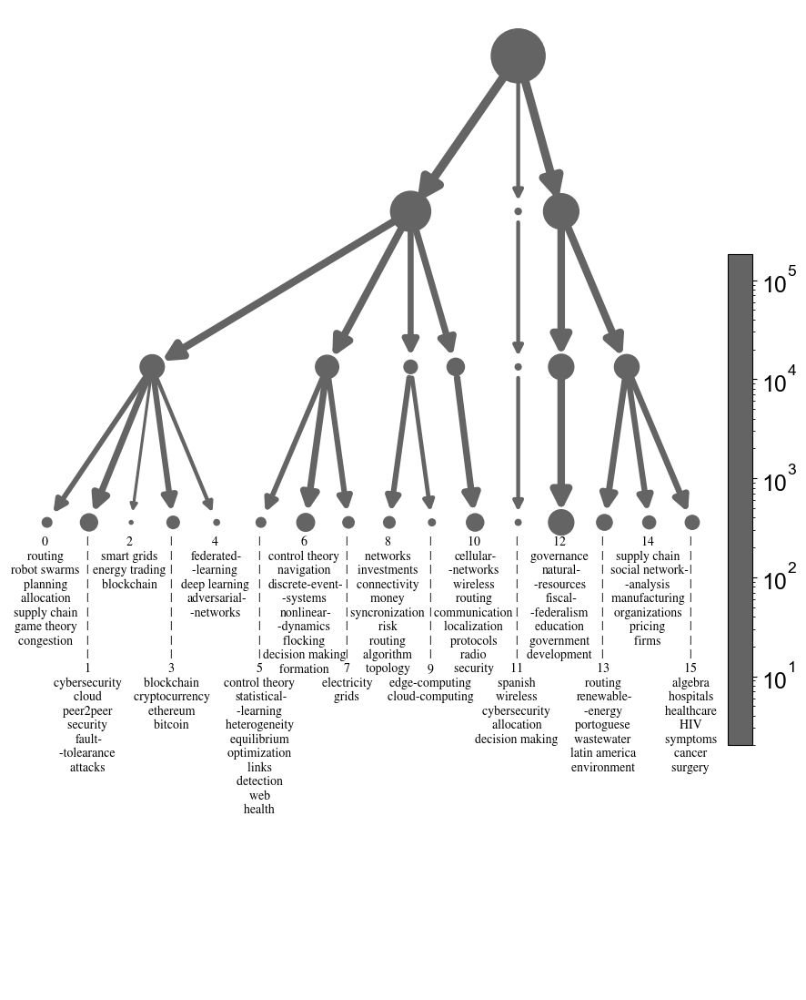

In [92]:
figsize=(12,14)
fig = plt.figure(figsize=figsize)
ax = plt.gca()
pos = create_hierarchy_network_docs(partition=0, top_level=6, bottom_level=3, 
                             max_num_clusters_to_represent=10000, num_words_to_represent=20, 
                             multiplicator_size_nodes=.01, multiplicator_size_edges=1, multiplicator_ypos=0.30,
                             fontsize = 10, ax=ax, fig=fig, threshold_num_papers = threshold_num_papers, num_spaces=50,cmap = newcmp)# matplotlib.cm.get_cmap('black'))
plt.savefig(paper_figures_folder + "Figure1_hierarchy.pdf")

Get data for (a) and (b)

In [93]:
with gzip.open(all_dataset_path+"no_papers_in_fields_by_year.pkl.gz","rb") as fp:
    papers_per_year_per_field = pickle.load(fp)
    
with gzip.open(all_dataset_path+"no_authors_in_fields_by_year.pkl.gz","rb") as fp:
    authors_per_year_per_field = pickle.load(fp)
    
    
try:
    with gzip.open(all_dataset_path+"no_authors_by_year.pkl.gz","rb") as fp:
        no_authors_per_year = pickle.load(fp)
except Exception as e:
    print(e)
    with gzip.open(all_dataset_path+"sets_authors_in_fields_by_year.pkl.gz","rb") as fp:
        set_authors_per_year_per_field = pickle.load(fp)
     
    no_authors_per_year = {}
    for year in set_authors_per_year_per_field.keys():
        no_authors_per_year[year] = len(set().union(*list(set_authors_per_year_per_field[year].values())))
                                        
    with gzip.open(all_dataset_path+"no_authors_by_year.pkl.gz","wb") as fp:
        pickle.dump(no_authors_per_year,fp)  

In [94]:
years = sorted([x for x in papers_per_year_per_field.keys() if x is not None and x > 1500])

set_authors_per_year_decentralization = {y:set() for y in years}
for paper in all_docs_dict.values():
    if paper['year'] is not None:
        set_authors_per_year_decentralization[paper['year']].update([aut['ids'][0] for aut in paper['authors'] if paper['authors'] is not None and len(paper['authors'])>0 and len(aut['ids'])>0])
        
no_authors_per_year_decentralization = {y:len(set_authors_per_year_decentralization[y]) for y in years}

Get data for (c)

In [95]:
year_cluster_field_no_papers_df_by_level = {}
for level in tqdm(name2partition_by_level.keys()):
    dict_nested = {}
    for paper_id,cluster in name2partition_by_level[level].items():
        paper = all_docs_dict[paper_id]
        year = paper["year"]
        if year is not None:
            for field in paper["fieldsOfStudy"]:
                dict_nested.setdefault(field,{}).setdefault(cluster,{y:0 for y in range(1950,2022)})
                dict_nested[field][cluster].setdefault(year,0) 
                dict_nested[field][cluster][year] += 1./len(paper["fieldsOfStudy"])

    dict_for_df = {"year":[], "cluster":[], "field":[], "no_papers":[]}
    for field,_ in dict_nested.items():
        for cluster,_2 in _.items():
            for year,no_papers in _2.items():
                dict_for_df["year"].append(int(year))
                dict_for_df["cluster"].append(cluster)
                dict_for_df["field"].append(field)
                dict_for_df["no_papers"].append(no_papers)
    year_cluster_field_no_papers_df_by_level[level] = pd.DataFrame(dict_for_df)    

  0%|          | 0/8 [00:00<?, ?it/s]

Do main figure

In [96]:
def exponentialRegrPoints(xs, ys):
    '''
        Calculates a power law regression of the points xs and ys, which must be of the same size
        This is calculated as a linregress on the loglog scale of the points.
        
        y = a*exp(b*x)
        ==> log(y) = log(a) + b*x
        ==> slope = b, intercept = log(a)
        ==> a = exp(intercept), b = slope
        ==> plot(x, np.e**intercept * np.e**(slope*x))
        
        Returns slope, intercept, std_err of the linlog linregress
    '''
    if len(xs) <= 2:
        return 0,0,0
    else:
        ys = np.log(ys)
        slope, intercept, r_value, p_value, std_err = linregress(xs, ys)
        return slope, intercept, std_err

/data/home/ahw701/env_enrico/envs/gt/lib/python3.9/site-packages/pandas/core/indexes/base.py:3706: RuntimeWarning: '<' not supported between instances of 'NoneType' and 'int', sort order is undefined for incomparable objects
  join_index = self.union(other)
/tmp/2544852.1.all.q/ipykernel_145253/199649935.py:308: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


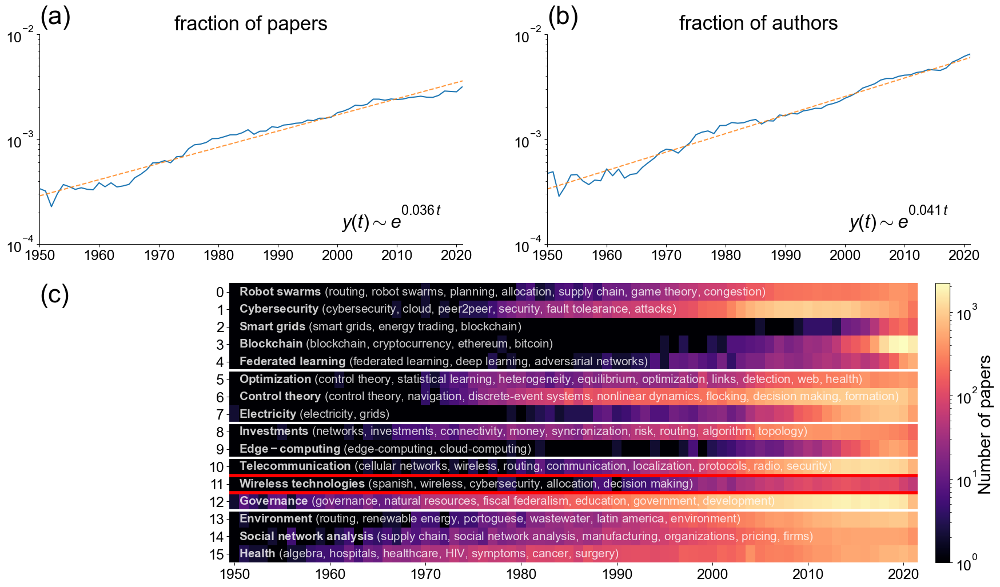

In [97]:
l = 3
first_year = 1950
year_cluster_log = year_cluster_field_no_papers_df_by_level[l].groupby(["year","cluster"],as_index=False).no_papers.sum()
year_cluster_log["no_papers_log"] = np.log([max(1,_) for _ in year_cluster_log["no_papers"]])

fig = plt.figure(figsize = (21,12))

outer = gridspec.GridSpec(nrows=2, ncols=1,height_ratios=[1.5,2],hspace=0.16)
inner = gridspec.GridSpecFromSubplotSpec(1, 2,
                        subplot_spec=outer[0],width_ratios=[1,1],wspace=0.2)
ax = plt.Subplot(fig, inner[0])
xlims = (first_year,2021)
fs = 32
y_small = .98
x_small = -0.15

upper_limit = 10*10**(-3)


dec_papers = pd.Series([x['year'] if 'year' in x else None for x in all_docs_dict.values()]).explode().value_counts().sort_index()

all_papers = pd.Series(index=years,data=[sum(list(papers_per_year_per_field[x].values())) for x in years])

frac_papers = dec_papers.align(all_papers,fill_value=0)[0]/dec_papers.align(all_papers,fill_value=0)[1]

frac_papers = frac_papers.loc[frac_papers.index>=first_year]
x = np.array(frac_papers.index,dtype=float)
y = np.array(frac_papers.values,dtype=float)
ax.plot(x,y)
slope,intercept,err = exponentialRegrPoints(x-first_year,y)
ax.text(0.95,0.05,'$y(t) \sim e^{%.3f\,t}$'%(slope), horizontalalignment = 'right', verticalalignment = 'bottom', transform=ax.transAxes, fontsize=24)
ax.plot(x, np.e**intercept * np.e**(slope*(x-first_year)),ls='--',alpha=0.8)

ax.set_xlim(xlims)
ax.set_xticks(range(first_year,2022,10))
ax.set_yscale("log")
ax.set_ylim((10**(-4),upper_limit))
ax.set_title("fraction of papers")

ax.text(.00, 1.05, "(%s)"%'abc'[0], fontsize=32, transform=ax.transAxes)
fig.add_subplot(ax)
mytrans = ax.transAxes + ax.figure.transFigure.inverted()
infig_xposition_num_caption = mytrans.transform((0,1.05))[0]


ax = plt.Subplot(fig, inner[1])
dec_authors = pd.Series(no_authors_per_year_decentralization).sort_index()
all_authors = pd.Series(no_authors_per_year).sort_index()


frac_authors = dec_authors.align(all_authors,fill_value=0)[0]/dec_authors.align(all_authors,fill_value=0)[1]
frac_authors = frac_authors.loc[frac_authors.index>=first_year]
x = np.array(frac_authors.index,dtype=float)
y = np.array(frac_authors.values,dtype=float)
ax.plot(x,y)
slope,intercept,err = exponentialRegrPoints(x-first_year,y)
ax.text(0.95,0.05,'$y(t) \sim e^{%.3f\,t}$'%(slope), horizontalalignment = 'right', verticalalignment = 'bottom', transform=ax.transAxes, fontsize=24)
ax.plot(x, np.e**intercept * np.e**(slope*(x-first_year)),ls='--',alpha=0.8)

ax.set_xlim(xlims)
ax.set_yscale("log")
ax.set_ylim((10**(-4),upper_limit))
ax.set_xticks(range(1950,2022,10))
ax.set_title("fraction of authors")

ax.text(.00, 1.05, "(%s)"%'abc'[1], fontsize=32, transform=ax.transAxes)

fig.add_subplot(ax)

#########################################################################################################################################

inner = gridspec.GridSpecFromSubplotSpec(1, 3,
                        subplot_spec=outer[1],width_ratios=[5,20,1],wspace=0.06)

level3_pos = [(x,y) for x,y in pos.items() if x.split("_")[0]=="3"]
ordered_lev3_clusters_pos = sorted(level3_pos,key = lambda x:x[1][0])
ordered_lev3_clusters = [int(x[0].split("_")[1].split("\n")[0]) for x in ordered_lev3_clusters_pos]

ordered_hierarchy_lev_4 = []
for c in ordered_lev3_clusters:
    for c3 in hierarchy_docs[4].keys():
        if c in hierarchy_docs[4][c3] and c3 not in [x[0] for x in ordered_hierarchy_lev_4]:
            ordered_hierarchy_lev_4.append((c3,hierarchy_docs[4][c3].intersection(set(ordered_lev3_clusters))))

ax = plt.Subplot(fig, inner[1])

data = year_cluster_log.copy()

fig, ax = heatmap(df=data, fixed_labels=[], x_label="year", y_label="cluster", values_label="no_papers_log", 
             costrains_equal={"year":set(range(1950,2022))},
             ordered_cluster_labels=ordered_lev3_clusters, ordered_cluster_groups=ordered_hierarchy_lev_4,linewidth=1,
             cut_small_clusters=True,threshold_num_papers=threshold_num_papers,
             bottom_level = l, top_level = 6, use_only_first_keyword=False, use_keywords_as_ticks=False,
             ax=ax,fig=fig,do_barplot=False,linelength = 150)
fig.add_subplot(ax)
ax.set_xticks([x+0.5 for x in range(0,2022-1950,10)])
ax.set_xticklabels(range(1950,2022,10),rotation = 0)


ax_cmap = plt.Subplot(fig, inner[2])
vmin = np.e**year_cluster_log.no_papers_log.unique().min()
vmax = year_cluster_log.no_papers.unique().max()
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.LogNorm(vmin=vmin, vmax=vmax), cmap=plt.get_cmap("magma")), ax=ax_cmap,shrink=1,pad=0., fraction=1,orientation="vertical")
ax_cmap.tick_params(labelsize=20) 
ax_cmap.axis('off')
fig.add_subplot(ax_cmap)
fig.text(0.907,0.312, "Number of papers", fontsize=22,verticalalignment="center", horizontalalignment="left", rotation=90)
fig.text(infig_xposition_num_caption, 0.49, "(c)", fontsize=32, transform=fig.transFigure)


fig.savefig(f"{paper_figures_folder}Figure1_without_hierarchy.pdf",bbox_inches='tight')
fig.savefig(f"{paper_figures_folder}Figure1_without_hierarchy.png",bbox_inches='tight')

plt.show()

In [98]:
denom_frac_authors_50s = np.round(1/np.mean([frac_authors[year] for year in range(1950,1960)]))
denom_frac_authors_2021 = np.round(1/frac_authors[2021])
print('from 1 author every %d on average in the 50s to 1 every %d in 2021'%(denom_frac_authors_50s, denom_frac_authors_2021))

from 1 author every 2444 on average in the 50s to 1 every 154 in 2021


In [99]:
denom_frac_papers_50s = np.round(1/np.mean([frac_papers[year] for year in range(1950,1960)]))
denom_frac_papers_2021 = np.round(1/frac_papers[2021])
print('from 1 paper every %d on average in the 50s to 1 every %d in 2021'%(denom_frac_papers_50s, denom_frac_papers_2021))

from 1 paper every 3078 on average in the 50s to 1 every 315 in 2021


In [100]:
frac_authors_50s = np.mean([frac_authors[year] for year in range(1950,1960)])
frac_authors_2021 = frac_authors[2021]
print('from %.3f%% on average in the 50s to %.3f%% in 2021'%(frac_authors_50s*100, frac_authors_2021*100))

from 0.041% on average in the 50s to 0.651% in 2021


In [101]:
frac_papers_50s = np.mean([frac_papers[year] for year in range(1950,1960)])
frac_papers_2021 = frac_papers[2021]
print('from %.3f%% on average in the 50s to %.3f%% in 2021'%(frac_papers_50s*100, frac_papers_2021*100))

from 0.032% on average in the 50s to 0.318% in 2021


In [102]:
unique, counts = np.unique(h_t_doc_consensus_by_level[3], return_counts=True)

In [103]:
unique2, counts2 = np.unique(h_t_doc_consensus_by_level[2], return_counts=True)

In [104]:
unique_list = []
count_list = []
subcount_list = []
one_keyword_list = []
multiple_keyword = []
for i,cluster in enumerate(unique):
    if counts[i] >= threshold_num_papers:
        children = hierarchy_docs[3][cluster]
        for child in children:
            if counts2[list(unique2).index(child)] >= threshold_num_papers:
                multiple_keyword.append(', '.join(keywords_clusters[2][child].split('\n')[:10]))
                one_keyword_list.append(one_keyword_lev_3[cluster])
                unique_list.append(cluster)
                count_list.append(counts[i])
                subcount_list.append(counts2[list(unique2).index(child)])
table_num_papers_clusters = pd.DataFrame(index=unique_list,data={'keyword':one_keyword_list, 'count':count_list, 'sub-keywords':multiple_keyword, 'sub-count':subcount_list})
table_num_papers_clusters

,keyword,count,sub-keywords,sub-count
0,Robot swarms,5843,"routing, allocation, congestion",909
0,Robot swarms,5843,"robot swarms, supply chain",4120
0,Robot swarms,5843,"planning, game theory",693
1,Cybersecurity,18437,"cybersecurity, peer2peer, fault tolearance, at...",15189
1,Cybersecurity,18437,"cloud, security",3248
2,Smart grids,867,"smart grids, energy trading, blockchain",867
3,Blockchain,9637,"blockchain, cryptocurrency, ethereum, bitcoin",9634
4,Federated learning,2043,"federated learning, deep learning, adversarial...",1565
5,Optimization,5878,"control theory, equilibrium",926
5,Optimization,5878,"statistical learning, optimization, detection",3065


In [105]:
pd.set_option('display.max_colwidth',100)
print(table_num_papers_clusters.to_latex())

\begin{tabular}{llrlr}
\toprule
{} &                  keyword &  count &                                               sub-keywords &  sub-count \\
\midrule
0  &             Robot swarms &   5843 &                            routing, allocation, congestion &        909 \\
0  &             Robot swarms &   5843 &                                 robot swarms, supply chain &       4120 \\
0  &             Robot swarms &   5843 &                                      planning, game theory &        693 \\
1  &            Cybersecurity &  18437 &        cybersecurity, peer2peer, fault tolearance, attacks &      15189 \\
1  &            Cybersecurity &  18437 &                                            cloud, security &       3248 \\
2  &              Smart grids &    867 &                    smart grids, energy trading, blockchain &        867 \\
3  &               Blockchain &   9637 &              blockchain, cryptocurrency, ethereum, bitcoin &       9634 \\
4  &       Federated learning &

In [106]:
dec_papers

1799.0        1
1800.0        1
1804.0        1
1832.0        1
1834.0        1
          ...  
2018.0    23841
2019.0    24999
2020.0    24303
2021.0    21291
2022.0      248
Length: 175, dtype: int64

In [107]:
len(h_t_doc_consensus_by_level[3]), dec_papers.sum()

(181605, 423431)

In [108]:
frac_filtered_papers = len(h_t_doc_consensus_by_level[3])/dec_papers.sum()
print('Filtered papers percentage is %.3f%%'%(frac_filtered_papers*100))

Filtered papers percentage is 42.889%


actual number before any filtering was 425144 (in dec_papers there are only papers with the year)

In [109]:
frac_filtered_papers = len(h_t_doc_consensus_by_level[3])/425144
print('Actual filtered papers percentage is %.3f%%'%(frac_filtered_papers*100))

Actual filtered papers percentage is 42.716%


## Figure SI number of papers and authors

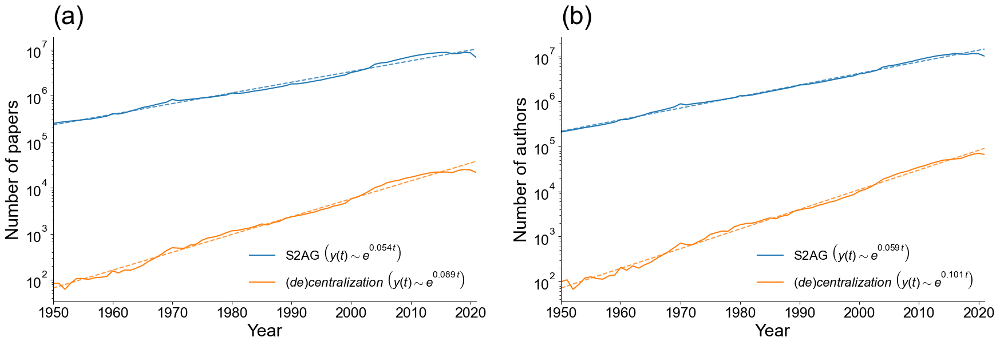

In [110]:
l = 3
first_year = 1950
last_year = 2021
year_cluster_log = year_cluster_field_no_papers_df_by_level[l].groupby(["year","cluster"],as_index=False).no_papers.sum()
year_cluster_log["no_papers_log"] = np.log([max(1,_) for _ in year_cluster_log["no_papers"]])

fig = plt.figure(figsize = (21,6))

outer = gridspec.GridSpec(nrows=1, ncols=2,width_ratios=[1,1],wspace=0.2)
ax = plt.Subplot(fig, outer[0])
xlims = (first_year,2021)
fs = 32
y_small = .98
x_small = -0.15

dec_papers = pd.Series([x['year'] if 'year' in x else None for x in all_docs_dict.values() if x['year'] is not None and x['year'] >= first_year and x['year'] <= last_year]).explode().value_counts().sort_index()

all_papers = pd.Series(index=[x for x in years if x >= first_year and x <= last_year],data=[sum(list(papers_per_year_per_field[x].values())) for x in years if x >= first_year and x <= last_year])

x = np.array(all_papers.index,dtype=float)
y = np.array(all_papers.values,dtype=float)
slope,intercept,err = exponentialRegrPoints(x-first_year,y)
ax.plot(x,y,label='S2AG' + r' $\left(y(t) \sim e^{%.3f\,t}\right)$'%(slope))
ax.plot(x, np.e**intercept * np.e**(slope*(x-first_year)),ls='--',alpha=0.8, color = ax.lines[-1].get_color())
x = np.array(dec_papers.index,dtype=float)
y = np.array(dec_papers.values,dtype=float)
slope,intercept,err = exponentialRegrPoints(x-first_year,y)
ax.plot(x,y,label=r'$\it{(de)centralization}$' + r' $\left(y(t) \sim e^{%.3f\,t}\right)$'%(slope))
ax.plot(x, np.e**intercept * np.e**(slope*(x-first_year)),ls='--',alpha=0.8, color = ax.lines[-1].get_color())

ax.set_xlim(xlims)
ax.set_xticks(range(first_year,2022,10))
ax.set_yscale("log")
ax.set_xlabel("Year")
ax.set_ylabel("Number of papers")

ax.legend()

ax.text(.00, 1.05, "(%s)"%'abc'[0], fontsize=32, transform=ax.transAxes)
fig.add_subplot(ax)


ax = plt.Subplot(fig, outer[1])
tmp_no_authors_per_year_decentralization = {x:y for x,y in no_authors_per_year_decentralization.items() if x is not None and x >= first_year and x <= last_year}
tmp_no_authors_per_year = {x:y for x,y in no_authors_per_year.items() if x is not None and x >= first_year and x <= last_year}
dec_authors = pd.Series(tmp_no_authors_per_year_decentralization).sort_index()
all_authors = pd.Series(tmp_no_authors_per_year).sort_index()
x = np.array(all_authors.index,dtype=float)
y = np.array(all_authors.values,dtype=float)
slope,intercept,err = exponentialRegrPoints(x-first_year,y)
ax.plot(x,y,label='S2AG' + r' $\left(y(t) \sim e^{%.3f\,t}\right)$'%(slope))
ax.plot(x, np.e**intercept * np.e**(slope*(x-first_year)),ls='--',alpha=0.8, color = ax.lines[-1].get_color())
x = np.array(dec_authors.index,dtype=float)
y = np.array(dec_authors.values,dtype=float)
slope,intercept,err = exponentialRegrPoints(x-first_year,y)
ax.plot(x,y,label=r'$\it{(de)centralization}$' + r' $\left(y(t) \sim e^{%.3f\,t}\right)$'%(slope))
ax.plot(x, np.e**intercept * np.e**(slope*(x-first_year)),ls='--',alpha=0.8, color = ax.lines[-1].get_color())

ax.set_xlim(xlims)
ax.set_yscale("log")
ax.set_xlabel("Year")
ax.set_xticks(range(1950,2022,10))
ax.set_ylabel("Number of authors")

ax.text(.00, 1.05, "(%s)"%'abc'[1], fontsize=32, transform=ax.transAxes)
ax.legend()

fig.add_subplot(ax)


fig.savefig(f"{paper_figures_folder}FigureSI_number_papers_authors.pdf",bbox_inches='tight')
fig.savefig(f"{paper_figures_folder}FigureSI_number_papers_authors.png",bbox_inches='tight')

## Figure SI results hSBM

Follow all the steps here, then the final figure in the article is created with inkscape

Do hierarchy plot to paste into main figure

In [111]:
N = 256
vals = np.ones((N, 3))
val = 100/256
vals[:, 0] = np.linspace(val, val, N)
vals[:, 1] = np.linspace(val, val, N)
vals[:, 2] = np.linspace(val, val, N)
newcmp = ListedColormap(vals)

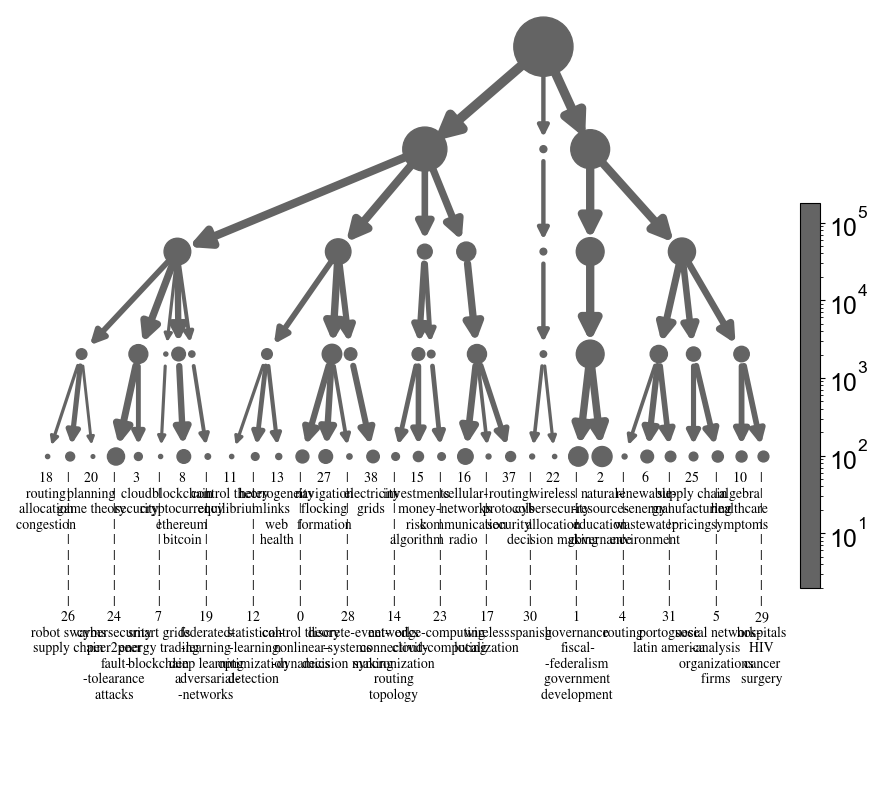

In [112]:
figsize=(12,10)
fig = plt.figure(figsize=figsize)
ax = plt.gca()
pos = create_hierarchy_network_docs(partition=0, top_level=6, bottom_level=2, 
                             max_num_clusters_to_represent=10000, num_words_to_represent=20, 
                             multiplicator_size_nodes=.01, multiplicator_size_edges=1, multiplicator_ypos=0.30,
                             fontsize = 10, ax=ax, fig=fig, threshold_num_papers = 500, num_spaces=50,cmap = newcmp)# matplotlib.cm.get_cmap('black'))
plt.savefig(paper_figures_folder + "FigureSI_results_methods_lev2_hierarchy.pdf")

Do main figure

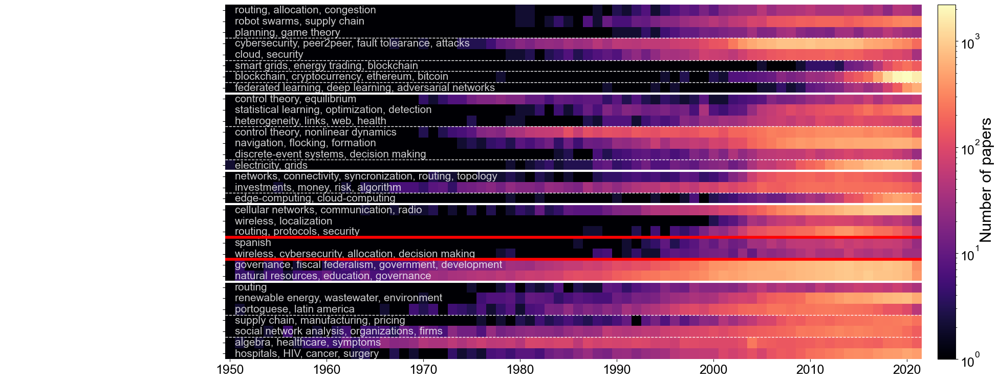

In [113]:
l = 2
year_cluster_log = year_cluster_field_no_papers_df_by_level[l].groupby(["year","cluster"],as_index=False).no_papers.sum()
year_cluster_log["no_papers_log"] = np.log([max(1,_) for _ in year_cluster_log["no_papers"]])

fig = plt.figure(figsize = (21,9))

outer = gridspec.GridSpec(nrows=1, ncols=3,width_ratios=[2,20,1],wspace=0.06)


level2_pos = [(x,y) for x,y in pos.items() if x.split("_")[0]=="2"]
ordered_lev2_clusters_pos = sorted(level2_pos,key = lambda x:x[1][0])
ordered_lev2_clusters = [int(x[0].split("_")[1].split("\n")[0]) for x in ordered_lev2_clusters_pos]


ordered_hierarchy_lev_3 = []
for c in ordered_lev2_clusters:
    for c3 in hierarchy_docs[l+1].keys():
        if c in hierarchy_docs[l+1][c3] and c3 not in [x[0] for x in ordered_hierarchy_lev_3]:
            ordered_hierarchy_lev_3.append((c3,hierarchy_docs[l+1][c3].intersection(set(ordered_lev2_clusters))))

ax = plt.Subplot(fig, outer[1])

data = year_cluster_log.copy()

fig, ax = heatmap(df=data, fixed_labels=[], x_label="year", y_label="cluster", values_label="no_papers_log", 
             costrains_equal={"year":set(range(1950,2022))},
             ordered_cluster_labels=ordered_lev2_clusters, ordered_cluster_groups=ordered_hierarchy_lev_3,linewidth=1,
             cut_small_clusters=True,threshold_num_papers=500,
             bottom_level = l, top_level = 6, use_only_first_keyword=False, use_keywords_as_ticks=False,
             ax=ax,fig=fig,do_barplot=False,linelength = 150)

fig.add_subplot(ax)
ax.set_xticks([x+0.5 for x in range(0,2022-1950,10)])
ax.set_xticklabels(range(1950,2022,10),rotation = 0)
ax.set_yticklabels([])


ax_cmap = plt.Subplot(fig, outer[2])
vmin = np.e**year_cluster_log.no_papers_log.unique().min()
vmax = year_cluster_log.no_papers.unique().max()
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.LogNorm(vmin=vmin, vmax=vmax), cmap=plt.get_cmap("magma")), ax=ax_cmap,shrink=1,pad=0., fraction=1,orientation="vertical")
ax_cmap.tick_params(labelsize=20) 
ax_cmap.axis('off')
fig.add_subplot(ax_cmap)
fig.text(0.907,0.5, "Number of papers", fontsize=22,verticalalignment="center", horizontalalignment="left", rotation=90)
fig.text(.0, 0.49, "(a)", fontsize=32, color="white",transform=fig.transFigure)

fig.savefig(f"{paper_figures_folder}FigureSI_results_methods_lev{l}_without_hierarchy.pdf",bbox_inches='tight')
fig.savefig(f"{paper_figures_folder}FigureSI_results_methods_lev{l}_without_hierarchy.png",bbox_inches='tight')

plt.show()

# Figure 2

In [114]:
level3_pos = [(x,y) for x,y in pos.items() if x.split("_")[0]=="3"]
ordered_lev3_clusters_pos = sorted(level3_pos,key = lambda x:x[1][0])
ordered_lev3_clusters = [int(x[0].split("_")[1].split("\n")[0]) for x in ordered_lev3_clusters_pos]

ordered_hierarchy_lev_4 = []
for c in ordered_lev3_clusters:
    for c3 in hierarchy_docs[4].keys():
        if c in hierarchy_docs[4][c3] and c3 not in [x[0] for x in ordered_hierarchy_lev_4]:
            ordered_hierarchy_lev_4.append((c3,hierarchy_docs[4][c3].intersection(set(ordered_lev3_clusters))))

/tmp/2544852.1.all.q/ipykernel_145253/199649935.py:308: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


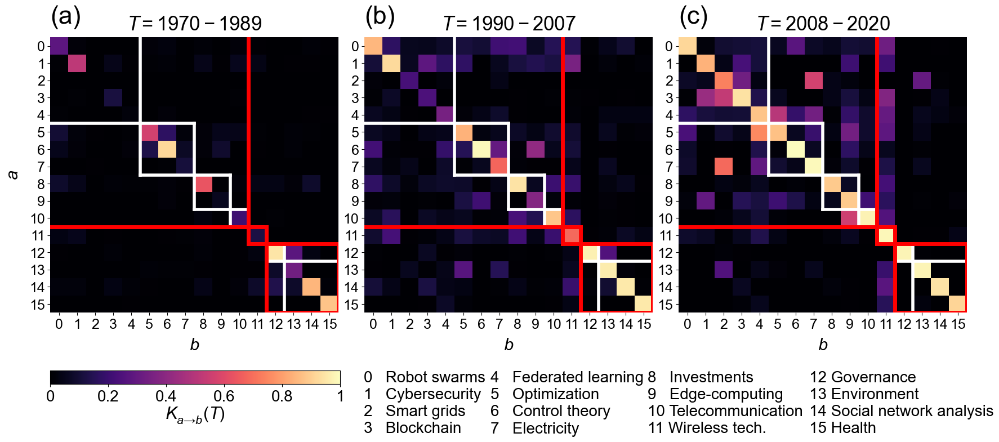

In [115]:
l = 3
fig = plt.figure(figsize=(21,8))
outer = gridspec.GridSpec(nrows=2, ncols=1,height_ratios=[20,1],hspace=0.4)
inner = gridspec.GridSpecFromSubplotSpec(1, 3,
                        subplot_spec=outer[0],wspace=0.09,hspace=0.12,)

for i,(year_from,year_to) in enumerate([(1970,1990),(1990,2008),(2008,2021)]):
    ax = plt.Subplot(fig, inner[i]) 
 
    tmp = knowledge_flow_normalized_per_field_in_time_to_future_by_level[l].copy()
    tmp = tmp.loc[tmp.year_from.isin(range(year_from,year_to))]
    tmp = tmp.groupby(["cluster_from","cluster_to"],as_index=False).significant_kf.mean()
    
    couples = set([tuple(x) for x in tmp[['cluster_from','cluster_to']].values])
    for cluster_f in keywords_clusters[l].keys():
        for cluster_t in keywords_clusters[l].keys():
            if (cluster_f,cluster_t) not in couples:
                tmp.loc[len(tmp)] = [cluster_f,cluster_t,0]
            
    fig,ax = heatmap(df=tmp, fixed_labels=[], x_label="cluster_to", y_label="cluster_from", values_label="significant_kf", 
            costrains_equal={},figsize=(21,18),
                 filename='',
                 ordered_cluster_labels=ordered_lev3_clusters, ordered_cluster_groups=ordered_hierarchy_lev_4,linewidth=2,
                 cut_small_clusters=True,threshold_num_papers=500,do_barplot=False,fig=fig,ax=ax, vmax=1,
                 bottom_level=3,top_level=6)
    
    ax.set_title("$T = %d - %d$"%(year_from,year_to-1),y=1.01)
    fig.add_subplot(ax)
    ax.set_xlabel(r"$b$",labelpad = 8) # to
    if i==0:
        ax.set_ylabel(r"$a$",labelpad = 10) # from
#     elif i==2:
#         ax.set_ylabel(r"$a$",labelpad = 10) # from
#         ax.yaxis.set_label_position("right")
    
    ax.text(.00, 1.05, "(%s)"%'abc'[i], fontsize=32, transform=ax.transAxes)
    
inner = gridspec.GridSpecFromSubplotSpec(1, 3, width_ratios = [1,1,1],
                        subplot_spec=outer[1],wspace=0.08,hspace=0.12,)

ax_cmap = plt.Subplot(fig, inner[0])
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(vmin=0,vmax=1), cmap=plt.get_cmap("magma")), cax=ax_cmap,shrink=1,pad=0., fraction=1,orientation="horizontal")
ax_cmap.tick_params(labelsize=20)
ax_cmap.text(0.5,-1.55, r"$K_{a \to b}(T)$", fontsize=22,verticalalignment="top", horizontalalignment="center")
cb.set_ticks([0,0.2,0.4,0.6,0.8,1])
ax_cmap.set_xticklabels(['0','0.2','0.4','0.6','0.8','1'])
fig.add_subplot(ax_cmap)

for num_plot in range(1,3):
    ax = plt.Subplot(fig, inner[num_plot])
    ax.axis('off')
    fig.add_subplot(ax)
    
    
num_clusters = 16
num_columns = 4 # under each plot
width_ratios = [0.77,0.955,0.98, 1.1] # must be same length as num_columns
left_x = 0.39
right_x = 0.92
for num_column in range(num_columns): 
    text = ''
    for i in range(int(num_clusters/num_columns*num_column), 
                  int(num_clusters/num_columns*(num_column+1))):
        if "wireless" in one_keyword_lev_3[i].lower():
            text += f'{i}%s Wireless tech.\n'%('  ' if i<10 else '')
        else:
            text += f'{i}%s {one_keyword_lev_3[i]}\n'%('  ' if i<10 else '')
    x_pos = left_x + (right_x - left_x) * sum(width_ratios[:num_column]) / sum(width_ratios)
    fig.text(x_pos, 0.14, "%s"%text[:-1], verticalalignment = 'top', horizontalalignment = 'left', fontsize=20, transform=fig.transFigure)

fig.savefig(f"{paper_figures_folder}Figure2.pdf")
fig.savefig(f"{paper_figures_folder}Figure2.png")

# Figure 3

In [116]:
def rank_plot(
    direction='from',
    clusters = [6], 
    l = 3, 
    threshold_num_papers = 500, 
    ax = ax, 
    colors = ['red'], 
    not_rank = False, 
    first_year = 2008, 
    last_year = 2021,
):
    if direction == 'from':
        direction_inverse = 'to'
    else:
        direction_inverse = 'from'
        
    df = knowledge_flow_normalized_per_field_in_time_to_future_by_level[l].copy()
    df = df.groupby([f"cluster_{direction_inverse}",f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
    df = df.groupby([f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
    
    # Cut elements in df where there is no papers in a cluster in a year... Doing this filtering all with sig.kf == 0
    df = df.loc[df.significant_kf > 0]
    
    to_keep = [x for x in df[f"cluster_{direction}"].unique() if len([y for y in name2partition_by_level[l].keys() if name2partition_by_level[l][y]==x]) >= 500]

    df = df.loc[df[f"cluster_{direction}"].isin(to_keep)]
    df['rank'] = df.groupby("year_from").significant_kf.rank(ascending=False,method='first')

    if not_rank:
        df['rank'] = df['significant_kf']
    
    palette = {x:'grey' for x in range(30)}
    palette[6] = 'red'
    
    for cluster in clusters:
        t = df.loc[(df.year_from>=first_year)&(df.year_from<=last_year)&(df[f"cluster_{direction}"] == cluster)].sort_values("year_from")
        if l == 3:
            label = one_keyword_lev_3[cluster]
        else:
            label = keywords_clusters_onekeyword[l][cluster]
        ax.plot(t.year_from,t['rank'],color=colors[clusters.index(cluster)],linewidth=5,zorder=1000, label=label, 
                marker='o',markersize=5,markerfacecolor='grey',markeredgecolor=colors[clusters.index(cluster)])
    check_other_cluster = False
    for cluster in df[f'cluster_{direction}'].unique():
        if cluster not in clusters:
            t = df.loc[(df.year_from>=first_year)&(df.year_from<=last_year)&(df[f"cluster_{direction}"] == cluster)].sort_values("year_from")
            if check_other_cluster == False:
                ax.plot(t.year_from,t['rank'],color='grey',linewidth=1, marker='o',markersize=2,alpha=0.5, label = 'other clusters')
                check_other_cluster = True
            ax.plot(t.year_from,t['rank'],color='grey',linewidth=1, marker='o',markersize=2,alpha=0.5)
            
    if not not_rank:
        ax.invert_yaxis()
        ticks = ax.set_yticks(range(1,17))
    
    return ax, df

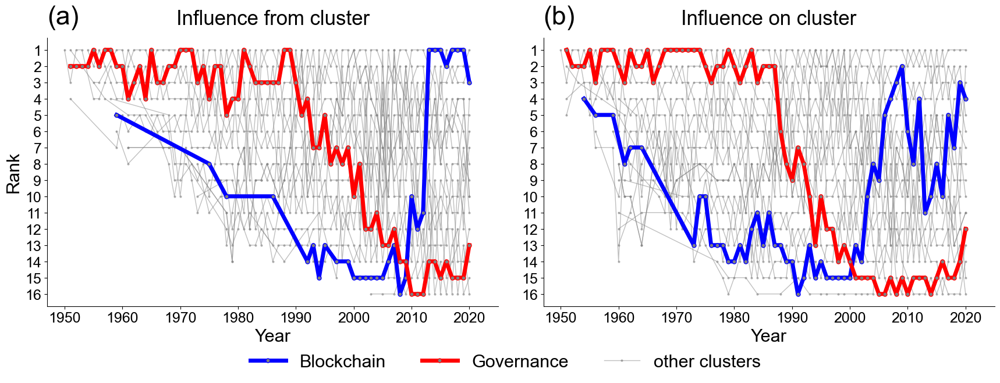

In [117]:
fig, axes = plt.subplots(1,2,figsize=(21,6), gridspec_kw={"wspace":0.1})

colors = ['blue','red']
clusters = [3,12]

ax = axes[0]
ax,df_from = rank_plot(direction='from',clusters = clusters, l = 3, threshold_num_papers = 500, ax = ax, colors = colors, first_year=1950,last_year = 2020)
ax.set_title("Influence from cluster", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=1947, right=2025)
ax.set_ylabel("Rank")
ax.text(.00, 1.05, "(%s)"%'a', fontsize=32, transform=ax.transAxes)

ax = axes[1]
ax,df_to = rank_plot(direction='to',clusters = clusters, l = 3, threshold_num_papers = 500, ax = ax, colors = colors, first_year=1950,last_year = 2020)
ax.set_title("Influence on cluster", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=1947, right=2025)
ax.text(.00, 1.05, "(%s)"%'b', fontsize=32, transform=ax.transAxes)

legend = plt.legend(loc='center',bbox_to_anchor = [0.5,-0.05], bbox_transform = fig.transFigure, ncol=len(clusters)+1, fontsize=22)

fig.savefig(f"{paper_figures_folder}Figure3.pdf")
fig.savefig(f"{paper_figures_folder}Figure3.png")

In [118]:
df_from.loc[df_from.cluster_from == 3]

,cluster_from,year_from,significant_kf,rank
120,3,1959,0.001401,5.0
121,3,1975,0.007215,8.0
122,3,1978,0.002976,10.0
123,3,1986,0.008790,10.0
124,3,1992,0.001667,14.0
125,3,1993,0.026916,13.0
126,3,1994,0.001786,15.0
127,3,1995,0.012963,13.0
129,3,1997,0.014083,14.0
131,3,1999,0.002174,14.0


In [119]:
pd.set_option('display.max_rows', 500)
df_to.loc[df_to.cluster_to == 3]

,cluster_to,year_from,significant_kf,rank
412,3,1954,0.007143,4.0
414,3,1956,0.007143,5.0
417,3,1959,0.008403,5.0
419,3,1961,0.003676,8.0
420,3,1962,0.017647,7.0
422,3,1964,0.021008,7.0
431,3,1973,0.002674,13.0
432,3,1974,0.009804,10.0
433,3,1975,0.013774,10.0
434,3,1976,0.003030,13.0


In [120]:
pd.set_option('display.max_rows', 500)
df_from.loc[df_from.year_from == 2020]

,cluster_from,year_from,significant_kf,rank
45,0,2020,0.052632,10.0
101,1,2020,0.052632,11.0
118,2,2020,0.131579,2.0
152,3,2020,0.131579,3.0
198,4,2020,0.210526,1.0
253,5,2020,0.078947,6.0
308,6,2020,0.078947,7.0
359,7,2020,0.105263,4.0
423,8,2020,0.026316,16.0
458,9,2020,0.078947,8.0


In [121]:
pd.set_option('display.max_rows', 500)
df_to.loc[df_to.year_from == 2020]

,cluster_to,year_from,significant_kf,rank
118,0,2020,0.052632,11.0
238,1,2020,0.026316,15.0
358,2,2020,0.105263,3.0
478,3,2020,0.105263,4.0
598,4,2020,0.105263,5.0
718,5,2020,0.078947,8.0
838,6,2020,0.078947,9.0
958,7,2020,0.105263,6.0
1078,8,2020,0.026316,16.0
1198,9,2020,0.105263,7.0


We notice in (a) that the rise of blockchain started only in 2010, being the almost always outside of the decentralization literature discussion until this point.
Then, very sharply, the cluster of blockchain becomes the first to influence other clusters in 2013, maintaining its position in the following years. 
Moreover, looking at blockchain in (b), papers of other clusters before early 2000s have had almost no impact on the scientific future of blockchain. Instead, from papers from 2006 to 2012 and, recently, from 2017 up to now, have been very influential on the future of blockchain. Notice, however, the loss of influence on blockchain of papers between 2013 and 2016.

In [122]:
pd.set_option('display.max_rows', 500)
df_from.loc[df_from.cluster_from == 12]

,cluster_from,year_from,significant_kf,rank
571,12,1919,0.000512,1.0
573,12,1926,0.002093,1.0
575,12,1928,0.001070,1.0
578,12,1932,0.000554,2.0
580,12,1935,0.014015,1.0
584,12,1940,0.003571,1.0
585,12,1941,0.007352,1.0
586,12,1942,0.038546,1.0
587,12,1943,0.010101,1.0
589,12,1947,0.001905,1.0


In [123]:
pd.set_option('display.max_rows', 500)
df_to.loc[df_to.cluster_to == 12]

,cluster_to,year_from,significant_kf,rank
1456,12,1908,0.005263,3.0
1459,12,1919,0.005376,1.0
1464,12,1926,0.021978,1.0
1466,12,1928,0.011236,1.0
1470,12,1932,0.005814,2.0
1472,12,1935,0.095238,1.0
1474,12,1937,0.006024,3.0
1477,12,1940,0.037500,1.0
1478,12,1941,0.082278,1.0
1479,12,1942,0.149573,1.0


In [124]:
pd.reset_option('display.max_rows', silent=True)

On the other side, it is interesting to notice how the governance cluster has been among the first ones in terms of influence from the other clusters on its future and from that cluster on the future of the clusters, but only until around 1990. After this it has lost importance in the scientific discussion in both ways, until it almost disappeared after 2000s.

# Figure SI governance and blockchain

## Average knowledge flow in time

In [125]:
l = 3

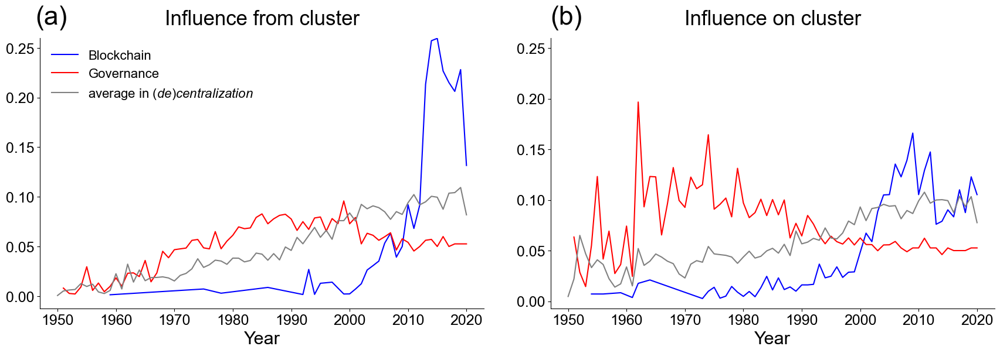

In [164]:
fig, axes = plt.subplots(1,2,figsize=(21,6), gridspec_kw={"wspace":0.15})

colors = ['blue','red']
clusters = [3,12]
first_year = 1950
last_year = 2020
top_lim = 0.26

ax = axes[0]
direction = 'from'
direction_inverse = 'to'
df = knowledge_flow_normalized_per_field_in_time_to_future_by_level[l].copy()
df = df.groupby([f"cluster_{direction_inverse}",f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
df = df.groupby([f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
# Cut elements in df where there is no papers in a cluster in a year... Doing this filtering all with sig.kf == 0
df = df.loc[df.significant_kf > 0]

for i,cluster in enumerate(clusters):
    tmp = df.loc[(df.cluster_from == cluster)&(df.year_from >= first_year)&(df.year_from <= last_year)]
    if l == 3:
        label = one_keyword_lev_3[cluster]
    else:
        label = keywords_clusters_onekeyword[l][cluster]
    ax.plot(tmp.year_from, tmp.significant_kf, color = colors[i], label = label)
tmp = df.groupby(["year_from"],as_index=False).significant_kf.mean()
tmp = tmp.loc[(tmp.year_from >= first_year)&(tmp.year_from <= last_year)]
ax.plot(tmp.year_from, tmp.significant_kf, color = 'gray', label = r'average in $\it{(de)centralization}$')

ax.set_title("Influence from cluster", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=1947, right=2023)
ax.set_yticks([0,0.05, 0.1, 0.15, 0.2, 0.25])
ax.set_ylim(top = top_lim)
legend = ax.legend()
ax.text(-.01, 1.05, "(%s)"%'a', fontsize=32, transform=ax.transAxes)
 

ax = axes[1]
direction = 'to'
direction_inverse = 'from'
df = knowledge_flow_normalized_per_field_in_time_to_future_by_level[l].copy()
df = df.groupby([f"cluster_{direction_inverse}",f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
df = df.groupby([f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
# Cut elements in df where there is no papers in a cluster in a year... Doing this filtering all with sig.kf == 0
df = df.loc[df.significant_kf > 0]

for i,cluster in enumerate(clusters):
    tmp = df.loc[(df.cluster_to == cluster)&(df.year_from >= first_year)&(df.year_from <= last_year)]
    if l == 3:
        label = one_keyword_lev_3[cluster]
    else:
        label = keywords_clusters_onekeyword[l][cluster]
    ax.plot(tmp.year_from, tmp.significant_kf, color = colors[i], label = label)
tmp = df.groupby(["year_from"],as_index=False).significant_kf.mean()
tmp = tmp.loc[(tmp.year_from >= first_year)&(tmp.year_from <= last_year)]
ax.plot(tmp.year_from, tmp.significant_kf, color = 'gray', label = r'$\it{(de)centralization}$')

ax.set_title("Influence on cluster", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=1947, right=2023)
ax.set_yticks([0,0.05, 0.1, 0.15, 0.2, 0.25])
ax.set_ylim(top = top_lim)
ax.text(.00, 1.05, "(%s)"%'b', fontsize=32, transform=ax.transAxes)


fig.savefig(f"{paper_figures_folder}FigureSI_blockchain_governance_influence.pdf")
fig.savefig(f"{paper_figures_folder}FigureSI_blockchain_governance_influence.png")

Repeat in a smaller amount of time to see better the dates in which there is a change in behaviour

Text(0.0, 1.05, '(b)')

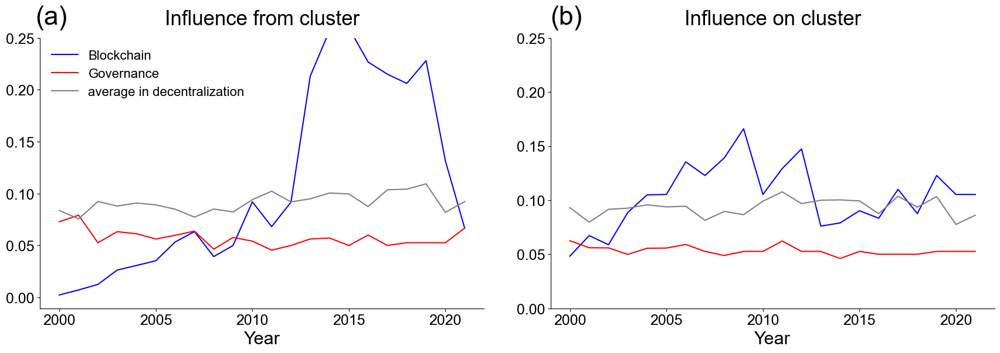

In [127]:
fig, axes = plt.subplots(1,2,figsize=(21,6), gridspec_kw={"wspace":0.15})

colors = ['blue','red']
clusters = [3,12]
first_year = 2000
last_year = 2021

ax = axes[0]
direction = 'from'
direction_inverse = 'to'
df = knowledge_flow_normalized_per_field_in_time_to_future_by_level[l].copy()
df = df.groupby([f"cluster_{direction_inverse}",f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
df = df.groupby([f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
# Cut elements in df where there is no papers in a cluster in a year... Doing this filtering all with sig.kf == 0
df = df.loc[df.significant_kf > 0]

for i,cluster in enumerate(clusters):
    tmp = df.loc[(df.cluster_from == cluster)&(df.year_from >= first_year)&(df.year_from <= last_year)]
    if l == 3:
        label = one_keyword_lev_3[cluster]
    else:
        label = keywords_clusters_onekeyword[l][cluster]
    ax.plot(tmp.year_from, tmp.significant_kf, color = colors[i], label = label)
tmp = df.groupby(["year_from"],as_index=False).significant_kf.mean()
tmp = tmp.loc[(tmp.year_from >= first_year)&(tmp.year_from <= last_year)]
ax.plot(tmp.year_from, tmp.significant_kf, color = 'gray', label = 'average in decentralization')

ax.set_title("Influence from cluster", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=first_year-1, right=last_year+1)
ax.set_yticks([0,0.05, 0.1, 0.15, 0.2, 0.25])
ax.set_ylim(top = 0.25)
legend = ax.legend()
ax.text(-.01, 1.05, "(%s)"%'a', fontsize=32, transform=ax.transAxes)
 

ax = axes[1]
direction = 'to'
direction_inverse = 'from'
df = knowledge_flow_normalized_per_field_in_time_to_future_by_level[l].copy()
df = df.groupby([f"cluster_{direction_inverse}",f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
df = df.groupby([f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
# Cut elements in df where there is no papers in a cluster in a year... Doing this filtering all with sig.kf == 0
df = df.loc[df.significant_kf > 0]

for i,cluster in enumerate(clusters):
    tmp = df.loc[(df.cluster_to == cluster)&(df.year_from >= first_year)&(df.year_from <= last_year)]
    if l == 3:
        label = one_keyword_lev_3[cluster]
    else:
        label = keywords_clusters_onekeyword[l][cluster]
    ax.plot(tmp.year_from, tmp.significant_kf, color = colors[i], label = label)
tmp = df.groupby(["year_from"],as_index=False).significant_kf.mean()
tmp = tmp.loc[(tmp.year_from >= first_year)&(tmp.year_from <= last_year)]
ax.plot(tmp.year_from, tmp.significant_kf, color = 'gray', label = 'all decentralization')

ax.set_title("Influence on cluster", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=first_year-1, right=last_year+1)
ax.set_yticks([0,0.05, 0.1, 0.15, 0.2, 0.25])
ax.set_ylim(top = 0.25)
ax.text(.00, 1.05, "(%s)"%'b', fontsize=32, transform=ax.transAxes)


# fig.savefig(f"{paper_figures_folder}FigureSI_blockchain_governance_influence.pdf")
# fig.savefig(f"{paper_figures_folder}FigureSI_blockchain_governance_influence.png")

## Number of papers in time

In [128]:
no_papers_df = year_cluster_field_no_papers_df_by_level[l].groupby(["year","cluster"],as_index=False).no_papers.sum()

In [129]:
def rank_plot_no_papers(clusters = [6], l = 3, threshold_num_papers = 500, ax = ax, colors = ['red'], not_rank = False, first_year = 2008, last_year = 2021):
    
    df = no_papers_df.loc[(no_papers_df.year >= first_year)&(no_papers_df.year <= last_year)]
    
    # Cut elements in df where there is no papers in a cluster in a year... Doing this filtering all with sig.kf == 0
    df = df.loc[df.no_papers > 0]
    
    to_keep = [x for x in df[f"cluster"].unique() if len([y for y in name2partition_by_level[l].keys() if name2partition_by_level[l][y]==x]) >= 500]
    df = df.loc[df[f"cluster"].isin(to_keep)]
    df['rank'] = df.groupby("year").no_papers.rank(ascending=False,method='first')

    if not_rank:
        df['rank'] = df['no_papers']
    
    palette = {x:'grey' for x in range(30)}
    palette[6] = 'red'
    
    for cluster in clusters:
        t = df.loc[(df.year>=first_year)&(df.year<=last_year)&(df[f"cluster"] == cluster)].sort_values("year")
        if l == 3:
            label = one_keyword_lev_3[cluster]
        else:
            label = keywords_clusters_onekeyword[l][cluster]
        ax.plot(t.year,t['rank'],color=colors[clusters.index(cluster)],linewidth=5,zorder=1000, label=label, 
                marker='o',markersize=5,markerfacecolor='grey',markeredgecolor=colors[clusters.index(cluster)])
    check_other_cluster = False
    for cluster in df[f'cluster'].unique():
        if cluster not in clusters:
            t = df.loc[(df.year>=first_year)&(df.year<=last_year)&(df[f"cluster"] == cluster)].sort_values("year")
            if check_other_cluster == False:
                ax.plot(t.year,t['rank'],color='grey',linewidth=1, marker='o',markersize=2,alpha=0.5, label = 'other clusters')
                check_other_cluster = True
            ax.plot(t.year,t['rank'],color='grey',linewidth=1, marker='o',markersize=2,alpha=0.5)
                 
    if not not_rank:
        ax.invert_yaxis()
        ticks = ax.set_yticks(range(1,17))
    
    return ax, df

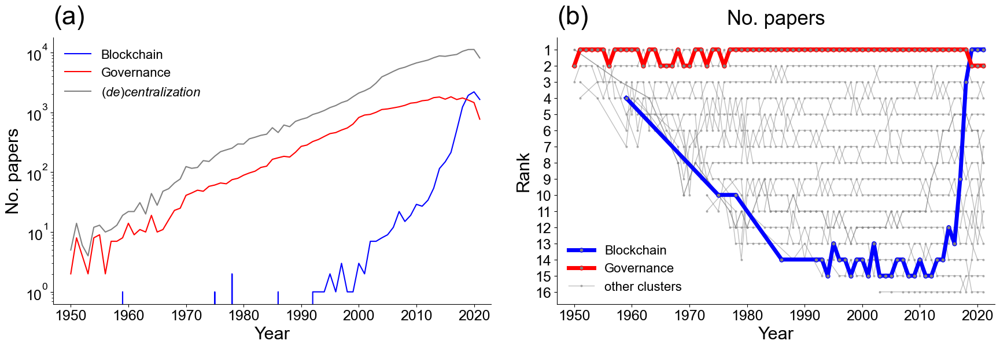

In [165]:
fig, axes = plt.subplots(1,2,figsize=(21,6), gridspec_kw={"wspace":0.15, "hspace":0.35})

colors = ['blue','red']
clusters = [3,12]
first_year = 1950
last_year = 2021

ax = axes[0]
for i,cluster in enumerate(clusters):
    tmp = no_papers_df.loc[(no_papers_df.cluster == cluster)&(no_papers_df.year >= first_year)&(no_papers_df.year <= last_year)]
    if l == 3:
        label = one_keyword_lev_3[cluster]
    else:
        label = keywords_clusters_onekeyword[l][cluster]
    ax.plot(tmp.year, tmp.no_papers, color = colors[i], label = label)
tmp = no_papers_df.groupby(["year"],as_index=False).no_papers.sum()
tmp = tmp.loc[(tmp.year >= first_year)&(tmp.year <= last_year)]
ax.plot(tmp.year, tmp.no_papers, color = 'gray', label = r'$\it{(de)centralization}$')

ax.set_xlabel("Year")
ax.set_xlim(left=1947, right=2023)
ax.set_ylabel("No. papers")
legend = ax.legend()
ax.set_yscale("log")
ax.text(.00, 1.05, "(%s)"%'a', fontsize=32, transform=ax.transAxes)


ax = axes[1]
ax,df_from = rank_plot_no_papers(clusters = clusters, l = 3, threshold_num_papers = 500, ax = ax, colors = colors, first_year=1950)
ax.set_title("No. papers", y=1.03)
ax.set_xlabel("Year")
ax.set_xlim(left=1947, right=2023)
ax.set_ylabel("Rank")
ax.text(.00, 1.05, "(%s)"%'b', fontsize=32, transform=ax.transAxes)

legend = ax.legend()


fig.savefig(f"{paper_figures_folder}FigureSI_governance_blockchain_no_papers.pdf")
fig.savefig(f"{paper_figures_folder}FigureSI_governance_blockchain_no_papers.png")

# Figure 4
Main figure is done in rplot.ipynb and got better in inkscape, here we just generate the data for it

Repeat once with chosen_cluster = 3 (for blockchain), once with chosen_cluster = 12 (governance)

In [131]:
from utils.hsbm_knowledge_flow import check_papers_existence,create_papers_existence_set,assign_partition

In [206]:
l = 3
chosen_cluster = 3
# chosen_cluster = 12
year1 = 2008
year2 = 2015
year3 = 2019
year4 = 2022

In [207]:
all_docs_dict2, t,tt = assign_partition(h_t_doc_consensus_by_level,hyperlink_g,l,all_docs_dict)

In [208]:
papers_existence_set = create_papers_existence_set(all_docs_dict2)

In [209]:
def average_kf_significance(df,years,cluster,threshold = 1, direction='from'):
    '''
    When choosing direction == from, we are looking at how each cluster has had an influence to the specified cluster in the parameters. 
    Hence, use the related plot as influence of clusters on the specified cluster!
    '''
    if direction == 'from':
        direction_inverse = 'to'
    else:
        direction_inverse = 'from'
        
    df = df.loc[(df[f'cluster_{direction_inverse}'] == cluster)&(df[f'year_{direction_inverse}'].isin(years))]
    
    df['significant_kf'] = df.knowledge_flow >= threshold

    df = df.groupby([f"cluster_{direction}","year_from"],as_index=False).significant_kf.mean()
    df = df.groupby([f"cluster_{direction}"],as_index=False).significant_kf.mean()
    
    df[f'cluster_{direction_inverse}'] = cluster
    
    return df

In [210]:
df11 = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year1,year2),chosen_cluster,direction='from')
df21 = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year2,year3),chosen_cluster,direction='from')
df31 = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year3,year4),chosen_cluster,direction='from')

df12 = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year1,year2),chosen_cluster,direction='to')
df22 = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year2,year3),chosen_cluster,direction='to')
df32 = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year3,year4),chosen_cluster,direction='to')

/tmp/2544852.1.all.q/ipykernel_181103/1791876735.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['significant_kf'] = df.knowledge_flow >= threshold
/tmp/2544852.1.all.q/ipykernel_181103/1791876735.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['significant_kf'] = df.knowledge_flow >= threshold
/tmp/2544852.1.all.q/ipykernel_181103/1791876735.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

In [211]:
clusters_to_keep = [x for x,y in keywords_clusters[l].items() if len([t for t in name2partition_by_level[l].keys() if name2partition_by_level[l][t]==x]) >= 500 ]

In [212]:
df = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year1,year4),chosen_cluster,direction='from')
df = df.loc[df.cluster_from.isin(clusters_to_keep)]

/tmp/2544852.1.all.q/ipykernel_181103/1791876735.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['significant_kf'] = df.knowledge_flow >= threshold


In [213]:
average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year1,year4),chosen_cluster,direction='from')

/tmp/2544852.1.all.q/ipykernel_181103/1791876735.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['significant_kf'] = df.knowledge_flow >= threshold


,cluster_from,significant_kf,cluster_to
0,0,0.055455,3
1,1,0.207890,3
2,2,0.298909,3
3,3,0.539738,3
4,4,0.006263,3
5,5,0.026896,3
6,6,0.002646,3
7,7,0.000000,3
8,8,0.041267,3
9,9,0.042274,3


In [214]:
tmp = df.sort_values("significant_kf",ascending=False)
tmp['cluster'] = tmp.cluster_from.map(keywords_clusters_onekeyword[l])

In [215]:
to_keep_from = tmp.cluster_from.iloc[:111].values
to_keep_from

array([ 3,  2,  1, 14,  0,  9,  8, 10, 11,  5, 12,  4, 13, 15,  6,  7])

In [216]:
df = average_kf_significance(knowledge_flow_normalized_per_field_in_time_by_level[l],range(year1,year4),chosen_cluster,direction='to')
df = df.loc[df.cluster_to.isin(clusters_to_keep)]

/tmp/2544852.1.all.q/ipykernel_181103/1791876735.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['significant_kf'] = df.knowledge_flow >= threshold


In [217]:
tmp = df.sort_values("significant_kf",ascending=False)
tmp['cluster'] = tmp.cluster_to.map(keywords_clusters_onekeyword[l])

In [218]:
to_keep_to = tmp.cluster_to.iloc[:111].values
to_keep_to

array([ 3,  2,  1, 11,  4,  9,  5, 14,  8, 10,  0, 13,  6,  7, 12, 15])

In [219]:
df_before_from = df11.loc[(df11.cluster_from.isin(clusters_to_keep))&(df11.cluster_from.isin(to_keep_from))].sort_values("significant_kf",ascending=False)
df_middle_from = df21.loc[(df21.cluster_from.isin(clusters_to_keep))&(df21.cluster_from.isin(to_keep_from))].sort_values("significant_kf",ascending=False)
df_after_from = df31.loc[(df31.cluster_from.isin(clusters_to_keep))&(df31.cluster_from.isin(to_keep_from))].sort_values("significant_kf",ascending=False)

df_before_from['keyword'] = df_before_from.cluster_from.map(one_keyword_lev_3)
df_middle_from['keyword'] = df_middle_from.cluster_from.map(one_keyword_lev_3)
df_after_from['keyword'] = df_after_from.cluster_from.map(one_keyword_lev_3)

df_before_from = df_before_from.sort_values(["significant_kf","keyword"],ascending=False)
df_middle_from = df_middle_from.sort_values(["significant_kf","keyword"],ascending=False)
df_after_from = df_after_from.sort_values(["significant_kf","keyword"],ascending=False)

df_before_from['rank'] = range(len(df_before_from))
df_middle_from['rank'] = np.array(range(len(df_middle_from))) + len(df_middle_from)
df_after_from['rank'] = np.array(range(len(df_after_from))) + len(df_after_from)*2

In [220]:
label = list(df_before_from.iloc[1:].cluster_from.values) + list(df_middle_from.iloc[1:].cluster_from.values) + list(df_after_from.iloc[1:].cluster_from.values)

source = []
target = []
value = []

for i in range(1,len(df_before_from)):
    source.append(df_before_from.iloc[i]['rank']-1.)
    target.append(df_middle_from.loc[df_middle_from.cluster_from == df_before_from.iloc[i]['cluster_from']]['rank'].iloc[0] -2.)
    value.append(1.)

for i in range(1,len(df_middle_from)):
    source.append(df_middle_from.iloc[i]['rank']-2.)
    target.append(df_after_from.loc[df_after_from.cluster_from == df_middle_from.iloc[i]['cluster_from']]['rank'].iloc[0] - 3.)
    value.append(1.)

data = pd.DataFrame(data = {'source':source,
                           'target':target,
                           'value':value})

In [221]:
# data.to_csv(os.path.join(results_folder,"Figure_4_data_from3.csv"),index=False)
data.to_csv(os.path.join(results_folder,"SI_Figure_4_data_to.csv"),index=False)
# pd.Series(label,name='name').map(keywords_clusters_onekeyword[l]).to_csv(os.path.join(results_folder,"Figure_4_data_from3_nodes.csv"),index=False)
pd.Series(label,name='name').map(one_keyword_lev_3).to_csv(os.path.join(results_folder,"SI_Figure_4_data_to_nodes.csv"),index=False)

In [222]:
df_before_from = df11.loc[(df11.cluster_from.isin(clusters_to_keep))&(df11.cluster_from.isin(to_keep_from))].sort_values("significant_kf",ascending=False)
df_middle_from = df21.loc[(df21.cluster_from.isin(clusters_to_keep))&(df21.cluster_from.isin(to_keep_from))].sort_values("significant_kf",ascending=False)
df_after_from = df31.loc[(df31.cluster_from.isin(clusters_to_keep))&(df31.cluster_from.isin(to_keep_from))].sort_values("significant_kf",ascending=False)

df_before_from['keyword'] = df_before_from.cluster_from.map(one_keyword_lev_3)
df_middle_from['keyword'] = df_middle_from.cluster_from.map(one_keyword_lev_3)
df_after_from['keyword'] = df_after_from.cluster_from.map(one_keyword_lev_3)

df_before_from = df_before_from.sort_values(["significant_kf","keyword"],ascending=False)
df_middle_from = df_middle_from.sort_values(["significant_kf","keyword"],ascending=False)
df_after_from = df_after_from.sort_values(["significant_kf","keyword"],ascending=False)

df_before_from['rank'] = np.array(range(len(df_before_from))) + len(df_before_from)
df_middle_from['rank'] = np.array(range(len(df_middle_from))) + len(df_middle_from) + len(df_before_from)
df_after_from['rank'] = np.array(range(len(df_after_from))) + len(df_after_from) + len(df_before_from) + len(df_middle_from)

In [223]:
label = list(df_before_from.iloc[1:].cluster_from.values) + list(df_before_from.iloc[1:].cluster_from.values) + list(df_middle_from.iloc[1:].cluster_from.values) + list(df_after_from.iloc[1:].cluster_from.values)

source = []
target = []
value = []

for i in range(1,len(df_before_from)):
    source.append(i-1)
    target.append(df_before_from.iloc[i]['rank']-2.)
    value.append(1.)
    
for i in range(1,len(df_before_from)):
    source.append(df_before_from.iloc[i]['rank']-2.)
    target.append(df_middle_from.loc[df_middle_from.cluster_from == df_before_from.iloc[i]['cluster_from']]['rank'].iloc[0] -3.)
    value.append(1.)

for i in range(1,len(df_middle_from)):
    source.append(df_middle_from.iloc[i]['rank']-3.)
    target.append(df_after_from.loc[df_after_from.cluster_from == df_middle_from.iloc[i]['cluster_from']]['rank'].iloc[0] - 4.)
    value.append(1.)

data = pd.DataFrame(data = {'source':source,
                           'target':target,
                           'value':value})

In [224]:
data.to_csv(os.path.join(results_folder,"Figure_4_data_to.csv"),index=False)
pd.Series(label,name='name').map(one_keyword_lev_3).to_csv(os.path.join(results_folder,"Figure_4_data_to_nodes.csv"),index=False)

# data.to_csv(os.path.join(results_folder,"SI_Figure_4_data_to.csv"),index=False)
# pd.Series(label,name='name').map(one_keyword_lev_3).to_csv(os.path.join(results_folder,"SI_Figure_4_data_to_nodes.csv"),index=False)

In [225]:
df_before_to = df12.loc[(df12.cluster_to.isin(clusters_to_keep))&(df12.cluster_to.isin(to_keep_to))].sort_values("significant_kf",ascending=False)
df_middle_to = df22.loc[(df22.cluster_to.isin(clusters_to_keep))&(df22.cluster_to.isin(to_keep_to))].sort_values("significant_kf",ascending=False)
df_after_to = df32.loc[(df32.cluster_to.isin(clusters_to_keep))&(df32.cluster_to.isin(to_keep_to))].sort_values("significant_kf",ascending=False)

df_before_to['keyword'] = df_before_to.cluster_to.map(one_keyword_lev_3)
df_middle_to['keyword'] = df_middle_to.cluster_to.map(one_keyword_lev_3)
df_after_to['keyword'] = df_after_to.cluster_to.map(one_keyword_lev_3)

df_before_to = df_before_to.sort_values(["significant_kf","keyword"],ascending=False)
df_middle_to = df_middle_to.sort_values(["significant_kf","keyword"],ascending=False)
df_after_to = df_after_to.sort_values(["significant_kf","keyword"],ascending=False)

df_before_to['rank'] = range(len(df_before_to))
df_middle_to['rank'] = np.array(range(len(df_middle_to))) + len(df_middle_to)
df_after_to['rank'] = np.array(range(len(df_after_to))) + len(df_after_to)*2

In [226]:
label = list(df_before_to.iloc[1:].cluster_to.values) + list(df_middle_to.iloc[1:].cluster_to.values) + list(df_after_to.iloc[1:].cluster_to.values)

source = []
target = []
value = []

for i in range(1,len(df_before_to)):
    source.append(df_before_to.iloc[i]['rank']-1.)
    target.append(df_middle_to.loc[df_middle_to.cluster_to == df_before_to.iloc[i]['cluster_to']]['rank'].iloc[0] -3.)
    value.append(1.)

for i in range(1,len(df_after_to)):
    source.append(df_middle_to.iloc[i]['rank']-2.)
    target.append(df_after_to.loc[df_after_to.cluster_to == df_middle_to.iloc[i]['cluster_to']]['rank'].iloc[0] - 4.)
    value.append(1.)

data = pd.DataFrame(data = {'source':source,
                           'target':target,
                           'value':value})

In [227]:
data.to_csv(os.path.join(results_folder,"Figure_4_data_to3.csv"),index=False)
# pd.Series(label,name='name').map(keywords_clusters_onekeyword[l]).to_csv(os.path.join(results_folder,"Figure_4_data_to3_nodes.csv"),index=False)
pd.Series(label,name='name').map(one_keyword_lev_3).to_csv(os.path.join(results_folder,"Figure_4_data_to3_nodes.csv"),index=False)

In [228]:
df_before_to = df12.loc[(df12.cluster_to.isin(clusters_to_keep))&(df12.cluster_to.isin(to_keep_to))].sort_values("significant_kf",ascending=False)
df_middle_to = df22.loc[(df22.cluster_to.isin(clusters_to_keep))&(df22.cluster_to.isin(to_keep_to))].sort_values("significant_kf",ascending=False)
df_after_to = df32.loc[(df32.cluster_to.isin(clusters_to_keep))&(df32.cluster_to.isin(to_keep_to))].sort_values("significant_kf",ascending=False)

df_before_to['keyword'] = df_before_to.cluster_to.map(one_keyword_lev_3)
df_middle_to['keyword'] = df_middle_to.cluster_to.map(one_keyword_lev_3)
df_after_to['keyword'] = df_after_to.cluster_to.map(one_keyword_lev_3)

df_before_to = df_before_to.sort_values(["significant_kf","keyword"],ascending=False)
df_middle_to = df_middle_to.sort_values(["significant_kf","keyword"],ascending=False)
df_after_to = df_after_to.sort_values(["significant_kf","keyword"],ascending=False)

df_before_to['rank'] = np.array(range(len(df_before_to))) + len(df_before_to)
df_middle_to['rank'] = np.array(range(len(df_middle_to))) + len(df_middle_to) + len(df_before_to)
df_after_to['rank'] = np.array(range(len(df_after_to))) + len(df_after_to) + len(df_before_to) + len(df_middle_to)

In [229]:
if chosen_cluster == 12:
    label = list(df_before_from.iloc[1:].cluster_from.values) +[2] + list(df_before_to.iloc[1:].cluster_to.values) + list(df_middle_to.iloc[1:].cluster_to.values) + list(df_after_to.iloc[1:].cluster_to.values)
else:
    label = list(df_before_from.iloc[1:].cluster_from.values) + list(df_before_to.iloc[1:].cluster_to.values) + list(df_middle_to.iloc[1:].cluster_to.values) + list(df_after_to.iloc[1:].cluster_to.values)

source = []
target = []
value = []

count = 1
for i in range(1,len(df_before_to)):
    source.append(i-1)
    try:
        target.append(df_before_to.loc[df_before_to.cluster_to == df_before_from.iloc[i]['cluster_from']]['rank'].iloc[0] - 2.)
    except Exception:
        target.append(22)
        count += 1
        print("WOOOOOO")
        print(i-1)
    value.append(1.)
    
for i in range(1,len(df_before_to)):
    source.append(df_before_to.iloc[i]['rank']- 2.)
    target.append(df_middle_to.loc[df_middle_to.cluster_to == df_before_to.iloc[i]['cluster_to']]['rank'].iloc[0] -3.)
    value.append(1.)

for i in range(1,len(df_after_to)):
    source.append(df_middle_to.iloc[i]['rank']-3.)
    target.append(df_after_to.loc[df_after_to.cluster_to == df_middle_to.iloc[i]['cluster_to']]['rank'].iloc[0] - 4.)
    value.append(1.)

data = pd.DataFrame(data = {'source':source,
                           'target':target,
                           'value':value})

In [230]:
# data.to_csv(os.path.join(results_folder,"Figure_4_data_from.csv"),index=False)
# pd.Series(label,name='name').map(one_keyword_lev_3).to_csv(os.path.join(results_folder,"Figure_4_data_from_nodes.csv"),index=False)

data.to_csv(os.path.join(results_folder,"SI_Figure_4_data_from.csv"),index=False)
pd.Series(label,name='name').map(one_keyword_lev_3).to_csv(os.path.join(results_folder,"SI_Figure_4_data_from_nodes.csv"),index=False)

In [231]:
pd.Series(label,name='name').map(one_keyword_lev_3).iloc[:30]

0               Cybersecurity
1           Telecommunication
2                Optimization
3     Social network analysis
4              Edge-computing
5                Robot swarms
6                  Governance
7                      Health
8                 Investments
9                 Environment
10      Wireless technologies
11                Smart grids
12         Federated learning
13                Electricity
14             Control theory
15              Cybersecurity
16                Smart grids
17             Edge-computing
18      Wireless technologies
19         Federated learning
20               Optimization
21    Social network analysis
22          Telecommunication
23                Investments
24               Robot swarms
25                Environment
26                     Health
27                 Governance
28                Electricity
29             Control theory
Name: name, dtype: object

In [232]:
df_middle_to

,cluster_to,significant_kf,cluster_from,keyword,rank
3,3,1.000000,3,Blockchain,32
2,2,0.937500,3,Smart grids,33
11,11,0.845833,3,Wireless technologies,34
1,1,0.747619,3,Cybersecurity,35
4,4,0.226190,3,Federated learning,36
9,9,0.077381,3,Edge-computing,37
8,8,0.071429,3,Investments,38
10,10,0.000000,3,Telecommunication,39
14,14,0.000000,3,Social network analysis,40
0,0,0.000000,3,Robot swarms,41


In [233]:
df_before_from.cluster_from = df_before_from.cluster_from.map(one_keyword_lev_3)
df_middle_from.cluster_from = df_middle_from.cluster_from.map(one_keyword_lev_3)
df_after_from.cluster_from = df_after_from.cluster_from.map(one_keyword_lev_3)

df_before_to.cluster_to = df_before_to.cluster_to.map(one_keyword_lev_3)
df_middle_to.cluster_to = df_middle_to.cluster_to.map(one_keyword_lev_3)
df_after_to.cluster_to = df_after_to.cluster_to.map(one_keyword_lev_3)

In [234]:
df_before_from['region'] = df_before_from.significant_kf.apply(lambda x: 1 if x>=0.1 else (2 if x>=0.01 else 3))
df_middle_from['region'] = df_middle_from.significant_kf.apply(lambda x: 1 if x>=0.1 else (2 if x>=0.01 else 3))
df_after_from['region'] = df_after_from.significant_kf.apply(lambda x: 1 if x>=0.1 else (2 if x>=0.01 else 3))
df_before_to['region'] = df_before_to.significant_kf.apply(lambda x: 1 if x>=0.1 else (2 if x>=0.01 else 3))
df_middle_to['region'] = df_middle_to.significant_kf.apply(lambda x: 1 if x>=0.1 else (2 if x>=0.01 else 3))
df_after_to['region'] = df_after_to.significant_kf.apply(lambda x: 1 if x>=0.1 else (2 if x>=0.01 else 3))

In [235]:
if chosen_cluster == 3:
    name_cluster = 'blockchain'
elif chosen_cluster == 12:
    name_cluster = 'governance'

os.makedirs(f"{paper_figures_folder}/Figure4/{name_cluster}/",exist_ok = True)

df_before_from.to_csv(f"{paper_figures_folder}/Figure4/{name_cluster}/influence_on_{name_cluster}_left.csv",index=False)
df_middle_from.to_csv(f"{paper_figures_folder}/Figure4/{name_cluster}/influence_on_{name_cluster}_middle.csv",index=False)
df_after_from.to_csv(f"{paper_figures_folder}/Figure4/{name_cluster}/influence_on_{name_cluster}_right.csv",index=False)
df_before_to.to_csv(f"{paper_figures_folder}/Figure4/{name_cluster}/influence_from_{name_cluster}_left.csv",index=False)
df_middle_to.to_csv(f"{paper_figures_folder}/Figure4/{name_cluster}/influence_from_{name_cluster}_middle.csv",index=False)
df_after_to.to_csv(f"{paper_figures_folder}/Figure4/{name_cluster}/influence_from_{name_cluster}_right.csv",index=False)

In [236]:
df_middle_to

,cluster_to,significant_kf,cluster_from,keyword,rank,region
3,Blockchain,1.000000,3,Blockchain,32,1
2,Smart grids,0.937500,3,Smart grids,33,1
11,Wireless technologies,0.845833,3,Wireless technologies,34,1
1,Cybersecurity,0.747619,3,Cybersecurity,35,1
4,Federated learning,0.226190,3,Federated learning,36,1
9,Edge-computing,0.077381,3,Edge-computing,37,2
8,Investments,0.071429,3,Investments,38,2
10,Telecommunication,0.000000,3,Telecommunication,39,3
14,Social network analysis,0.000000,3,Social network analysis,40,3
0,Robot swarms,0.000000,3,Robot swarms,41,3


In [237]:
df_middle_to

,cluster_to,significant_kf,cluster_from,keyword,rank,region
3,Blockchain,1.000000,3,Blockchain,32,1
2,Smart grids,0.937500,3,Smart grids,33,1
11,Wireless technologies,0.845833,3,Wireless technologies,34,1
1,Cybersecurity,0.747619,3,Cybersecurity,35,1
4,Federated learning,0.226190,3,Federated learning,36,1
9,Edge-computing,0.077381,3,Edge-computing,37,2
8,Investments,0.071429,3,Investments,38,2
10,Telecommunication,0.000000,3,Telecommunication,39,3
14,Social network analysis,0.000000,3,Social network analysis,40,3
0,Robot swarms,0.000000,3,Robot swarms,41,3


In [238]:
df_after_to

,cluster_to,significant_kf,cluster_from,keyword,rank,region
3,Blockchain,1.000000,3,Blockchain,48,1
2,Smart grids,0.500000,3,Smart grids,49,1
11,Wireless technologies,0.250000,3,Wireless technologies,50,1
1,Cybersecurity,0.111111,3,Cybersecurity,51,1
10,Telecommunication,0.000000,3,Telecommunication,52,3
14,Social network analysis,0.000000,3,Social network analysis,53,3
0,Robot swarms,0.000000,3,Robot swarms,54,3
5,Optimization,0.000000,3,Optimization,55,3
8,Investments,0.000000,3,Investments,56,3
15,Health,0.000000,3,Health,57,3


# Figure SI (bipartite clusters-topics})

Follow all the steps here, then the final figure in the article is created with inkscape

## Load data hSBM
Retrieve a state of one iteration the hSBM. Then recontruct the consensus state

In [239]:
txt = results_folder[:-1]
parent_folder = results_folder[::-1][txt[::-1].index('/')+1:][::-1]
ID = 1
no_iterMC = 5000
ID_results_folder = os.path.join(parent_folder,f'ID_{ID}_no_iterMC_{no_iterMC}/')
ID_results_folder

'data/2022-01-01/decentralization/0_min_inCitations_5_min_word_occurrences_titles/ID_1_no_iterMC_5000/'

In [240]:
with gzip.open(f"{ID_results_folder}results_fit_greedy{filter_label}.pkl.gz","rb") as fp:
    hyperlink_text_hsbm_states,time_duration = pickle.load(fp)

In [241]:
model = hyperlink_text_hsbm_states[0]
state = model.state
hsbm_g = model.g

print(state,"\n")
levels = state.get_levels()
for i,s in enumerate(levels):
    print(i,s)
    if s.get_N() == 1:
        break

<NestedBlockState object, with base <LayeredBlockState object with 196645 blocks, 2 layers, degree-corrected, for graph <Graph object, directed, with 196722 vertices and 1987045 edges, 3 internal vertex properties, 2 internal edge properties, at 0x2af48c34a700>, at 0x2af4934f3220>, and 19 levels of sizes [(196722, 1617), (1617, 624), (624, 165), (165, 42), (42, 18), (18, 6), (6, 2), (2, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1)] at 0x2af48f83c610> 

0 <LayeredBlockState object with 196645 blocks, 2 layers, degree-corrected, for graph <Graph object, directed, with 196722 vertices and 1987045 edges, 3 internal vertex properties, 2 internal edge properties, at 0x2af48c34a700>, at 0x2af4934f3220>
1 <LayeredBlockState object with 1468 blocks, 2 layers, for graph <Graph object, directed, with 196645 vertices and 234523 edges, at 0x2af47ac37fd0>, at 0x2af48cc23310>
2 <LayeredBlockState object with 379 blocks, 2 layers, for graph <Graph object, 

## Create bipartite graph

In [242]:
initial_level = 3

In [257]:
def create_bipartite_clusters_topics_graph(
    hsbm_g, 
    level, 
    h_t_doc_consensus_by_level, 
    h_t_word_consensus_by_level, 
    name2partition_by_level, 
    threshold_num_papers = 500,
    threshold_num_word_usage = 5000,
    return_counts = False,
    use_real_doc_for_doc_nodes = True,
    count_topic2cluster_links = None,
    order_clusters = None,
    order_topics = None,
):
    '''
        Creates a bipartite graph between clusters and topics to create a sankey diagram. 
        The way the hierarchical blockstate is drawn uses the node degrees. 
        So to create a sankey diagram we create a graph in which for each topic there is a node for each link between a doc and a word in that topic.
        Same applies for clusters of docs.
        
        Here clusters names at the initial_level are ordered as in the other figures, with all other clusters following the hierarchy.
        
        If return_counts is True, does not cut any clusters nor topics
        
        Run this function twice, first with return_counts=True to get all info and counts, then False, providing the other parameters.
        
        If you want to impose an order in which clusters and topics should appear, then provide them
        
        Parameters
        ----------
            - hsbm_g: graph generated by the multilayer hSBM.
    '''
    n_docs = len(h_t_doc_consensus_by_level[level]) # total number of documents
    n_docs_original = len(h_t_doc_consensus_by_level[level])
    if level == 3:
        keywords = one_keyword_lev_3
    else:
        keywords = keywords_clusters_onekeyword[level]
    # Count papers in clusters
    df = pd.DataFrame({'cluster':h_t_doc_consensus_by_level[level]})
    count_docs_in_clusters_tmp = df.value_counts().to_dict() # for some reasons the keys are tuples...
    count_docs_in_clusters = {key[0]:value for key,value in count_docs_in_clusters_tmp.items()}
    count_topic_links = None
    if return_counts == False:
        n_docs = sum([value for value in count_docs_in_clusters.values() if value >= threshold_num_papers])
        clusters_to_keep = [key for key,value in count_docs_in_clusters.items() if value >= threshold_num_papers]
        count_topic_links_new = {}
        for topic in count_topic2cluster_links.keys():
            tmp_count_sum = sum([count_topic2cluster_links[topic][cluster] for cluster in count_topic2cluster_links[topic].keys() if cluster in clusters_to_keep])
            if tmp_count_sum >= threshold_num_word_usage:
                count_topic_links_new[topic] = tmp_count_sum
        count_topic_links = count_topic_links_new.copy()
    
    # Create new graph
    g = gt.Graph()
    g.set_directed(False)
    vkind = g.new_vertex_property("int",val=-1)
    g.vertex_properties["kind"] = vkind # doc is 0, word is 1
    vname = g.new_vertex_property("string",val='')
    g.vertex_properties["name"] = vname # name of node, id of doc or word
    vnode = g.new_vertex_property("string",val='')
    g.vertex_properties["node"] = vnode # name of node, id of doc or word
    vblock = g.new_vertex_property("int",val=-1)
    g.vertex_properties["block"] = vblock # number of the block
    vblock_name = g.new_vertex_property("string",val='')
    g.vertex_properties["block_name"] = vblock_name # name of node, id of doc or word
    
    count_doc_nodes = 0
    nodes_indexes_original2new = {}
    count_topic_nodes = 0
    if count_topic2cluster_links is None:
        count_topic2cluster_links = {}
    current_count_topic2cluster_links = {}
    
    # Add vertices and edges
    for v1, v2 in tqdm(hsbm_g.edges()):
        if hsbm_g.vp['kind'][v1] != hsbm_g.vp['kind'][v2]:
            if hsbm_g.vp['kind'][v1] == 0:
                doc_v = v1
                word_v = v2
            else:
                doc_v = v2
                word_v = v1
            
            doc_name = hsbm_g.vp['name'][doc_v]
            word_name = hsbm_g.vp['name'][word_v]
            cluster = name2partition_by_level[level][doc_name]
            cluster_name = keywords[cluster]
            topic = h_t_word_consensus_by_level[level][int(word_v) - n_docs_original]
            topic_name = str(topic)
            
            if return_counts == True:
                if topic not in count_topic2cluster_links:
                    count_topic2cluster_links[topic] = {}
                if cluster not in count_topic2cluster_links[topic]:
                    count_topic2cluster_links[topic][cluster] = 0
                count_topic2cluster_links[topic][cluster] += 1
            
            if count_docs_in_clusters[cluster] < threshold_num_papers:
                continue
            
            if count_topic_links is not None and (topic not in count_topic_links or count_topic_links[topic] < threshold_num_word_usage):
                continue
            
            doc_node = str(int(doc_v)) # original doc node index in hsbm_g
            if int(doc_v) in nodes_indexes_original2new:
                doc_node_index = nodes_indexes_original2new[int(doc_v)]
            else:
                doc_node_index = count_doc_nodes
                nodes_indexes_original2new[int(doc_v)] = doc_node_index
                count_doc_nodes += 1
                vkind[doc_node_index] = 0
                vnode[doc_node_index] = doc_node
                vname[doc_node_index] = doc_name
                vblock[doc_node_index] = cluster
                vblock_name[doc_node_index] = cluster_name
            
            if topic not in current_count_topic2cluster_links:
                current_count_topic2cluster_links[topic] = {cluster:0}
            if cluster not in current_count_topic2cluster_links[topic]:
                current_count_topic2cluster_links[topic][cluster] = 0
                                
            topic_node = f'topic_{topic}_index_{count_topic_nodes}'
            if return_counts == True or order_clusters is None or order_topics is None or count_topic_links is None:
                topic_node_index = n_docs + count_topic_nodes # if some papers are cut, there might be jumpS in the number of indexes
            else:
                # this is the index of the topic
                # start from number of docs
                topic_node_index = n_docs
                # add the number of nodes in previous topics in order_topics
                for tmp_topic in order_topics[:order_topics.index(topic)]:
#                     if count_topic_links[tmp_topic] >= threshold_num_word_usage: # this is not needed because they should all be True
                        topic_node_index += count_topic_links[tmp_topic]
                # add the number of nodes in previous clusters in order_clusters referring to this topic
                for tmp_cluster in order_clusters[:order_clusters.index(cluster)]:
                    if tmp_cluster in clusters_to_keep:
                        topic_node_index += count_topic2cluster_links[topic][tmp_cluster]
                # add the number of already added nodes in this cluster referring to this topic
                topic_node_index += current_count_topic2cluster_links[topic][cluster]
                
            current_count_topic2cluster_links[topic][cluster] += 1
            
            g.add_edge(doc_node_index, topic_node_index)
            count_topic_nodes += 1
            
            vkind[topic_node_index] = 1
            vnode[topic_node_index] = topic_node
            vname[topic_node_index] = word_name
            vblock[topic_node_index] = topic
            vblock_name[topic_node_index] = topic_name
    print('Count doc nodes:', count_doc_nodes, 'Count topic nodes:', count_topic_nodes)
    print('Created graph:', g)
    if return_counts == True:
        return g, count_docs_in_clusters, count_topic2cluster_links, nodes_indexes_original2new, current_count_topic2cluster_links
    else:
        return g, nodes_indexes_original2new, current_count_topic2cluster_links
bipartite_g, count_docs_in_clusters, count_topic2cluster_links, nodes_indexes_original2new, current_count_topic2cluster_links = create_bipartite_clusters_topics_graph(hsbm_g,initial_level,h_t_doc_consensus_by_level, h_t_word_consensus_by_level, name2partition_by_level, 
                                                                                                return_counts = True, threshold_num_papers=0)
print('\n', 'count_docs_in_clusters', count_docs_in_clusters,)# '\n', 'count_cluster_links', count_cluster_links, '\n', 'count_topic_links', count_topic_links)
n_edges = len(list(bipartite_g.edges()))
print('There are', len(list(bipartite_g.vertices())) - n_edges, 'docs and', n_edges, 'edges')

0it [00:00, ?it/s]

Count doc nodes: 181184 Count topic nodes: 1396830
Created graph: <Graph object, undirected, with 1578435 vertices and 1396830 edges, 5 internal vertex properties, at 0x2af48cfa4d90>

 count_docs_in_clusters {12: 40045, 6: 19758, 10: 18804, 1: 18437, 13: 15386, 15: 12343, 14: 10375, 3: 9637, 8: 8394, 7: 8090, 5: 5878, 0: 5843, 9: 2970, 11: 2166, 4: 2043, 2: 867, 17: 258, 20: 160, 19: 146, 16: 3, 18: 2}
There are 181605 docs and 1396830 edges


In [258]:
# This order comes from the way the plot is done in the end. 
# It is manually done looking at the figure
order_clusters = [11,12,14,15,13,9,8,10,2,4,0,3,1,5,7,6]
order_topics = [32, 24, 23, 26, 22, 27, 33, 30, 25, 21, 28, 29]

In [259]:
bipartite_g, nodes_indexes_original2new, current_count_topic2cluster_links = create_bipartite_clusters_topics_graph(hsbm_g,initial_level,h_t_doc_consensus_by_level, h_t_word_consensus_by_level, name2partition_by_level,
                                                     count_topic2cluster_links=count_topic2cluster_links,
                                                     order_clusters=order_clusters, order_topics=order_topics,
                                                     threshold_num_papers = 500,
                                                     threshold_num_word_usage = 5000,)
n_edges = len(list(bipartite_g.edges()))
print('There are', len(list(bipartite_g.vertices())) - n_edges, 'docs and', n_edges, 'edges')

0it [00:00, ?it/s]

Count doc nodes: 180607 Count topic nodes: 1381799
Created graph: <Graph object, undirected, with 1562835 vertices and 1381799 edges, 5 internal vertex properties, at 0x2af475a28be0>
There are 181036 docs and 1381799 edges


In [260]:
count_cluster_links = {}
for topic, clusters_dict in count_topic2cluster_links.items():
    for cluster,count in clusters_dict.items():
        try:
            count_cluster_links[cluster] += count
        except:
            count_cluster_links[cluster] = count
sum([count_cluster_links[cluster] for cluster in count_cluster_links])

1396830

7.463219600911433 1974.8573512609146


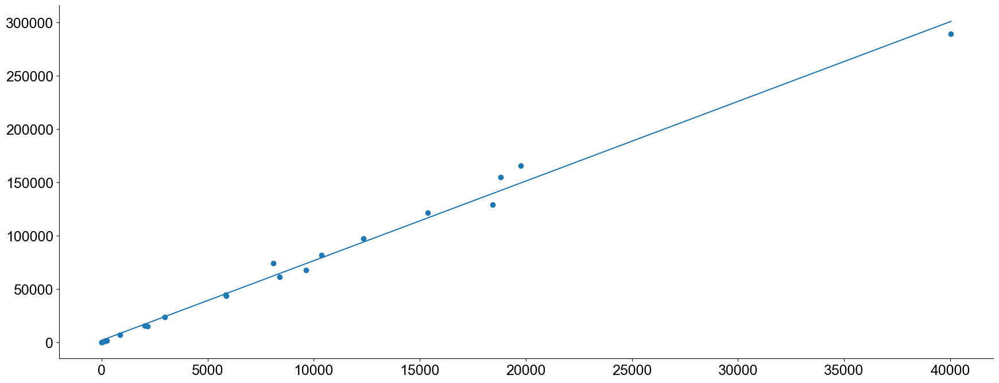

In [261]:
clusters = list({cluster for cluster in count_docs_in_clusters}.intersection({cluster for cluster in count_cluster_links}))
plt.scatter([count_docs_in_clusters[cluster] for cluster in clusters], [count_cluster_links[cluster] for cluster in clusters])
x = np.arange(max([count_docs_in_clusters[cluster] for cluster in clusters]))
slope, intercept, rvalue, pvalue, stderr, = linregress([count_docs_in_clusters[cluster] for cluster in clusters], [count_cluster_links[cluster] for cluster in clusters])
plt.plot(x, x*slope + intercept)
print(slope, intercept)

## Create state

In [262]:
def create_state_hsbm(bipartite_g, initial_level):
    bs_list = []
    node2block_list_0 = []
    n_clusters = len(set([value for value in count_docs_in_clusters.values() if value > threshold_num_papers]))
    max_new_level_clusters = -1
    for v in bipartite_g.vertices():
        block = bipartite_g.vp.block[v]
        node2block_list_0.append(block)
        if bipartite_g.vp.kind[v] == 0:
            max_new_level_clusters = max(max_new_level_clusters, block)
    bs_list.append(np.array(node2block_list_0))
    for lev in range(initial_level+1, max(list(hierarchy_docs.keys()))):
        max_last_level_clusters = max_new_level_clusters
        max_new_level_clusters = -1
        bs_last_level_list = bs_list[-1]
        bs_new_level_list = []
        for cluster in range(max(bs_last_level_list)+1):
            if cluster <= max_last_level_clusters:
                hierarchy = hierarchy_docs[lev]
            else:
                hierarchy = hierarchy_words[lev]
            # search for parent cluster
            parent = 0 # ACHTUNG THIS PUTS ALL CLUSTERS THAT ARE NOT FOUND INTO PARENT 0. With -1 the kernel restarted
            for tmp_parent, children in hierarchy.items():
                if cluster in children:
                    parent = tmp_parent
                    break
            bs_new_level_list.append(parent)
            if cluster <= max_last_level_clusters:
                max_new_level_clusters = max(max_new_level_clusters, parent)
        bs_list.append(np.array(bs_new_level_list))
    # add common root between clusters and topics
    bs_list.append(np.array([0 for i in range(max(bs_list[-1])+1)]))
    # create state with the given graph and list of arrays of blocks
    try:
        new_state = gt.NestedBlockState(g=bipartite_g, bs = bs_list) 
        return new_state, bs_list, bipartite_g
    except ValueError as e:
        print(e)
        return None, bs_list, bipartite_g

In [263]:
new_state, bs_list, bipartite_g = create_state_hsbm(bipartite_g, initial_level=initial_level)

In [264]:
new_state

<NestedBlockState object, with base <BlockState object with 34 blocks (28 nonempty), degree-corrected, for graph <Graph object, undirected, with 1562835 vertices and 1381799 edges, 5 internal vertex properties, at 0x2af475a28be0>, at 0x2af48cfb0b20>, and 5 levels of sizes [(1562835, 28), (28, 11), (11, 4), (4, 2), (2, 1)] at 0x2af48cfb0700>

In [265]:
bs_list[1:]

[array([ 0,  0,  0,  0,  0,  1,  1,  1,  4,  4,  5,  6,  2,  3,  3,  3,  0,
         0,  0,  0,  0,  9, 10, 10, 11,  9, 10, 10,  9,  9,  9, 12, 12,  9]),
 array([0, 0, 2, 2, 0, 0, 1, 0, 0, 4, 4, 4, 4]),
 array([0, 0, 0, 0, 2]),
 array([0, 0, 0])]

## 1st Plot

In [266]:
blocks_list = list(set(bs_list[0]))
N = len(blocks_list)
tmp_palette = sn.color_palette("colorblind", N) 

In [267]:
tmp_palette

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784),
 (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784),
 (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [268]:
palette = tmp_palette

In [269]:
colors = {}
for i,block in enumerate(blocks_list):
    colors[block] = [1, *palette[i], 0.1]

colors2 = {}
for i,block in enumerate(blocks_list):
#     colors2[block] = [1, *palette[i], 0.1]
    colors2[block] = [*palette[i]]

In [274]:
degrees = bipartite_g.degree_property_map("total")

In [275]:
v_size = bipartite_g.new_vp("double")
for v in bipartite_g.vertices():
    v_size[v] = 2*np.log(v.out_degree()+1)

In [276]:
color_vertices = bipartite_g.new_vp("vector<double>")

for v in bipartite_g.vertices():
    color_vertices[v] = colors2[bs_list[0][int(v)]] 

In [277]:
color_edges = bipartite_g.new_ep("vector<double>")

for e in tqdm(bipartite_g.edges()):
    source,target = e
    color_edges[e] = colors[bs_list[0][int(source)]] 

0it [00:00, ?it/s]

In [278]:
t, tlabel, torder = gt.get_hierarchy_tree(new_state)

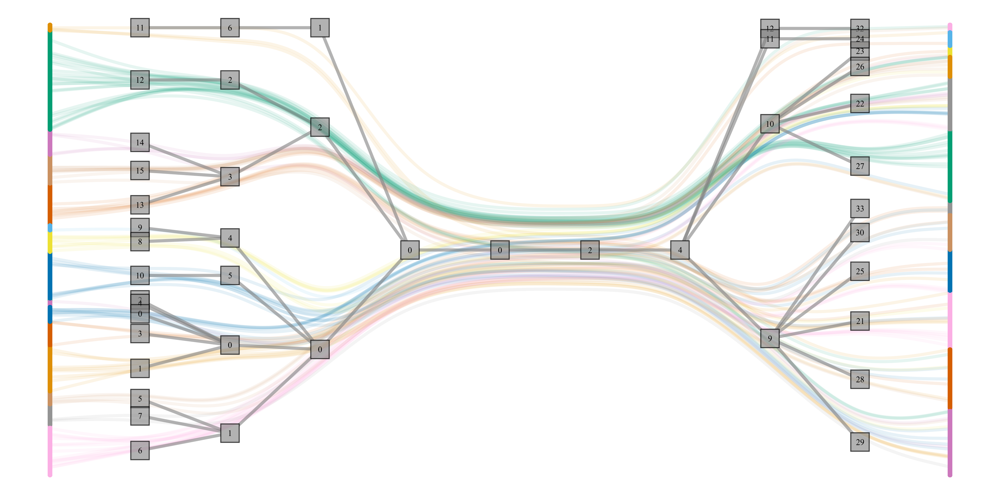

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2af475a28be0, at 0x2af48fcc4760>,
 <Graph object, directed, with 1562881 vertices and 1562880 edges, at 0x2af490135610>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2af490135610, at 0x2af49763e400>)

In [279]:
new_state.draw(
    bg_color='w',
    output_size=(1920, 1200),
    vprops = {"size":8,#v_size, 
              "fill_color":color_vertices, "color":color_vertices, 
             },

    subsample_edges = 100, 
    beta = 0.8,
    vsize_scale = 100,
    eprops = {"pen_width":6,#.1,
              "gradient":color_edges},
    hvprops = {"size":50, "pen_width":2,"color":[0.,0.,0.,0.7], "fill_color":[0.5,0.5,0.5,0.6], 
               "text":tlabel, "text_color":"black","font_size":16,
              },
    heprops = {"pen_width":6, "color":[0.5,0.5,0.5,0.6]},
    layout = "bipartite",
    bip_aspect = 2)

## 2nd Plot

In [280]:
n_clusters = len(set([value for value in count_docs_in_clusters.values() if value > threshold_num_papers]))
n_clusters_all = len(set([value for value in count_docs_in_clusters.values()]))
n_clusters, n_clusters_all

(16, 21)

In [281]:
remap_clusters_bipartite_plot = {}
remap_clusters_bipartite_plot_inverse = {}
counter = 0
for key in [11,12,14,15,13,9,8,10,2,4,0,3,1,5,7,6]:
    remap_clusters_bipartite_plot[key] = counter
    remap_clusters_bipartite_plot_inverse[counter] = key
    counter += 1
remap_clusters_bipartite_plot

{11: 0,
 12: 1,
 14: 2,
 15: 3,
 13: 4,
 9: 5,
 8: 6,
 10: 7,
 2: 8,
 4: 9,
 0: 10,
 3: 11,
 1: 12,
 5: 13,
 7: 14,
 6: 15}

In [282]:
remap_topics_bipartite_plot = {}
remap_topics_bipartite_plot_inverse = {}
counter = 0
for key in [32, 24, 23, 26, 22, 27, 33, 30, 25, 21, 28, 29]: #[11,3,2,5,1,6,12,9,4,0,10,7,8]:
    remap_topics_bipartite_plot[key] = counter
    remap_topics_bipartite_plot_inverse[counter] = key
    counter += 1
remap_topics_bipartite_plot

{32: 0,
 24: 1,
 23: 2,
 26: 3,
 22: 4,
 27: 5,
 33: 6,
 30: 7,
 25: 8,
 21: 9,
 28: 10,
 29: 11}

In [283]:
t, tlabel, torder = gt.get_hierarchy_tree(new_state)

In [284]:
n = bipartite_g.num_vertices()
len_bs_0 = len(set(bs_list[0]))
tv_names = t.new_vp("string",val='')
for v in tqdm(t.vertices()):
    try:
        if int(v) < n:
            continue
        elif int(v) < n + n_clusters:
            tv_names[v] = 'C'+str(remap_clusters_bipartite_plot[tlabel[v]])
        elif int(v) < n + len_bs_0:
            tv_names[v] = 'T'+str(remap_topics_bipartite_plot[tlabel[v]])#-n_clusters_all])
        else:
            continue
    except KeyError:
        continue

0it [00:00, ?it/s]

In [285]:
from PIL import Image, ImageDraw
import colorsys

def make_rainbow_rgb(colors, width, height):
    """colors is an array of RGB tuples, with values between 0 and 255"""

    img = Image.new("RGBA", (width, height))
    canvas = ImageDraw.Draw(img)

    def hsl(x):
        to_float = lambda x : x / 255.0
        (r, g, b) = map(to_float, x)
        h, s, l = colorsys.rgb_to_hsv(r,g,b)
        h = h if 0 < h else 1 # 0 -> 1
        return h, s, l

    rainbow = sorted(colors, key=hsl)

    dx = width / float(len(colors)) 
    x = 0
    y = height / 2.0
    for rgb in rainbow:
        canvas.line((x, y, x + dx, y), width=height, fill=rgb)
        x += dx
    img.show()
    return rainbow

def get_colors(N):
    colors = distinctipy.get_colors(16)
    colors2 = [(int(color[0]*255.),int(color[1]*255.),int(color[2]*255.)) for color in colors]
    rainbow = make_rainbow_rgb(colors2, 1000,200)
    rainbow2 = [(float(color[0])/255.,float(color[1])/255.,float(color[2])/255.) for color in rainbow]
    return rainbow2

def switch_colors(colors, index1, index2):
    colors2 = []
    for i,color in enumerate(colors):
        if i == index1:
            colors2.append(colors[index2])
        elif i == index2:
            colors2.append(colors[index1])
        else:
            colors2.append(color)
    return colors2

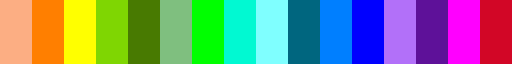

In [286]:
# This procedure creates a palette of distinct colors, that are then put in some kind of visual order
# The procedure is randomic, so you can do it multiple times until one gets the right palette
palette = get_colors(16)
distinctipy.get_colormap(palette) 

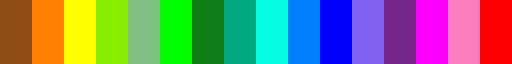

In [287]:
palette2 = [(0.5568627450980392, 0.29411764705882354, 0.07450980392156863),
 (1.0, 0.4980392156862745, 0.0),
 (1.0, 1.0, 0.0),
 (0.5254901960784314, 0.9254901960784314, 0.00392156862745098),
 (0.4980392156862745, 0.7490196078431373, 0.4980392156862745),
 (0.0, 1.0, 0.0),
 (0.054901960784313725, 0.49019607843137253, 0.08627450980392157),
 (0.0, 0.6549019607843137, 0.4980392156862745),
 (0.027450980392156862, 0.9921568627450981, 0.8901960784313725),
 (0.0, 0.4980392156862745, 1.0),
 (0.0, 0.0, 1.0),
 (0.5058823529411764, 0.3803921568627451, 0.9490196078431372),
 (0.4627450980392157, 0.15294117647058825, 0.5450980392156862),
 (1.0, 0.0, 1.0),
 (0.9803921568627451, 0.49411764705882355, 0.7450980392156863),
 (1.0, 0.0, 0.0)]
distinctipy.get_colormap(palette2) 

display: unable to open X server `' @ error/display.c/DisplayImageCommand/410.


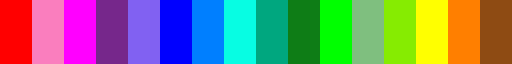

In [288]:
palette = palette2[::-1]
distinctipy.get_colormap(palette)

In [289]:
palette 

[(1.0, 0.0, 0.0),
 (0.9803921568627451, 0.49411764705882355, 0.7450980392156863),
 (1.0, 0.0, 1.0),
 (0.4627450980392157, 0.15294117647058825, 0.5450980392156862),
 (0.5058823529411764, 0.3803921568627451, 0.9490196078431372),
 (0.0, 0.0, 1.0),
 (0.0, 0.4980392156862745, 1.0),
 (0.027450980392156862, 0.9921568627450981, 0.8901960784313725),
 (0.0, 0.6549019607843137, 0.4980392156862745),
 (0.054901960784313725, 0.49019607843137253, 0.08627450980392157),
 (0.0, 1.0, 0.0),
 (0.4980392156862745, 0.7490196078431373, 0.4980392156862745),
 (0.5254901960784314, 0.9254901960784314, 0.00392156862745098),
 (1.0, 1.0, 0.0),
 (1.0, 0.4980392156862745, 0.0),
 (0.5568627450980392, 0.29411764705882354, 0.07450980392156863)]

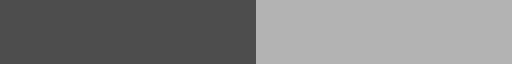

In [290]:
distinctipy.get_colormap([(0.3,0.3,0.3), (0.7,0.7,0.7)]) 

In [291]:
colors = {}
colors2 = {}

for old_block,new_block in remap_clusters_bipartite_plot.items():
    colors[old_block] = [1, *palette[new_block], 0.051]
    colors2[old_block] = [*palette[new_block]]

palette2 = [(0.3,0.3,0.3), (0.7,0.7,0.7)]
num_colors = 2
for old_block,new_block in remap_topics_bipartite_plot.items():
    colors[old_block] = [1, *palette2[new_block%num_colors], 0.1]
    colors2[old_block] = [*palette2[new_block%num_colors]]

In [292]:
color_vertices = bipartite_g.new_vp("vector<double>")

for v in bipartite_g.vertices():
    color_vertices[v] = colors2[bs_list[0][int(v)]] # [0, 0.68041891, 0.61514975, 0.19405452, 1]# 

In [293]:
color_edges = bipartite_g.new_ep("vector<double>")

for e in tqdm(bipartite_g.edges()):
    source,target = e
    color_edges[e] = colors[bs_list[0][int(source)]] # [0, 0.68041891, 0.61514975, 0.19405452, 1]# 

0it [00:00, ?it/s]

In [294]:
pos, h, hpos = new_state.draw(
    output=paper_figures_folder+"bipartite_figure.png", 
    bg_color='w',
    output_size=(720, 720),
    vprops = {"size":4,#v_size, 
              "fill_color":color_vertices, "color":color_vertices, 
             },

    subsample_edges = 10000,
    beta = 0.8, 
    vsize_scale = 100,
    eprops = {"pen_width":1,
              "gradient":color_edges},
    hvprops = {"size":20, "pen_width":1,"color":[0.,0.,0.,0.7], "fill_color":[0.5,0.5,0.5,0.6], 
               "text":tv_names, "text_color":"black","font_size":8,
              },
    heprops = {"pen_width":3, "color":[0.5,0.5,0.5,0.6]},
    layout = "bipartite", 
    bip_aspect = 1.5)

here fix bip_aspect = 2, because in next stage this is used to get the aspect ratio and the correct width and ending

If you change this here, do not forget to change in next section

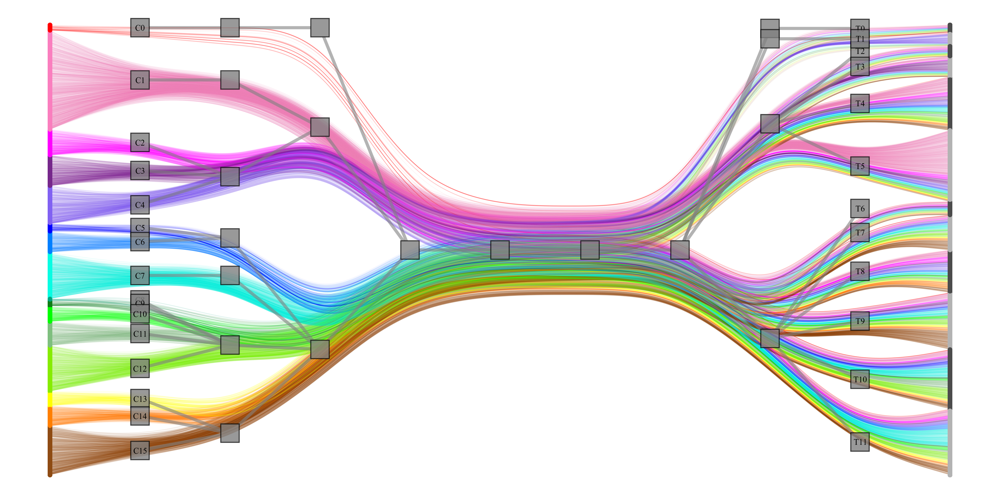

In [295]:
pos, h, hpos = new_state.draw(
#     output=paper_figures_folder+"bipartite_cut_levels_8_name_docs.png", 
    bg_color='w',
    output_size=(1920, 1200),
    vprops = {"size":8,#v_size, 
              "fill_color":color_vertices, "color":color_vertices, 
#               "text":text_nodes, "text_color":"black","font_size":text_font_size,  
#               "text_position":text_position
             },

    subsample_edges = 10000,
    beta = 0.8,
    vsize_scale = 100,
    eprops = {"pen_width":1,
              "gradient":color_edges},
    hvprops = {"size":50, "pen_width":2,"color":[0.,0.,0.,0.7], "fill_color":[0.5,0.5,0.5,0.8], 
               "text":tv_names, "text_color":"black","font_size":16,
              },
    heprops = {"pen_width":6, "color":[0.5,0.5,0.5,0.6]},
    layout = "bipartite",
    bip_aspect = 2)

In [296]:
cluster_table_df = pd.DataFrame({
    'cluster':['C'+str(key) for key in remap_clusters_bipartite_plot_inverse.keys()],
    'cluster in MT':list(remap_clusters_bipartite_plot_inverse.values()),
    'keyword':[one_keyword_lev_3[cluster] for cluster in remap_clusters_bipartite_plot_inverse.values()]
})
print(cluster_table_df)

   cluster  cluster in MT                  keyword
0       C0             11    Wireless technologies
1       C1             12               Governance
2       C2             14  Social network analysis
3       C3             15                   Health
4       C4             13              Environment
5       C5              9           Edge-computing
6       C6              8              Investments
7       C7             10        Telecommunication
8       C8              2              Smart grids
9       C9              4       Federated learning
10     C10              0             Robot swarms
11     C11              3               Blockchain
12     C12              1            Cybersecurity
13     C13              5             Optimization
14     C14              7              Electricity
15     C15              6           Control theory


In [297]:
print(cluster_table_df.to_latex(index=False))

\begin{tabular}{lrl}
\toprule
cluster &  cluster in MT &                 keyword \\
\midrule
     C0 &             11 &   Wireless technologies \\
     C1 &             12 &              Governance \\
     C2 &             14 & Social network analysis \\
     C3 &             15 &                  Health \\
     C4 &             13 &             Environment \\
     C5 &              9 &          Edge-computing \\
     C6 &              8 &             Investments \\
     C7 &             10 &       Telecommunication \\
     C8 &              2 &             Smart grids \\
     C9 &              4 &      Federated learning \\
    C10 &              0 &            Robot swarms \\
    C11 &              3 &              Blockchain \\
    C12 &              1 &           Cybersecurity \\
    C13 &              5 &            Optimization \\
    C14 &              7 &             Electricity \\
    C15 &              6 &          Control theory \\
\bottomrule
\end{tabular}



In [298]:
number_of_words = 10
topic_table_df = pd.DataFrame({
    'topic':['T'+str(key) for key in remap_topics_bipartite_plot_inverse.keys()],
    'words':[tuple([i for i in topics_df_by_level[initial_level][topic][:number_of_words] if not(pd.isna(i))]) for topic in remap_topics_bipartite_plot_inverse.keys()]
})
pd.options.display.max_colwidth = 200
print(topic_table_df)

   topic  \
0     T0   
1     T1   
2     T2   
3     T3   
4     T4   
5     T5   
6     T6   
7     T7   
8     T8   
9     T9   
10   T10   
11   T11   

                                                                                                             words  
0               (control, optimal, access, decentralised, cooperative, method, robust, peer, controller, multiple)  
1                      (based, management, study, service, case, strategy, evaluation, review, community, towards)  
2               (economic, urban, low, heterogeneous, web, organization, environmental, city, uncertain, business)  
3   (technology, flow, descentralización, em, décentralisation, technologies, na, descentralização, saúde, brasil)  
4                  (power, energy, centralized, information, supply, state, chain, coordination, planning, impact)  
5        (performance, process, centralization, treatment, use, industrial, driven, cancer, project, centralizers)  
6            (decentrali

In [299]:
print(topic_table_df.to_latex(index=False))

\begin{tabular}{ll}
\toprule
topic &                                                                                                          words \\
\midrule
   T0 &             (control, optimal, access, decentralised, cooperative, method, robust, peer, controller, multiple) \\
   T1 &                    (based, management, study, service, case, strategy, evaluation, review, community, towards) \\
   T2 &             (economic, urban, low, heterogeneous, web, organization, environmental, city, uncertain, business) \\
   T3 & (technology, flow, descentralización, em, décentralisation, technologies, na, descentralização, saúde, brasil) \\
   T4 &                (power, energy, centralized, information, supply, state, chain, coordination, planning, impact) \\
   T5 &      (performance, process, centralization, treatment, use, industrial, driven, cancer, project, centralizers) \\
   T6 &          (decentralization, local, development, health, governance, public, social, fiscal, governme

## Final plot

In [300]:
n_clusters = len(set([value for value in count_docs_in_clusters.values() if value > threshold_num_papers]))
n_clusters_all = len(set([value for value in count_docs_in_clusters.values()]))
n_clusters, n_clusters_all

(16, 21)

In [301]:
x_hpos = [hpos[v][0] for v in h.vertices()]
y_hpos = [hpos[v][1] for v in h.vertices()]

In [302]:
min_x_hpos, max_x_hpos, min_y_hpos, max_y_hpos = min(x_hpos),max(x_hpos), min(y_hpos),max(y_hpos)
min_x_hpos, max_x_hpos, min_y_hpos, max_y_hpos

(-1.0, 1.0, -0.49999963815287174, 0.49999963814803605)

In [303]:
hpos_hierarchy = [(int(v), hpos[v][0], hpos[v][1]) for v in h.vertices() if hpos[v][0] != -1 and hpos[v][0] < 1]#= 0]
hpos_hierarchy

[(1562835, -0.8, 0.14175633575642413),
 (1562836, -0.8, 0.2630637000375616),
 (1562837, -0.8, 0.11079011909233522),
 (1562838, -0.8, 0.18562053956119223),
 (1562839, -0.8, 0.11881338518305751),
 (1562840, -0.8, 0.3301608519852405),
 (1562841, -0.8, 0.44550807574184137),
 (1562842, -0.8, 0.3686946242736251),
 (1562843, -0.8, -0.018565368214056886),
 (1562844, -0.8, -0.049912724540975284),
 (1562845, -0.8, 0.056494288428820774),
 (1562846, -0.8, -0.4940315738306193),
 (1562847, -0.8, -0.37792207074835943),
 (1562848, -0.8, -0.10044134868203011),
 (1562849, -0.8, -0.23920380476811245),
 (1562850, -0.8, -0.1766996619456904),
 (1562851, 0.8, 0.15787643499524895),
 (1562852, 0.8, -0.3256606062097309),
 (1562853, 0.8, -0.44230854125672403),
 (1562854, 0.8, -0.4694123385528575),
 (1562855, 0.8, 0.04723733336035124),
 (1562856, 0.8, -0.4079156954086665),
 (1562857, 0.8, -0.18648768742776628),
 (1562858, 0.8, 0.28725704679189956),
 (1562859, 0.8, 0.4266629951244718),
 (1562860, 0.8, -0.038831262

In [304]:
hpos_hierarchy_tmp = hpos_hierarchy.copy()

In [305]:
minimum_y_pos = -0.5

In [306]:
# FIRST WITH TOPICS
# get all doc clusters pos
x_hpos_list = list(set([tuple_el[1] for tuple_el in hpos_hierarchy_tmp if tuple_el[1] > 0 and tuple_el[1] < 1]))
# xpos of clusters of last level
x_hpos = max(x_hpos_list)

hpos_hierarchy_level = [tuple_el for tuple_el in hpos_hierarchy_tmp if tuple_el[1] == x_hpos]
v_hpos_level_list = [tuple_el[0] for tuple_el in hpos_hierarchy_level]
x_hpos_level_list = [tuple_el[1] for tuple_el in hpos_hierarchy_level]
y_hpos_level_list = [tuple_el[2] for tuple_el in hpos_hierarchy_level]
width_y_hpos_hierarchy = {}
num_neighbors_topics = {}
current_y_hpos_topics = {}
last_end = minimum_y_pos
ordered_topics_old_fig = []
level = 0
print("LEVEL ", level)
counter = 0
while len(y_hpos_level_list) > 0:
    i = np.argmin(y_hpos_level_list)
    y = y_hpos_level_list[i]
    v = v_hpos_level_list[i] # sorted(v_hpos_level_list)[counter] # v_hpos_level_list[i]
    ordered_topics_old_fig.append(v)
    width = (y-last_end)*2
    width_y_hpos_hierarchy[v] = width
    num_neighbors_topics[v] = len(h.get_out_neighbors(v))
    current_y_hpos_topics[v] = last_end + width_y_hpos_hierarchy[v]/num_neighbors_topics[v]/2
    last_end += width
    counter += 1
    del v_hpos_level_list[i]
    del x_hpos_level_list[i]
    del y_hpos_level_list[i]

# THEN WITH CLUSTERS
# get all doc clusters pos
x_hpos_list = list(set([tuple_el[1] for tuple_el in hpos_hierarchy_tmp if tuple_el[1] > -1 and tuple_el[1] < 0]))
x_hpos = min(x_hpos_list)

hpos_hierarchy_level = [tuple_el for tuple_el in hpos_hierarchy_tmp if tuple_el[1] == x_hpos]
v_hpos_level_list = [tuple_el[0] for tuple_el in hpos_hierarchy_level]
x_hpos_level_list = [tuple_el[1] for tuple_el in hpos_hierarchy_level]
y_hpos_level_list = [tuple_el[2] for tuple_el in hpos_hierarchy_level]
last_end = minimum_y_pos
ordered_clusters_old_fig = []
level = 0
print("LEVEL ", level)
counter = 0
while len(y_hpos_level_list) > 0:
    i = np.argmin(y_hpos_level_list)
    y = y_hpos_level_list[i]
    v = v_hpos_level_list[i] # sorted(v_hpos_level_list)[counter] # v_hpos_level_list[i]
    ordered_clusters_old_fig.append(v)
    width = (y-last_end)*2
    width_y_hpos_hierarchy[v] = width
    last_end += width
    counter += 1
    del v_hpos_level_list[i]
    del x_hpos_level_list[i]
    del y_hpos_level_list[i]

pos_new = pos.copy()
hpos_new = hpos.copy()

last_end = minimum_y_pos
for v in sorted(ordered_clusters_old_fig):
    cluster = int(v) - bipartite_g.num_vertices()
    width = width_y_hpos_hierarchy[v]
    print(int(v),cluster,width, last_end + width/2)
    hpos_new[v] = (x_hpos, last_end + width/2)
    neighbors = h.get_out_neighbors(v)
    num_neighbors = len(neighbors)
    for i,doc in enumerate(neighbors):
        width_doc = width/num_neighbors
        pos_new[doc] = (-1, last_end + width_doc * (i + 1/2))
        hpos_new[doc] = (-1, last_end + width_doc * (i + 1/2))
        # change also the order in the topics
        for word in bipartite_g.get_out_neighbors(doc):
            topic = int(h.get_in_neighbors(word)[0])
            pos_new[word] = (1, current_y_hpos_topics[topic])
            hpos_new[word] = (1, current_y_hpos_topics[topic])
            current_y_hpos_topics[topic] += width_y_hpos_hierarchy[topic]/num_neighbors_topics[topic]
    last_end += width

while x_hpos in x_hpos_list:
    x_hpos_list.remove(x_hpos)

last_ordered_clusters = sorted(ordered_clusters_old_fig)
while len(x_hpos_list) > 0:
    if sum([len(h.get_in_neighbors(v)) for v in last_ordered_clusters]) == 0:
        break
    level += 1
    print("LEVEL ", level)
    x_hpos = min(x_hpos_list)
    ordered_clusters = []
    last_end = minimum_y_pos
    width = 0
    is_starting_node = True
    for item, v in enumerate(last_ordered_clusters):
        parent = h.get_in_neighbors(v)[0]
        if is_starting_node == False and parent != last_parent:
            # add last parent and do all modifications
            cluster = int(last_parent) - bipartite_g.num_vertices()
            print(int(last_parent),cluster,width, last_end + width/2)
            ordered_clusters.append(last_parent)
            hpos_new[last_parent] = (x_hpos, last_end + width/2)
            pos_new[last_parent] = (x_hpos, last_end + width/2)
            width_y_hpos_hierarchy[last_parent] = width
            # update
            last_end += width
            width = width_y_hpos_hierarchy[v]
        else:
            width += width_y_hpos_hierarchy[v]
        last_parent = parent
        if is_starting_node == True:
            is_starting_node = False
    hpos_new[last_parent] = (x_hpos, last_end + width/2)
    pos_new[last_parent] = (x_hpos, last_end + width/2)
    width_y_hpos_hierarchy[last_parent] = width
    print(int(last_parent),cluster,width, last_end + width/2)
    ordered_clusters.append(last_parent)
    last_ordered_clusters = ordered_clusters.copy()
    while x_hpos in x_hpos_list:
        x_hpos_list.remove(x_hpos)
    is_starting_node = True

LEVEL  0
LEVEL  0
1562835 0 0.03461190039550144 -0.4826940498022493
1562836 1 0.10176981373870392 -0.4145031927351466
1562837 2 0.004772531430212779 -0.3612320201506882
1562838 3 0.05311650721403477 -0.3322875008285645
1562839 4 0.011274000751231805 -0.30009224684593117
1562840 5 0.03242449015665394 -0.2782430013919883
1562841 6 0.10898384851631726 -0.20753883205550272
1562842 7 0.04464305442011529 -0.13072538058728644
1562843 8 0.0463001833889392 -0.0852537616827592
1562844 9 0.016394529264897595 -0.0539064053558408
1562845 10 0.10381912989681612 0.006200424225016057
1562846 11 0.011936852338761406 0.06407841534280481
1562847 12 0.22028215382575833 0.18018791842506468
1562848 13 0.08466271901721206 0.3326603548465499
1562849 14 0.05715437813473562 0.4035689034225237
1562850 15 0.0678539075101085 0.46607304624494583
LEVEL  1
1562863 28 0.2055447535296847 -0.39722762323515765
1562864 29 0.1860513930930865 -0.20142954992377204
1562867 32 0.0626947126538368 -0.0770564970503104
1562868 33 

In [307]:
# Change aspect ratio
for v in h.vertices():
    hpos_new[v] = (hpos_new[v][0], hpos_new[v][1]*1.5)
for v in bipartite_g.vertices():
    pos_new[v] = (pos_new[v][0], pos_new[v][1]*1.5)

In [308]:
remap_clusters_bipartite_plot = {}
remap_clusters_bipartite_plot_inverse = {}
counter = 0
for key in sorted(ordered_clusters_old_fig):# ordered_clusters_old_fig: # [11,12,14,15,13,9,8,10,2,4,0,3,1,5,7,6]:
    key -= bipartite_g.num_vertices()
    remap_clusters_bipartite_plot[key] = counter
    remap_clusters_bipartite_plot_inverse[counter] = key
    counter += 1
remap_clusters_bipartite_plot

{0: 0,
 1: 1,
 2: 2,
 3: 3,
 4: 4,
 5: 5,
 6: 6,
 7: 7,
 8: 8,
 9: 9,
 10: 10,
 11: 11,
 12: 12,
 13: 13,
 14: 14,
 15: 15}

In [309]:
remap_topics_bipartite_plot = {}
remap_topics_bipartite_plot_inverse = {}
counter = 0
for key in [32, 24, 23, 26, 22, 27, 33, 30, 25, 21, 28, 29]: #[11,3,2,5,1,6,12,9,4,0,10,7,8]:
    remap_topics_bipartite_plot[key] = counter
    remap_topics_bipartite_plot_inverse[counter] = key
    counter += 1
remap_topics_bipartite_plot

{32: 0,
 24: 1,
 23: 2,
 26: 3,
 22: 4,
 27: 5,
 33: 6,
 30: 7,
 25: 8,
 21: 9,
 28: 10,
 29: 11}

In [310]:
t, tlabel, torder = gt.get_hierarchy_tree(new_state)

In [311]:
n = bipartite_g.num_vertices()
len_bs_0 = len(set(bs_list[0]))
tv_names = t.new_vp("string",val='')
for v in tqdm(t.vertices()):
    try:
        if int(v) < n:
            continue
        elif int(v) < n + n_clusters:
            tv_names[v] = 'C'+str(tlabel[v]) # str(remap_clusters_bipartite_plot[tlabel[v]])
        elif int(v) < n + len_bs_0:
            tv_names[v] = 'T'+str(remap_topics_bipartite_plot[tlabel[v]])#-n_clusters_all])
        else:
            continue
    except KeyError:
        continue

0it [00:00, ?it/s]

In [312]:
from PIL import Image, ImageDraw
import colorsys

def make_rainbow_rgb(colors, width, height):
    """colors is an array of RGB tuples, with values between 0 and 255"""

    img = Image.new("RGBA", (width, height))
    canvas = ImageDraw.Draw(img)

    def hsl(x):
        to_float = lambda x : x / 255.0
        (r, g, b) = map(to_float, x)
        h, s, l = colorsys.rgb_to_hsv(r,g,b)
        h = h if 0 < h else 1 # 0 -> 1
        return h, s, l

    rainbow = sorted(colors, key=hsl)

    dx = width / float(len(colors)) 
    x = 0
    y = height / 2.0
    for rgb in rainbow:
        canvas.line((x, y, x + dx, y), width=height, fill=rgb)
        x += dx
    img.show()
    return rainbow

def get_colors(N):
    colors = distinctipy.get_colors(16)
    colors2 = [(int(color[0]*255.),int(color[1]*255.),int(color[2]*255.)) for color in colors]
    rainbow = make_rainbow_rgb(colors2, 1000,200)
    rainbow2 = [(float(color[0])/255.,float(color[1])/255.,float(color[2])/255.) for color in rainbow]
    return rainbow2

def switch_colors(colors, index1, index2):
    colors2 = []
    for i,color in enumerate(colors):
        if i == index1:
            colors2.append(colors[index2])
        elif i == index2:
            colors2.append(colors[index1])
        else:
            colors2.append(color)
    return colors2

display: unable to open X server `' @ error/display.c/DisplayImageCommand/410.


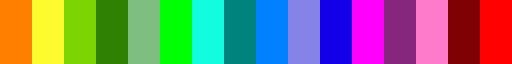

In [313]:
# This procedure creates a palette of distinct colors, that are then put in some kind of visual order
# The procedure is randomic, so you can do it multiple times until one gets the right palette
palette = get_colors(16)
distinctipy.get_colormap(palette) 

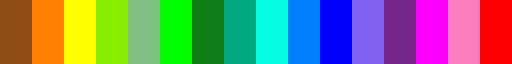

In [314]:
palette2 = [(0.5568627450980392, 0.29411764705882354, 0.07450980392156863),
 (1.0, 0.4980392156862745, 0.0),
 (1.0, 1.0, 0.0),
 (0.5254901960784314, 0.9254901960784314, 0.00392156862745098),
 (0.4980392156862745, 0.7490196078431373, 0.4980392156862745),
 (0.0, 1.0, 0.0),
 (0.054901960784313725, 0.49019607843137253, 0.08627450980392157),
 (0.0, 0.6549019607843137, 0.4980392156862745),
 (0.027450980392156862, 0.9921568627450981, 0.8901960784313725),
 (0.0, 0.4980392156862745, 1.0),
 (0.0, 0.0, 1.0),
 (0.5058823529411764, 0.3803921568627451, 0.9490196078431372),
 (0.4627450980392157, 0.15294117647058825, 0.5450980392156862),
 (1.0, 0.0, 1.0),
 (0.9803921568627451, 0.49411764705882355, 0.7450980392156863),
 (1.0, 0.0, 0.0)]
distinctipy.get_colormap(palette2) 

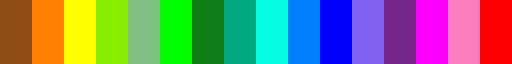

In [315]:
palette = palette2
distinctipy.get_colormap(palette)

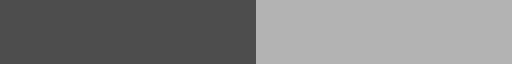

In [316]:
distinctipy.get_colormap([(0.3,0.3,0.3), (0.7,0.7,0.7)]) 

In [317]:
colors = {}
colors2 = {}

for old_block,new_block in remap_clusters_bipartite_plot.items():
    colors[old_block] = [1, *palette[new_block], 0.051]
    colors2[old_block] = [*palette[new_block]]

palette2 = [(0.3,0.3,0.3), (0.7,0.7,0.7)]
num_colors = 2
for old_block,new_block in remap_topics_bipartite_plot.items():
    colors[old_block] = [1, *palette2[new_block%num_colors], 0.1]
    colors2[old_block] = [*palette2[new_block%num_colors]]

In [318]:
color_vertices = bipartite_g.new_vp("vector<double>")

for v in bipartite_g.vertices():
    color_vertices[v] = colors2[bs_list[0][int(v)]] # [0, 0.68041891, 0.61514975, 0.19405452, 1]# 

In [319]:
color_edges = bipartite_g.new_ep("vector<double>")

for e in tqdm(bipartite_g.edges()):
    source,target = e
    color_edges[e] = colors[bs_list[0][int(source)]] # [0, 0.68041891, 0.61514975, 0.19405452, 1]# 

0it [00:00, ?it/s]

In [320]:
new_state.draw(
    output=paper_figures_folder+"bipartite_figure.png", 
    bg_color='w',
    output_size=(720, 720),
    vprops = {"size":4,#v_size, 
              "fill_color":color_vertices, "color":color_vertices, 
             },

    subsample_edges = 10000,
    beta = 0.8, 
    vsize_scale = 100,
    eprops = {"pen_width":1,
              "gradient":color_edges},
    hvprops = {"size":20, "pen_width":1,"color":[0.,0.,0.,0.7], "fill_color":[0.5,0.5,0.5,0.6], 
               "text":tv_names, "text_color":"black","font_size":8,
              },
    heprops = {"pen_width":3, "color":[0.5,0.5,0.5,0.6]},
    layout = hpos_new, 
    pos = pos_new,
    bip_aspect = 1.5)

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2af475a28be0, at 0x2af492c1f7f0>,
 <Graph object, directed, with 1562881 vertices and 1562880 edges, at 0x2af494c80100>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2af494c80100, at 0x2af490135730>)

In [321]:
cluster_table_df = pd.DataFrame({
    'cluster':['C'+str(key) for key in remap_clusters_bipartite_plot_inverse.keys()],
    'cluster in MT':list(remap_clusters_bipartite_plot_inverse.values()),
    'keyword':[one_keyword_lev_3[cluster] for cluster in remap_clusters_bipartite_plot_inverse.values()]
})
print(cluster_table_df)

   cluster  cluster in MT                  keyword
0       C0              0             Robot swarms
1       C1              1            Cybersecurity
2       C2              2              Smart grids
3       C3              3               Blockchain
4       C4              4       Federated learning
5       C5              5             Optimization
6       C6              6           Control theory
7       C7              7              Electricity
8       C8              8              Investments
9       C9              9           Edge-computing
10     C10             10        Telecommunication
11     C11             11    Wireless technologies
12     C12             12               Governance
13     C13             13              Environment
14     C14             14  Social network analysis
15     C15             15                   Health


In [322]:
cluster_table_df = pd.DataFrame({
    'cluster':['C'+str(key) for key in remap_clusters_bipartite_plot.keys()],
    'keyword':[one_keyword_lev_3[cluster] for cluster in remap_clusters_bipartite_plot_inverse.values()]
})
print(cluster_table_df)

   cluster                  keyword
0       C0             Robot swarms
1       C1            Cybersecurity
2       C2              Smart grids
3       C3               Blockchain
4       C4       Federated learning
5       C5             Optimization
6       C6           Control theory
7       C7              Electricity
8       C8              Investments
9       C9           Edge-computing
10     C10        Telecommunication
11     C11    Wireless technologies
12     C12               Governance
13     C13              Environment
14     C14  Social network analysis
15     C15                   Health


In [323]:
print(cluster_table_df.to_latex(index=False))

\begin{tabular}{ll}
\toprule
cluster &                 keyword \\
\midrule
     C0 &            Robot swarms \\
     C1 &           Cybersecurity \\
     C2 &             Smart grids \\
     C3 &              Blockchain \\
     C4 &      Federated learning \\
     C5 &            Optimization \\
     C6 &          Control theory \\
     C7 &             Electricity \\
     C8 &             Investments \\
     C9 &          Edge-computing \\
    C10 &       Telecommunication \\
    C11 &   Wireless technologies \\
    C12 &              Governance \\
    C13 &             Environment \\
    C14 & Social network analysis \\
    C15 &                  Health \\
\bottomrule
\end{tabular}



In [324]:
number_of_words = 10
topic_table_df = pd.DataFrame({
    'topic':['T'+str(key) for key in remap_topics_bipartite_plot_inverse.keys()],
    'words':[tuple([i for i in topics_df_by_level[initial_level][topic][:number_of_words] if not(pd.isna(i))]) for topic in remap_topics_bipartite_plot_inverse.keys()]
})
pd.options.display.max_colwidth = 200

In [325]:
print(topic_table_df.to_latex(index=False))

\begin{tabular}{ll}
\toprule
topic &                                                                                                          words \\
\midrule
   T0 &             (control, optimal, access, decentralised, cooperative, method, robust, peer, controller, multiple) \\
   T1 &                    (based, management, study, service, case, strategy, evaluation, review, community, towards) \\
   T2 &             (economic, urban, low, heterogeneous, web, organization, environmental, city, uncertain, business) \\
   T3 & (technology, flow, descentralización, em, décentralisation, technologies, na, descentralização, saúde, brasil) \\
   T4 &                (power, energy, centralized, information, supply, state, chain, coordination, planning, impact) \\
   T5 &      (performance, process, centralization, treatment, use, industrial, driven, cancer, project, centralizers) \\
   T6 &          (decentralization, local, development, health, governance, public, social, fiscal, governme